# FINAL PROJECT:  SENTIMENT ANALYSIS FOR MENTAL HEALTH ISSUES DETECTION

Team H

- Stuart Lance Richards-Weir 	(NIA: 288001)
- Pau Peirats			(NIA: 254382)
- Mireia Pou Oliveras		(NIA: 251725)


This project aims to build a **sentiment analysis LSTM-based model** focused on classifying text in order to detect potential mental health issues. The goal is to analyze sentences and relate them to mental states.

We are going to use a dataset that includes people’s statements (small sentences) paired with one of the following seven mental health statuses: normal, depression, suicidal, anxiety, stress, bi-polar, or personality disorder.

This notebook includes the models created

## Imports

In [ ]:
# Install the googletrans library
!pip install googletrans==4.0.0-rc1

from googletrans import Translator

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.4 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17396 sha256=bd501c05a581e251c7d750685e121bc3d4ad0d860bab655bc0d5548d5bed3fcf
  Stored in directory: /root/.cache/pip/wheels/39/17/6f/66a045ea3d168826074691b4b787b8f324d3f646d755443fda
Successfully built googletrans
  Attempting uninstall: hyperframe
    Found existing installation: hyperframe 6.1.0
    Uninstalling hyperfram

In [ ]:
#!pip install --upgrade gensim numpy
#from gensim.models import Word2Vec

In [ ]:
# -- Imports --
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import time
import random

#import pickle
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
import re
import string
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, f1_score
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

## 0. Data + functions definitions

### Data load

In [ ]:
# Define random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

data_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/data/'
results_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/results/'

Mounted at /content/drive


In [ ]:
# load dataset
data = pd.read_csv(data_path + 'sentiment_analysis_data.csv', sep=",")
data = data.drop(columns=["Unnamed: 0"])

# Drop null statements
data = data.dropna(axis=0)
data.info()
data.head(10000)

<class 'pandas.core.frame.DataFrame'>
Index: 52681 entries, 0 to 53042
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   statement  52681 non-null  object
 1   status     52681 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,I've shifted my focus to something else but I'...,Anxiety
4,"I'm restless and restless, it's been a month n...",Anxiety
...,...,...
10005,it is over guys. There is no future.You will l...,Suicidal
10006,[Tw: cutting] I have been had depression and a...,Suicidal
10007,I just got diagnosed with atypical depression ...,Depression
10008,"My husband finally, after all of these years, ...",Depression


### Training and Evaluation functions

In [ ]:
def train_model(model, train_loader, test_loader, loss_function, optimizer, num_epochs=30):
    """
    Trains and evaluates a PyTorch model for classification.
    Returns the trained model, losses, accuracies, and predictions for final evaluation.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    all_preds, all_labels = [], []

    for epoch in range(num_epochs):
        start_time = time.time()

        # Training
        model.train()
        train_loss, correct_train, total_train = 0, 0, 0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = loss_function(outputs, y_batch)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            predicted = outputs.argmax(dim=1)
            correct_train += (predicted == y_batch).sum().item()
            total_train += y_batch.size(0)

        avg_train_loss = train_loss / len(train_loader)
        train_accuracy = correct_train / total_train
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        # Validation
        model.eval()
        val_loss, correct_val, total_val = 0, 0, 0
        epoch_preds, epoch_labels = [], []
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                outputs = model(X_batch)
                loss = loss_function(outputs, y_batch)
                val_loss += loss.item()

                predicted = outputs.argmax(dim=1)
                epoch_preds.extend(predicted.cpu().numpy())
                epoch_labels.extend(y_batch.cpu().numpy())

                correct_val += (predicted == y_batch).sum().item()
                total_val += y_batch.size(0)

        avg_val_loss = val_loss / len(test_loader)
        val_accuracy = correct_val / total_val
        val_losses.append(avg_val_loss)
        val_accuracies.append(val_accuracy)

        all_preds, all_labels = epoch_preds, epoch_labels

        elapsed = time.time() - start_time
        if (epoch % 5 == 0) or (epoch == (num_epochs-1)):
          print(f"Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Train Acc: {train_accuracy:.4f} | Val Acc: {val_accuracy:.4f} | Time: {elapsed:.2f}s")

    return model, train_losses, val_losses, train_accuracies, val_accuracies, all_preds, all_labels

In [ ]:
def evaluate_model(label_encoder, all_preds, all_labels, train_losses, val_losses, train_accuracies, val_accuracies, save_name=None):
    """
    Evaluates and visualizes model performance: confusion matrix, loss and accuracy plots.
    If save_path_prefix is provided, plots will be saved with that prefix.
    """
    print("Maximum accuracy:", max(val_accuracies), "obtained at epoch", val_accuracies.index(max(val_accuracies)) + 1)
    print("Final accuracy:", val_accuracies[-1])
    print("Final loss:", val_losses[-1])

    f1_weighted = f1_score(all_labels, all_preds, average='weighted')
    print(f"\nWeighted F1-score: {f1_weighted:.4f}")

    # --- Classification Report ---
    print("\nClassification Report:\n")
    target_names = label_encoder.classes_
    print(classification_report(all_labels, all_preds, target_names=target_names))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.xticks(rotation=45)
    plt.savefig(results_path + save_name + "_confusion_matrix.png")
    plt.show()
    # Plot LOSS and ACCURACY
    plt.figure(figsize=(12, 5))

    # Loss
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss per Epoch')
    plt.legend()

    # Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.plot(val_accuracies, label='Val Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy per Epoch')
    plt.legend()
    plt.tight_layout()
    plt.savefig(results_path + save_name + "_loss_accuracy.png")
    plt.show()

### Basic dataset preparation

In [ ]:
def clean_text(text):
    """
    Clean text but preserve basic punctuation (.,!?).
    """
    text = text.lower()
    text = re.sub(r'https?://\S+|www\.\S+', '', text) # Remove URLs
    text = re.sub(r'<.*?>', '', text)        # Remove HTML tags
    text = re.sub(r'@\w+|#\w+', '', text)    # Remove mentions and hashtags
    text = re.sub(r'[^\x00-\x7F]+', '', text)  # Remove non-ASCII chars (emojis, symbols)
    text = re.sub(r'[^\w\s.,!?]', '', text)  # Keep basic punctuation
    text = text.replace("\n", " ")           # Remove newlines
    text = re.sub(r'\b\w*\d\w*\b', '', text) # Remove words containing numbers
    text = re.sub(r'\s+', ' ', text).strip() # Remove extra whitespace
    return text

In [ ]:
def create_tokenizer_from_dataframe(dataframe, text_col="statement", max_vocab_size=10000):
    """
    Cleans and fits a Keras tokenizer on the given dataframe.

    Returns:
    - tokenizer
    - cleaned_texts (Series)
    """
    cleaned_texts = dataframe[text_col].apply(clean_text)
    tokenizer = Tokenizer(num_words=max_vocab_size, oov_token="<OOV>")
    tokenizer.fit_on_texts(cleaned_texts)
    return tokenizer

In [ ]:
def prepare_dataset_for_lstm_with_tokenizer(dataframe, tokenizer, label_col="status",
                                            text_col="statement", max_seq_len=100,
                                            test_size=0.2, batch_size=64, random_state=42):
    """
    Uses an existing tokenizer to prepare DataLoaders.

    Parameters:
    - dataframe: Must have a cleaned text column.
    - tokenizer: A Keras Tokenizer already fitted.
    - text_col: Column with cleaned text to tokenize.

    Returns:
    - train_loader, test_loader, label_encoder
    """
    sequences = tokenizer.texts_to_sequences(dataframe[text_col])
    padded_sequences = pad_sequences(sequences, maxlen=max_seq_len, padding='post', truncating='post')

    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(dataframe[label_col])

    X_train, X_test, y_train, y_test = train_test_split(padded_sequences, y, test_size=test_size, random_state=random_state)

    X_train_tensor = torch.tensor(X_train, dtype=torch.long)
    X_test_tensor = torch.tensor(X_test, dtype=torch.long)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    y_test_tensor = torch.tensor(y_test, dtype=torch.long)

    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)

    return train_loader, test_loader, label_encoder

In [ ]:
def build_embedding_matrix_from_glove(tokenizer, glove_index, embedding_dim=100, max_vocab_size=10000):
    """
    Builds an embedding matrix matching the tokenizer's vocabulary using GloVe.

    Parameters:
    - tokenizer: fitted Keras Tokenizer
    - glove_index: dict of pre-loaded GloVe embeddings
    - embedding_dim: e.g. 100
    - max_vocab_size: limit to top-N most frequent tokens

    Returns:
    - embedding_matrix (numpy array of shape [num_words, embedding_dim])
    """
    vocab = tokenizer.word_index
    num_words = min(max_vocab_size, len(vocab) + 1)
    embedding_matrix = np.zeros((num_words, embedding_dim))

    for word, i in vocab.items():
        if i >= num_words:
            continue
        embedding_vector = glove_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector
        else:
            embedding_matrix[i] = np.random.normal(scale=0.6, size=(embedding_dim,))

    return embedding_matrix

## Prepare tokenizer

In [ ]:
MAX_VOCAB_SIZE = 10000
MAX_SEQ_LEN = 100
BATCH_SIZE = 64
TEST_SIZE = 0.2
RANDOM_STATE = 42

tokenizer = create_tokenizer_from_dataframe(data, text_col="statement", max_vocab_size=MAX_VOCAB_SIZE)
vocab = tokenizer

## max sequence length

In [ ]:
class BaselineLSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super(BaselineLSTM, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output

Epoch 1/30 | Train Loss: 1.2567 | Val Loss: 1.0396 | Train Acc: 0.5233 | Val Acc: 0.5670 | Time: 3.61s
Epoch 6/30 | Train Loss: 0.5629 | Val Loss: 0.6693 | Train Acc: 0.7824 | Val Acc: 0.7438 | Time: 2.58s
Epoch 11/30 | Train Loss: 0.3615 | Val Loss: 0.7358 | Train Acc: 0.8621 | Val Acc: 0.7475 | Time: 2.57s
Epoch 16/30 | Train Loss: 0.2188 | Val Loss: 0.9200 | Train Acc: 0.9241 | Val Acc: 0.7428 | Time: 2.11s
Epoch 21/30 | Train Loss: 0.1295 | Val Loss: 1.0852 | Train Acc: 0.9599 | Val Acc: 0.7411 | Time: 2.14s
Epoch 26/30 | Train Loss: 0.0814 | Val Loss: 1.3567 | Train Acc: 0.9761 | Val Acc: 0.7354 | Time: 2.10s
Epoch 30/30 | Train Loss: 0.0554 | Val Loss: 1.5110 | Train Acc: 0.9837 | Val Acc: 0.7332 | Time: 2.09s
Maximum accuracy: 0.7524912214102686 obtained at epoch 10
Final accuracy: 0.7332257758375249
Final loss: 1.5110451058907943

Weighted F1-score: 0.7355

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.75    

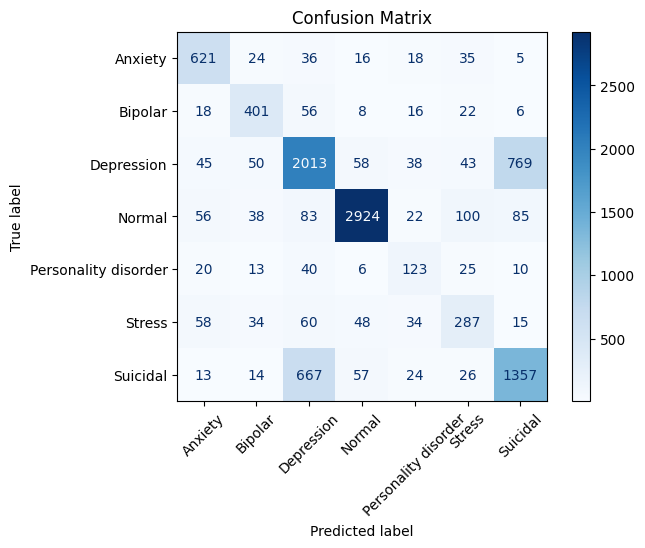

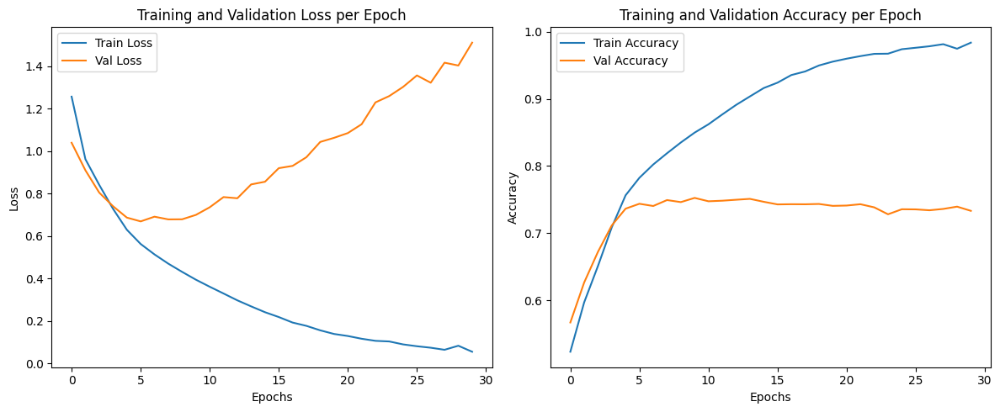

Epoch 1/30 | Train Loss: 1.4154 | Val Loss: 1.2065 | Train Acc: 0.4684 | Val Acc: 0.5411 | Time: 3.05s
Epoch 6/30 | Train Loss: 0.6152 | Val Loss: 0.6531 | Train Acc: 0.7542 | Val Acc: 0.7426 | Time: 2.59s
Epoch 11/30 | Train Loss: 0.3787 | Val Loss: 0.6735 | Train Acc: 0.8545 | Val Acc: 0.7640 | Time: 2.24s
Epoch 16/30 | Train Loss: 0.2412 | Val Loss: 0.8259 | Train Acc: 0.9133 | Val Acc: 0.7591 | Time: 2.21s
Epoch 21/30 | Train Loss: 0.1499 | Val Loss: 0.9663 | Train Acc: 0.9519 | Val Acc: 0.7563 | Time: 2.21s
Epoch 26/30 | Train Loss: 0.0987 | Val Loss: 1.1211 | Train Acc: 0.9698 | Val Acc: 0.7470 | Time: 2.24s
Epoch 30/30 | Train Loss: 0.0679 | Val Loss: 1.2295 | Train Acc: 0.9805 | Val Acc: 0.7512 | Time: 2.21s
Maximum accuracy: 0.7639745658156971 obtained at epoch 11
Final accuracy: 0.7511625699914587
Final loss: 1.2295460827422864

Weighted F1-score: 0.7519

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.79    

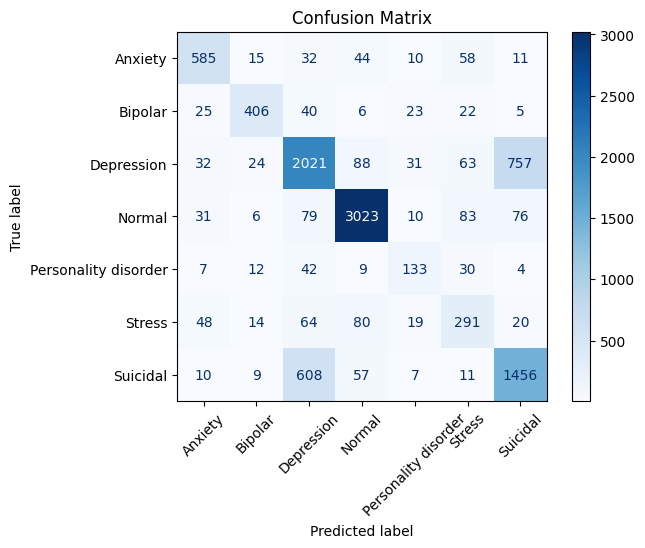

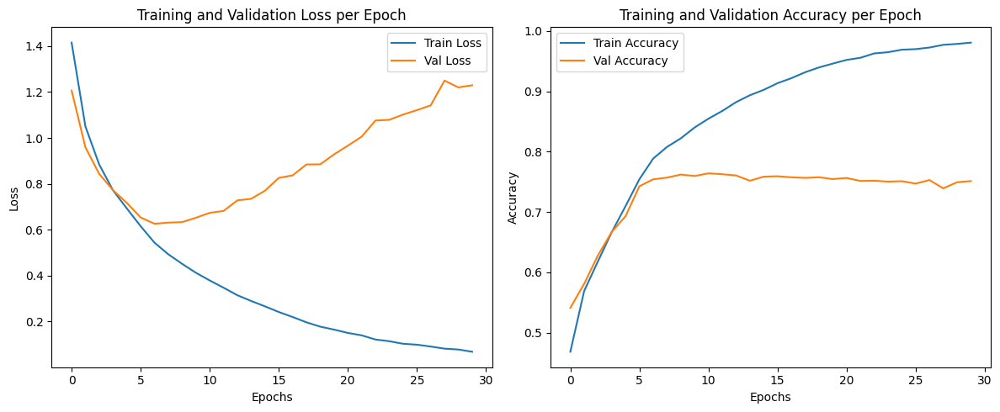

Epoch 1/30 | Train Loss: 1.6188 | Val Loss: 1.6044 | Train Acc: 0.3152 | Val Acc: 0.3605 | Time: 3.76s
Epoch 6/30 | Train Loss: 0.7627 | Val Loss: 0.7974 | Train Acc: 0.6768 | Val Acc: 0.6844 | Time: 4.00s
Epoch 11/30 | Train Loss: 0.4648 | Val Loss: 0.6857 | Train Acc: 0.8213 | Val Acc: 0.7421 | Time: 5.87s
Epoch 16/30 | Train Loss: 0.3070 | Val Loss: 0.7691 | Train Acc: 0.8886 | Val Acc: 0.7481 | Time: 3.65s
Epoch 21/30 | Train Loss: 0.2008 | Val Loss: 0.9341 | Train Acc: 0.9316 | Val Acc: 0.7441 | Time: 5.05s
Epoch 26/30 | Train Loss: 0.1399 | Val Loss: 1.0631 | Train Acc: 0.9536 | Val Acc: 0.7430 | Time: 3.81s
Epoch 30/30 | Train Loss: 0.1073 | Val Loss: 1.1053 | Train Acc: 0.9662 | Val Acc: 0.7343 | Time: 3.69s
Maximum accuracy: 0.7539147765018506 obtained at epoch 14
Final accuracy: 0.7342697162380184
Final loss: 1.1053144996816462

Weighted F1-score: 0.7383

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.76    

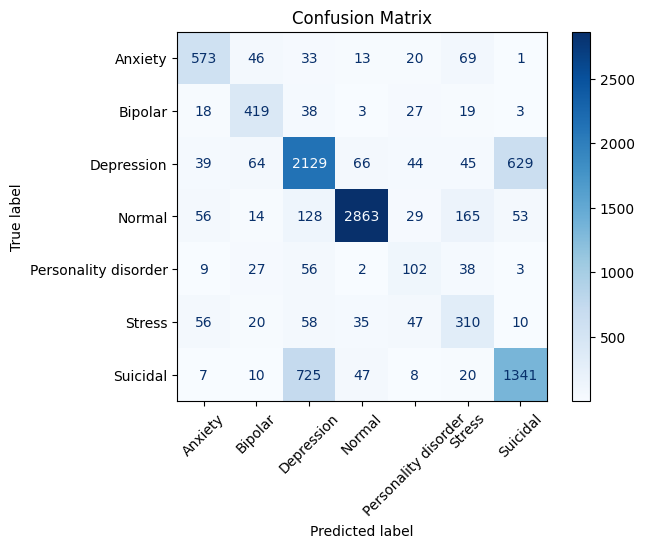

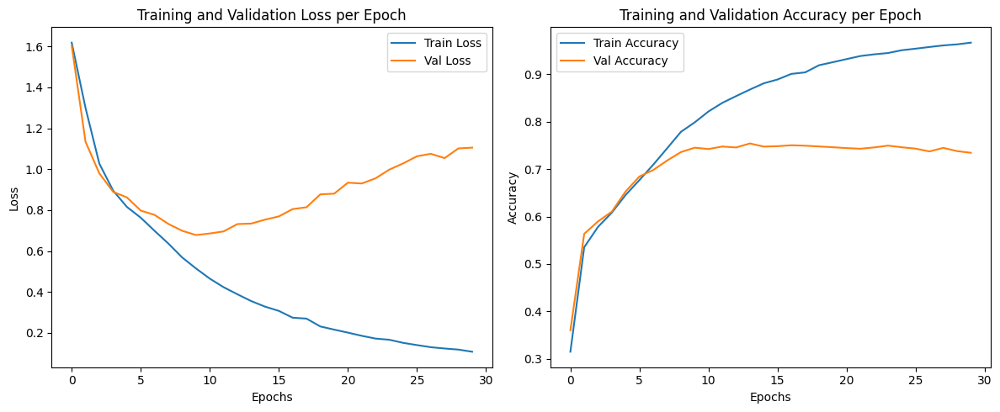

Epoch 1/30 | Train Loss: 1.6247 | Val Loss: 1.6239 | Train Acc: 0.3076 | Val Acc: 0.3166 | Time: 6.74s
Epoch 6/30 | Train Loss: 1.1343 | Val Loss: 1.0690 | Train Acc: 0.5681 | Val Acc: 0.5590 | Time: 6.14s
Epoch 11/30 | Train Loss: 0.7968 | Val Loss: 0.9045 | Train Acc: 0.6640 | Val Acc: 0.6460 | Time: 6.29s
Epoch 16/30 | Train Loss: 0.6383 | Val Loss: 0.9034 | Train Acc: 0.7460 | Val Acc: 0.6655 | Time: 6.15s
Epoch 21/30 | Train Loss: 0.5223 | Val Loss: 0.9434 | Train Acc: 0.7984 | Val Acc: 0.6779 | Time: 6.59s
Epoch 26/30 | Train Loss: 0.4395 | Val Loss: 1.0100 | Train Acc: 0.8406 | Val Acc: 0.6839 | Time: 6.25s
Epoch 30/30 | Train Loss: 0.3928 | Val Loss: 1.0388 | Train Acc: 0.8689 | Val Acc: 0.6844 | Time: 6.28s
Maximum accuracy: 0.6905191230900636 obtained at epoch 29
Final accuracy: 0.6843503843598747
Final loss: 1.038779986265934

Weighted F1-score: 0.6815

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.46     

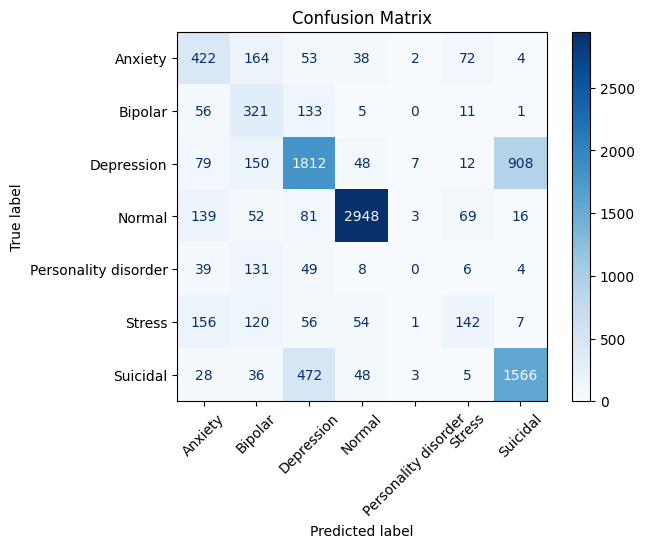

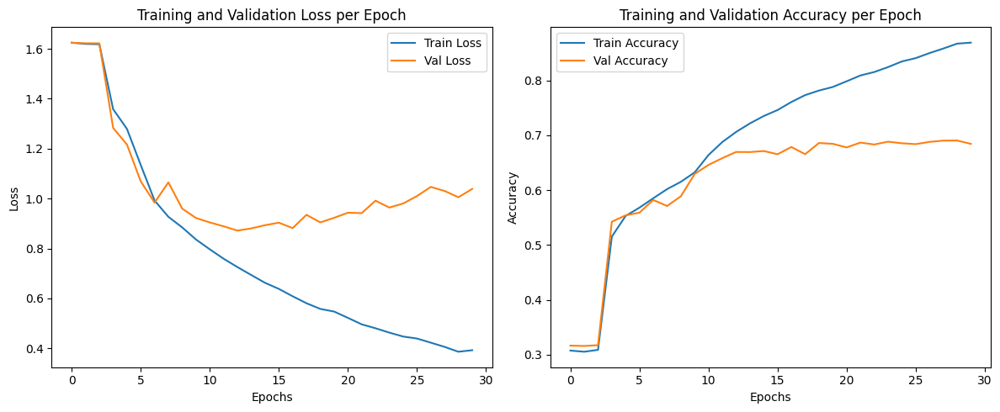

Epoch 1/30 | Train Loss: 1.6254 | Val Loss: 1.6264 | Train Acc: 0.3036 | Val Acc: 0.3139 | Time: 11.38s


KeyboardInterrupt: 

In [ ]:
data1 = data.copy()
for seq in [100, 200, 500, 1000, 2000, 5000, 10000]:
    #prepare dataset with the predefined tokenizer
    train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
        dataframe=data1,
        tokenizer=vocab,
        text_col="statement",
        label_col="status",
        max_seq_len=seq,
        test_size=TEST_SIZE,
        batch_size=BATCH_SIZE,
        random_state=RANDOM_STATE
    )

    model = BaselineLSTM(
        vocab_size=MAX_VOCAB_SIZE,
        embedding_dim=64,
        hidden_dim=64,
        output_dim=len(label_encoder.classes_)  # Number of classes
    )
    loss_function = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    model1, train_losses1, val_losses1, train_accuracies1, val_accuracies1, all_preds1, all_labels1 = train_model(
        model=model,
        train_loader=train_loader,
        test_loader=test_loader,
        loss_function=loss_function,
        optimizer=optimizer,
        num_epochs=30
    )

    # 4. -- Evaluate the model --
    evaluate_model(
        label_encoder=label_encoder,
        all_preds=all_preds1,
        all_labels=all_labels1,
        train_losses=train_losses1,
        val_losses=val_losses1,
        train_accuracies=train_accuracies1,
        val_accuracies=val_accuracies1,
        save_name=f"sequence_length/baseline_model{seq}"
    )

## 1. Baseline model
(similar to https://www.kaggle.com/code/rafaeldrago/lstm-sentiment-prediction/notebook)

In [ ]:
# 1. -- Prepare data --
data1 = data.copy()

#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=data1,
    tokenizer=vocab,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)

In [ ]:
# 2. -- Define a baseline LSTM --
class BaselineLSTM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super(BaselineLSTM, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output

In [ ]:
# 3. -- Train the model --
model = BaselineLSTM(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)  # Number of classes
)
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

model1, train_losses1, val_losses1, train_accuracies1, val_accuracies1, all_preds1, all_labels1 = train_model(
    model=model,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2567 | Val Loss: 1.0396 | Train Acc: 0.5233 | Val Acc: 0.5670 | Time: 2.92s
Epoch 6/30 | Train Loss: 0.5629 | Val Loss: 0.6693 | Train Acc: 0.7824 | Val Acc: 0.7438 | Time: 2.12s
Epoch 11/30 | Train Loss: 0.3615 | Val Loss: 0.7358 | Train Acc: 0.8621 | Val Acc: 0.7475 | Time: 2.04s
Epoch 16/30 | Train Loss: 0.2188 | Val Loss: 0.9200 | Train Acc: 0.9241 | Val Acc: 0.7428 | Time: 2.62s
Epoch 21/30 | Train Loss: 0.1295 | Val Loss: 1.0852 | Train Acc: 0.9599 | Val Acc: 0.7411 | Time: 2.88s
Epoch 26/30 | Train Loss: 0.0814 | Val Loss: 1.3567 | Train Acc: 0.9761 | Val Acc: 0.7354 | Time: 2.06s
Epoch 30/30 | Train Loss: 0.0554 | Val Loss: 1.5110 | Train Acc: 0.9837 | Val Acc: 0.7332 | Time: 2.44s


Maximum accuracy: 0.7524912214102686 obtained at epoch 10
Final accuracy: 0.7332257758375249
Final loss: 1.5110451058907943

Weighted F1-score: 0.7355

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.75      0.82      0.78       755
             Bipolar       0.70      0.76      0.73       527
          Depression       0.68      0.67      0.67      3016
              Normal       0.94      0.88      0.91      3308
Personality disorder       0.45      0.52      0.48       237
              Stress       0.53      0.54      0.53       536
            Suicidal       0.60      0.63      0.62      2158

            accuracy                           0.73     10537
           macro avg       0.66      0.69      0.68     10537
        weighted avg       0.74      0.73      0.74     10537



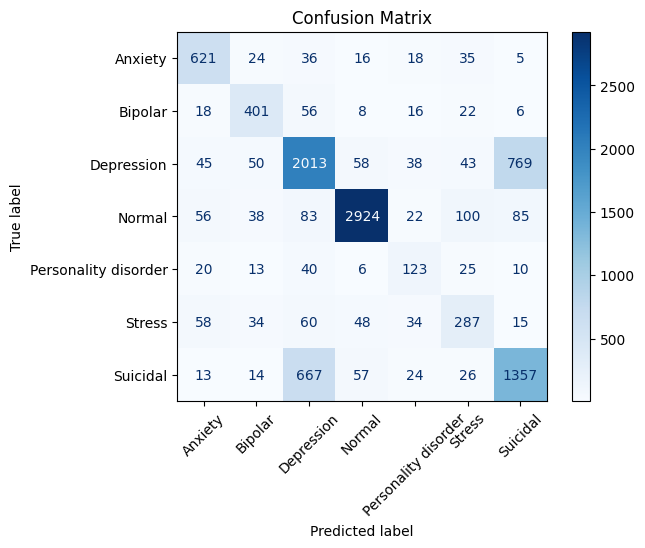

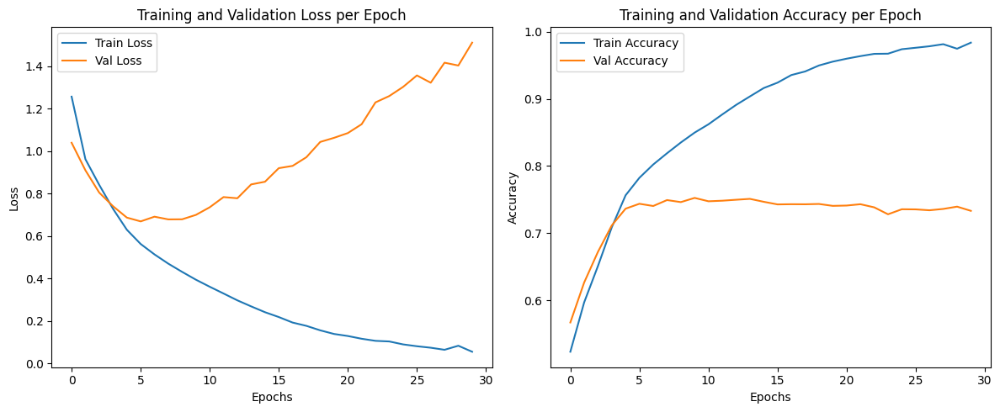

In [ ]:
# 4. -- Evaluate the model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds1,
    all_labels=all_labels1,
    train_losses=train_losses1,
    val_losses=val_losses1,
    train_accuracies=train_accuracies1,
    val_accuracies=val_accuracies1,
    save_name="baseline_model"
)

In [ ]:
torch.save(model1.state_dict(), results_path + 'models/model1_baseline_weights.pt')

## Try Lemmatization

In [ ]:
def clean_text(text):
    """
    Clean text but preserve basic punctuation (.,!?).
    """
    text = text.lower()
    text = re.sub(r'https?://\S+|www\.\S+', '', text) # Remove URLs
    text = re.sub(r'<.*?>', '', text)        # Remove HTML tags
    text = re.sub(r'@\w+|#\w+', '', text)    # Remove mentions and hashtags
    text = re.sub(r'[^\x00-\x7F]+', '', text)  # Remove non-ASCII chars (emojis, symbols)
    text = re.sub(r'[^\w\s.,!?]', '', text)  # Keep basic punctuation
    text = text.replace("\n", " ")           # Remove newlines
    text = re.sub(r'\b\w*\d\w*\b', '', text) # Remove words containing numbers
    text = re.sub(r'\s+', ' ', text).strip() # Remove extra whitespace
    # Remove commas??
    text = re.sub(r',', '', text)
    return text

In [ ]:
dataLEM = data.copy()

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag, word_tokenize

nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('wordnet')
nltk.download('omw-1.4')

lemmatizer = WordNetLemmatizer()

# Helper to convert nltk POS tags to wordnet POS
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN  # Default

def lemmatize_text(text):
    tokens = word_tokenize(text)
    pos_tags = pos_tag(tokens)
    lemmatized = [
        lemmatizer.lemmatize(word.lower(), get_wordnet_pos(tag))
        for word, tag in pos_tags
    ]
    return ' '.join(lemmatized)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
dataLEM['statement_lemmatized'] = dataLEM['statement'].apply(lemmatize_text)
dataLEM['statement_lemmatized_and_cleaned'] = dataLEM['statement_lemmatized'].apply(clean_text)

In [ ]:
dataLEM['statement_lemmatized'].head()

,statement_lemmatized
0,oh my gosh
1,"trouble sleeping , confuse mind , restless hea..."
2,"all wrong , back off dear , forward doubt . st..."
3,i 've shift my focus to something else but i '...
4,"i 'm restless and restless , it 's be a month ..."


In [ ]:
dataLEM['statement'].head()

,statement
0,oh my gosh
1,"trouble sleeping, confused mind, restless hear..."
2,"All wrong, back off dear, forward doubt. Stay ..."
3,I've shifted my focus to something else but I'...
4,"I'm restless and restless, it's been a month n..."


In [ ]:
dataLEM['statement_lemmatized_and_cleaned'].head()

,statement_lemmatized_and_cleaned
0,oh my gosh
1,trouble sleeping confuse mind restless heart...
2,all wrong back off dear forward doubt . stay...
3,i ve shift my focus to something else but i m ...
4,i m restless and restless it s be a month now...


In [ ]:
#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=data1,
    tokenizer=vocab,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)

In [ ]:
# Train the model with lemmatized text
modelLEM = BaselineLSTM(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,  # You can adjust this
    hidden_dim=64,     # You can adjust this
    output_dim=len(label_encoderLEM.classes_)  # Number of classes
)
loss_functionLEM = nn.CrossEntropyLoss()
optimizerLEM = torch.optim.Adam(modelLEM.parameters(), lr=0.001)

modelLEM, train_lossesLEM, val_lossesLEM, train_accuraciesLEM, val_accuraciesLEM, all_predsLEM, all_labelsLEM = train_model(
    model=modelLEM,
    train_loader=train_loaderLEM,
    test_loader=test_loaderLEM,
    loss_function=loss_functionLEM,
    optimizer=optimizerLEM,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2539 | Val Loss: 1.0577 | Train Acc: 0.5252 | Val Acc: 0.5587 | Time: 2.99s
Epoch 6/30 | Train Loss: 0.5768 | Val Loss: 0.6463 | Train Acc: 0.7728 | Val Acc: 0.7462 | Time: 2.63s
Epoch 11/30 | Train Loss: 0.3969 | Val Loss: 0.6782 | Train Acc: 0.8458 | Val Acc: 0.7540 | Time: 3.27s
Epoch 16/30 | Train Loss: 0.2777 | Val Loss: 0.8138 | Train Acc: 0.8964 | Val Acc: 0.7448 | Time: 2.86s
Epoch 21/30 | Train Loss: 0.1975 | Val Loss: 0.9407 | Train Acc: 0.9295 | Val Acc: 0.7384 | Time: 5.60s
Epoch 26/30 | Train Loss: 0.1400 | Val Loss: 1.1056 | Train Acc: 0.9527 | Val Acc: 0.7335 | Time: 2.92s
Epoch 30/30 | Train Loss: 0.1042 | Val Loss: 1.2836 | Train Acc: 0.9667 | Val Acc: 0.7341 | Time: 4.39s


Maximum accuracy: 0.7554332352662048 obtained at epoch 10
Final accuracy: 0.7340799088924741

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.74      0.77      0.75       755
             Bipolar       0.71      0.77      0.74       527
          Depression       0.67      0.65      0.66      3016
              Normal       0.92      0.90      0.91      3308
Personality disorder       0.50      0.51      0.51       237
              Stress       0.53      0.59      0.56       536
            Suicidal       0.62      0.64      0.63      2158

            accuracy                           0.73     10537
           macro avg       0.67      0.69      0.68     10537
        weighted avg       0.74      0.73      0.74     10537



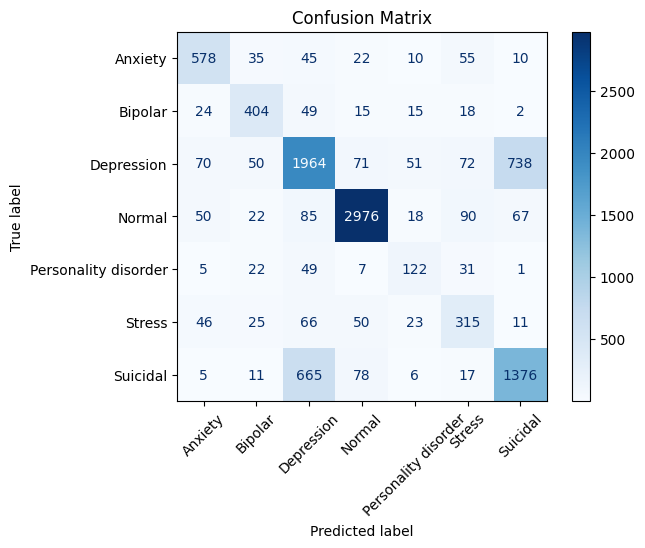

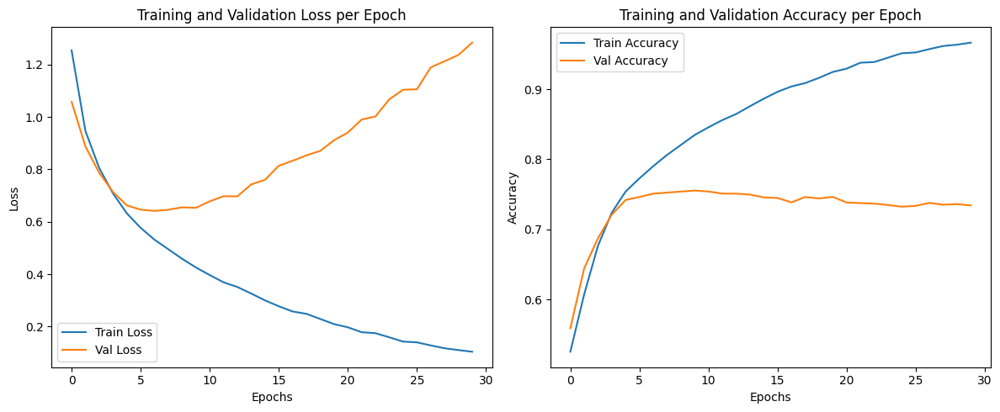

In [ ]:
evaluate_model(
    label_encoder=label_encoderLEM,
    all_preds=all_predsLEM,
    all_labels=all_labelsLEM,
    train_losses=train_lossesLEM,
    val_losses=val_lossesLEM,
    train_accuracies=train_accuraciesLEM,
    val_accuracies=val_accuraciesLEM,
    save_name="baseline_model_lemmatized"
)

In [ ]:
torch.save(modelLEM.state_dict(), results_path + 'models/model2_lemmatized_cleaned_weights.pt')

## 2. Model after data cleaning

In [ ]:
# 1. -- Prepare data --
data2 = data.copy()

# Remove outliers that are too long
print("Length before outlier removal:", len(data2))
data2 = data2[data2['statement'].str.len() < 15000]
print("Length after outlier removal:", len(data2))

# Clean text
data2['statement'] = data2['statement'].apply(clean_text)
display(data2.head(5))

#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=data2,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)


Length before outlier removal: 52681
Length after outlier removal: 52675


,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"all wrong, back off dear, forward doubt. stay ...",Anxiety
3,ive shifted my focus to something else but im ...,Anxiety
4,"im restless and restless, its been a month now...",Anxiety


In [ ]:
for i in range(15, 18):
    print("Original:", data["statement"].iloc[i])
    print("Cleaned :", data2["statement"].iloc[i], "\n")

Original: Every time I wake up, I'm definitely nervous and excited, until when are you going to try ™‚
Cleaned : every time i wake up, im definitely nervous and excited, until when are you going to try 

Original: I can only hope, even though I'm worried if it starts like this....
Cleaned : i can only hope, even though im worried if it starts like this.... 

Original: restive = restless, restless
Cleaned : restive restless, restless 



In [ ]:
# 2. -- Train the model --
model2 = BaselineLSTM(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)  # Number of classes
)
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model2.parameters(), lr=0.001)

model2, train_losses2, val_losses2, train_accuracies2, val_accuracies2, all_preds2, all_labels2 = train_model(
    model=model2,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2519 | Val Loss: 1.0629 | Train Acc: 0.5268 | Val Acc: 0.5660 | Time: 2.21s
Epoch 6/30 | Train Loss: 0.5948 | Val Loss: 0.6903 | Train Acc: 0.7655 | Val Acc: 0.7342 | Time: 2.17s
Epoch 11/30 | Train Loss: 0.3705 | Val Loss: 0.7261 | Train Acc: 0.8612 | Val Acc: 0.7475 | Time: 2.16s
Epoch 16/30 | Train Loss: 0.2217 | Val Loss: 0.8906 | Train Acc: 0.9224 | Val Acc: 0.7407 | Time: 2.33s
Epoch 21/30 | Train Loss: 0.1322 | Val Loss: 1.1522 | Train Acc: 0.9581 | Val Acc: 0.7320 | Time: 2.78s
Epoch 26/30 | Train Loss: 0.0795 | Val Loss: 1.3023 | Train Acc: 0.9765 | Val Acc: 0.7354 | Time: 2.52s
Epoch 30/30 | Train Loss: 0.0605 | Val Loss: 1.4550 | Train Acc: 0.9826 | Val Acc: 0.7356 | Time: 2.13s


Maximum accuracy: 0.753108685334599 obtained at epoch 10
Final accuracy: 0.7356430944470812
Final loss: 1.4550482587380842

Weighted F1-score: 0.7378

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.73      0.77      0.75       783
             Bipolar       0.77      0.74      0.75       530
          Depression       0.69      0.69      0.69      3027
              Normal       0.93      0.89      0.91      3318
Personality disorder       0.47      0.56      0.52       218
              Stress       0.51      0.58      0.54       541
            Suicidal       0.61      0.60      0.61      2118

            accuracy                           0.74     10535
           macro avg       0.67      0.69      0.68     10535
        weighted avg       0.74      0.74      0.74     10535



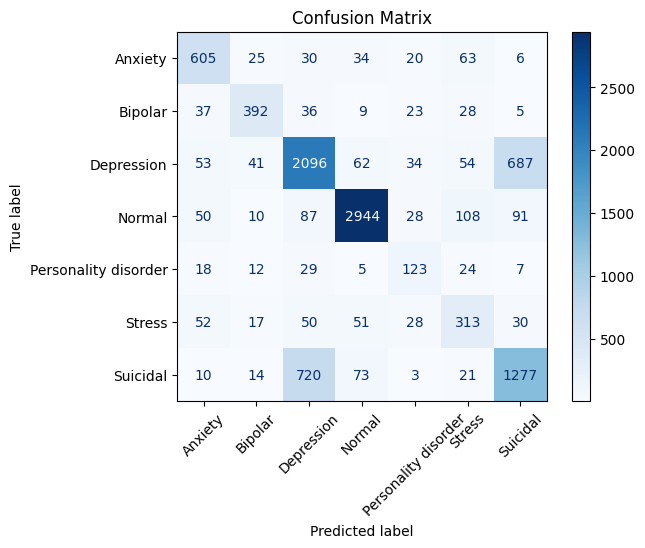

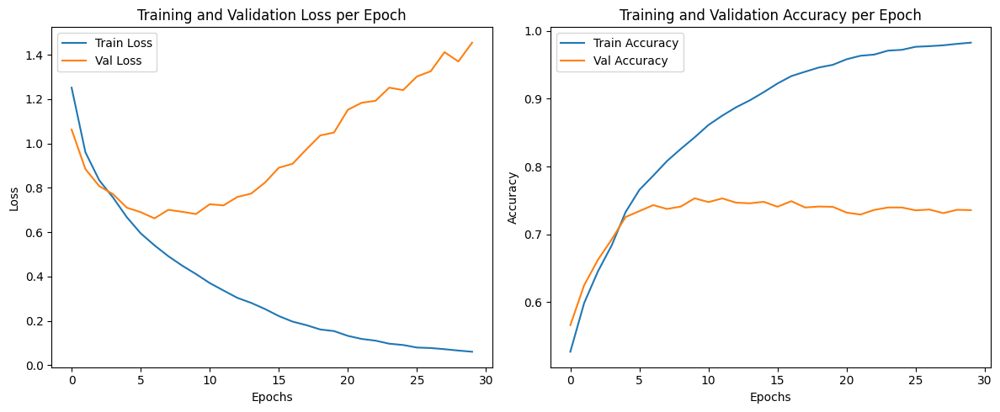

In [ ]:
# 3. -- Evaluate the model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds2,
    all_labels=all_labels2,
    train_losses=train_losses2,
    val_losses=val_losses2,
    train_accuracies=train_accuracies2,
    val_accuracies=val_accuracies2,
    save_name="cleaned_model"
)

In [ ]:
torch.save(model2.state_dict(), results_path + 'models/model2_cleaned_weights.pt')

## 3. Model after stopword removal

In [ ]:
#function to remove stop words
def remove_stopwords(text):
    """
    Remove stopwords from text.
    """
     # Remove stopwords
    tokens = text.split()
    filtered_tokens = [word for word in tokens if word not in stop_words_expanded]
    return ' '.join(filtered_tokens)

#define stop word set
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
print(stop_words)

{'over', 'at', 'yourselves', "you're", 'hadn', 'until', 'this', "i'll", 'while', 'further', 'under', 'be', 'above', 'by', 'all', 'so', 'out', "needn't", "they'll", 'him', 'both', "he'd", 're', 'down', 'or', 'on', 'itself', "it's", "doesn't", 'again', 't', 'then', 'you', "he'll", 'no', 'd', 'he', 'now', "hasn't", 'some', 'if', "we'd", 'doing', 'we', 'they', 'ma', "we're", "they're", 'shouldn', 'other', "you'd", "you've", 'should', "it'd", 'and', 'here', 'there', "i'd", 'to', "haven't", "don't", 'had', "it'll", 'i', 'do', 'own', 's', 'ours', 'themselves', 'as', 've', 'yours', 'does', "mightn't", 'll', "you'll", "wasn't", 'that', "we'll", 'a', 'its', 'when', 'few', 'from', 'between', "aren't", 'your', 'can', 'himself', "didn't", 'm', 'been', 'o', "mustn't", 'she', "weren't", 'each', 'isn', 'don', 'once', 'wouldn', 'more', 'me', 'before', 'have', "he's", "they'd", 'our', 'up', 'into', 'their', 'not', 'wasn', 'where', 'only', 'aren', 'didn', 'same', "she's", 'are', 'very', "should've", "had

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
#take out negations --> they have meaning
print("Initial length:", len(stop_words))

negation_words = {"no", "not", "nor", "never", "n't"}
stop_words_without_negation = []
for word in stop_words:
  for negation in negation_words:
    if negation in word:
      break
  else:
    stop_words_without_negation.append(word)

stop_words_without_negation = set(stop_words_without_negation)
print("Length after negation removal:", len(stop_words_without_negation))

#Expand stopwords to include versions without apostrophes
stop_words_expanded = stop_words_without_negation.union({word.replace("'", "") for word in stop_words_without_negation})
print("Length after apostrophe expansion:", len(stop_words_expanded))
print(stop_words_expanded)

Initial length: 198
Length after negation removal: 176
Length after apostrophe expansion: 201
{"you're", 'until', 'this', 'youre', 'while', 'im', 'be', 'by', 'so', "they'll", 'hed', 'him', 'down', 'or', "it's", 't', 'again', 'you', 'theyve', "he'll", 'd', 'youd', 'if', 'ma', "we're", "you'd", 'shouldn', 'should', "it'd", 'and', 'there', 'to', 'had', 'i', 'own', 's', 'themselves', 'ours', 'theyre', 'as', 'does', 'll', "you'll", 'a', 'when', 'few', 'can', 'himself', 'm', 'been', 'she', 'wouldn', 'don', 'ive', 'more', 'me', "he's", "they'd", 'into', 'their', 'youve', 'only', 'itll', 'didn', "she's", 'thatll', 'very', "should've", 'her', 'than', 'these', 'mightn', 'shan', "she'd", 'in', 'but', 'of', 'myself', 'off', 'shell', 'through', 'those', 'against', "i'm", 'y', 'his', 'during', 'below', 'weren', 'ill', 'hell', 'most', 'well', 'it', 'ain', "they've", 'needn', 'shed', 'weve', 'am', 'what', 'has', 'about', 'yourself', 'theirs', 'being', 'whom', 'over', 'at', 'yourselves', 'hadn', "i'll"

In [ ]:
# 1. -- Prepare data --
data3 = data.copy()
data3 = data3[data3['statement'].str.len() < 15000]  # Outlier filter
data3['statement'] = data3['statement'].apply(clean_text)
data3['statement'] = data3['statement'].apply(remove_stopwords)

data3.head(5)

#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=data2,
    tokenizer=vocab,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)

In [ ]:
# 2. -- Train the model --
model3 = BaselineLSTM(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model3.parameters(), lr=0.001)

model3, train_losses3, val_losses3, train_accuracies3, val_accuracies3, all_preds3, all_labels3 = train_model(
    model=model3,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2860 | Val Loss: 1.1589 | Train Acc: 0.5219 | Val Acc: 0.5370 | Time: 2.23s
Epoch 6/30 | Train Loss: 0.6541 | Val Loss: 0.7112 | Train Acc: 0.7401 | Val Acc: 0.7280 | Time: 2.51s
Epoch 11/30 | Train Loss: 0.4003 | Val Loss: 0.6799 | Train Acc: 0.8464 | Val Acc: 0.7538 | Time: 2.73s
Epoch 16/30 | Train Loss: 0.2447 | Val Loss: 0.8443 | Train Acc: 0.9123 | Val Acc: 0.7421 | Time: 2.67s
Epoch 21/30 | Train Loss: 0.1501 | Val Loss: 1.0568 | Train Acc: 0.9508 | Val Acc: 0.7387 | Time: 2.16s
Epoch 26/30 | Train Loss: 0.0863 | Val Loss: 1.3356 | Train Acc: 0.9743 | Val Acc: 0.7399 | Time: 2.17s
Epoch 30/30 | Train Loss: 0.0672 | Val Loss: 1.4413 | Train Acc: 0.9805 | Val Acc: 0.7394 | Time: 2.13s


Maximum accuracy: 0.7539629805410536 obtained at epoch 15
Final accuracy: 0.7394399620313241
Final loss: 1.441275698488409

Weighted F1-score: 0.7384

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.78      0.77      0.77       783
             Bipolar       0.70      0.74      0.72       530
          Depression       0.67      0.72      0.69      3027
              Normal       0.91      0.91      0.91      3318
Personality disorder       0.55      0.54      0.55       218
              Stress       0.53      0.54      0.54       541
            Suicidal       0.63      0.56      0.59      2118

            accuracy                           0.74     10535
           macro avg       0.68      0.68      0.68     10535
        weighted avg       0.74      0.74      0.74     10535



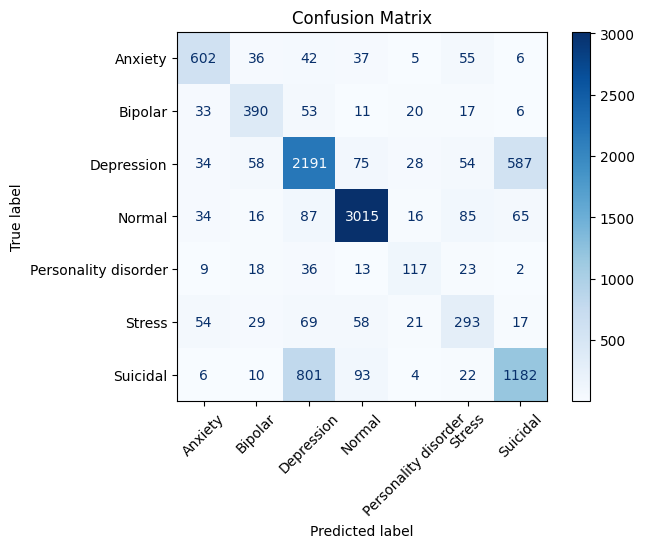

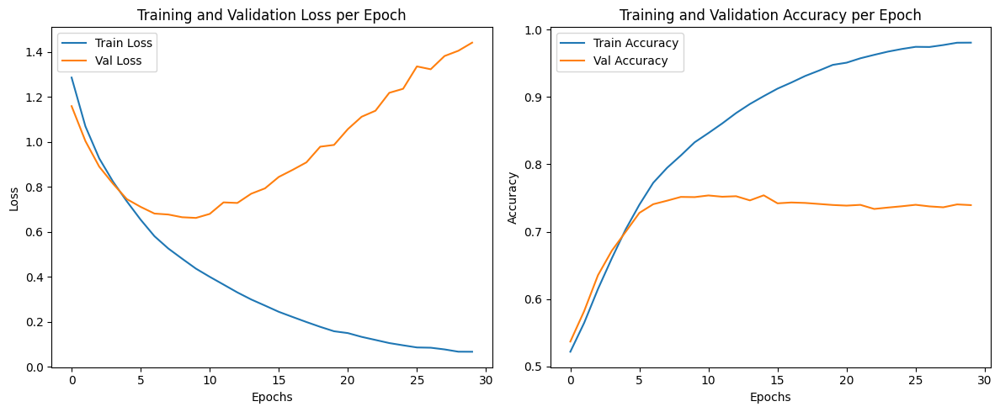

In [ ]:
# 3. -- Evaluate the model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds3,
    all_labels=all_labels3,
    train_losses=train_losses3,
    val_losses=val_losses3,
    train_accuracies=train_accuracies3,
    val_accuracies=val_accuracies3,
    save_name="stopwords_removed_model"
)

In [ ]:
torch.save(model3.state_dict(), results_path + 'models/model3_stopwords_weights.pt')

## 4. Model after using pretrained embeddings

### 4.1 Word2Vec

In [ ]:
!pip install gensim
from gensim.models import Word2Vec

# 1. -- Data Preparation --
data_wv = data.copy()

sentences = [text.split() for text in data_wv['statement'].tolist()]
word2vec_model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)

embedding_dim = 100
vocab = vocab.word_index #vocab is a Keras Tokenizer object
num_words = min(MAX_VOCAB_SIZE, len(vocab) + 1)
embedding_matrix = np.zeros((num_words, embedding_dim))

for word, i in vocab.items():
    if i >= num_words:
        continue
    if word in word2vec_model.wv:
        embedding_matrix[i] = word2vec_model.wv[word]
    else:
        embedding_matrix[i] = np.random.normal(scale=0.6, size=(embedding_dim,))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 65.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 83.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 15.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
gradio 5.31.0 r

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [ ]:
# 2. -- New model definition --
class Word2VecLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim):
        super(Word2VecLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False  # Si quieres embeddings fijos
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output

In [ ]:
# 3. -- Model training --
model_w2v = Word2VecLSTM(
    embedding_matrix=embedding_matrix,
    hidden_dim=64,  # You can adjust this
    output_dim=len(label_encoder.classes_)  # Number of classes
)

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model_w2v.parameters()), lr=0.001)

model_w2v, train_losses_w2v, val_losses_w2v, train_accuracies_w2v, val_accuracies_w2v, all_preds_w2v, all_labels_w2v = train_model(
    model=model_w2v,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_fn,
    optimizer=optimizer,
    num_epochs=30  # You can adjust the number of epochs
)

Epoch 1/30 | Train Loss: 1.4322 | Val Loss: 1.2910 | Train Acc: 0.4683 | Val Acc: 0.5363 | Time: 3.11s
Epoch 6/30 | Train Loss: 0.7555 | Val Loss: 0.7621 | Train Acc: 0.7151 | Val Acc: 0.7159 | Time: 2.07s
Epoch 11/30 | Train Loss: 0.5768 | Val Loss: 0.6799 | Train Acc: 0.7831 | Val Acc: 0.7393 | Time: 2.05s
Epoch 16/30 | Train Loss: 0.4889 | Val Loss: 0.7080 | Train Acc: 0.8183 | Val Acc: 0.7357 | Time: 2.09s
Epoch 21/30 | Train Loss: 0.4129 | Val Loss: 0.7403 | Train Acc: 0.8455 | Val Acc: 0.7396 | Time: 2.08s
Epoch 26/30 | Train Loss: 0.3567 | Val Loss: 0.8200 | Train Acc: 0.8696 | Val Acc: 0.7343 | Time: 2.44s
Epoch 30/30 | Train Loss: 0.3134 | Val Loss: 0.8504 | Train Acc: 0.8861 | Val Acc: 0.7365 | Time: 2.09s


Maximum accuracy: 0.7493118177503559 obtained at epoch 15
Final accuracy: 0.7364973896535358

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.73      0.78      0.76       783
             Bipolar       0.72      0.68      0.70       530
          Depression       0.68      0.67      0.68      3027
              Normal       0.88      0.93      0.91      3318
Personality disorder       0.53      0.54      0.54       218
              Stress       0.58      0.45      0.51       541
            Suicidal       0.63      0.61      0.62      2118

            accuracy                           0.74     10535
           macro avg       0.68      0.67      0.67     10535
        weighted avg       0.73      0.74      0.73     10535



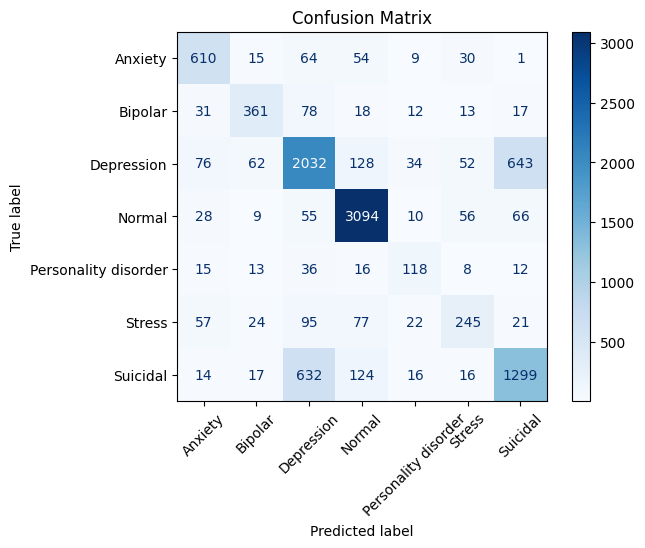

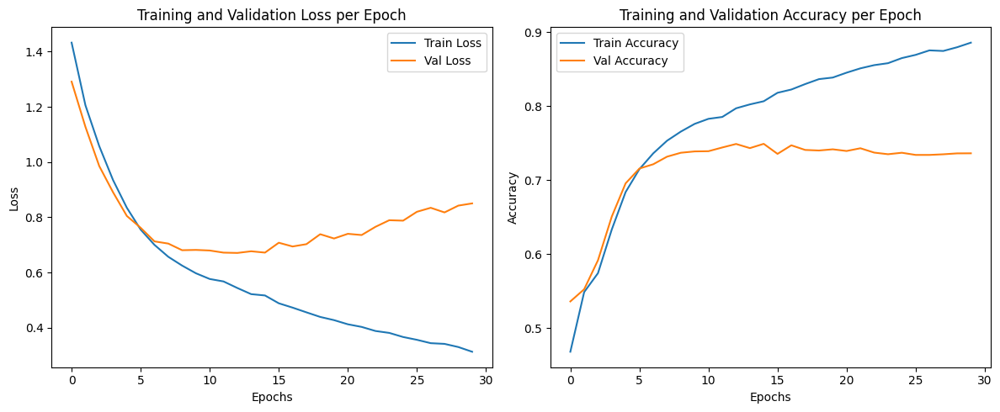

In [ ]:
# 4. -- Model evaluation --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds_w2v,
    all_labels=all_labels_w2v,
    train_losses=train_losses_w2v,
    val_losses=val_losses_w2v,
    train_accuracies=train_accuracies_w2v,
    val_accuracies=val_accuracies_w2v,
    save_name="word2vec_model"
)

In [ ]:
torch.save(model_w2v.state_dict(), results_path + 'models/model4_v1_word2vec_weights.pt')

### 4.2 GloVe

In [ ]:
# 1. -- Data Preparation --
glove_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/data/glove.6B.100d.txt'

#load glove embeddings
def load_glove_embeddings(glove_file, embedding_dim):
    embeddings_index = {}
    with open(glove_file, encoding='utf-8') as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            vector = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = vector
    print(f"Loaded {len(embeddings_index)} word vectors from GloVe.")
    return embeddings_index

embedding_dim = 100
embeddings_index = load_glove_embeddings(glove_path, embedding_dim)

Loaded 400000 word vectors from GloVe.


In [ ]:
#embedding matrix
vocab = tokenizer.word_index
num_words = min(MAX_VOCAB_SIZE, len(vocab) + 1)
embedding_matrix = np.zeros((num_words, embedding_dim))

for word, i in vocab.items():
    if i >= num_words:
        continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
    else:
        embedding_matrix[i] = np.random.normal(scale=0.6, size=(embedding_dim,))

In [ ]:
# 2. -- New model definition --
class GloveLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim):
        super(GloveLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output

In [ ]:
#FALTA TORNAR A CARREGAR LES DADES!
final_data = data.copy()

# Remove outliers that are too long
print("Length before outlier removal:", len(final_data))
final_data = final_data[final_data['statement'].str.len() < 15000]
print("Length after outlier removal:", len(final_data))

# Clean text
final_data['statement'] = final_data['statement'].apply(clean_text)
display(final_data.head(5))

train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)

Length before outlier removal: 52681
Length after outlier removal: 52675


,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"all wrong, back off dear, forward doubt. stay ...",Anxiety
3,ive shifted my focus to something else but im ...,Anxiety
4,"im restless and restless, its been a month now...",Anxiety


In [ ]:
# 3. -- Model training --
model_glove = GloveLSTM(
    embedding_matrix=embedding_matrix,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)
)

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model_glove.parameters()), lr=0.001)

model_glove, train_losses_glove, val_losses_glove, train_accuracies_glove, val_accuracies_glove, all_preds_glove, all_labels_glove = train_model(
    model=model_glove,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_fn,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2503 | Val Loss: 1.0061 | Train Acc: 0.5230 | Val Acc: 0.5795 | Time: 2.06s
Epoch 6/30 | Train Loss: 0.6342 | Val Loss: 0.6256 | Train Acc: 0.7481 | Val Acc: 0.7556 | Time: 1.97s
Epoch 11/30 | Train Loss: 0.5279 | Val Loss: 0.5841 | Train Acc: 0.7874 | Val Acc: 0.7741 | Time: 2.14s
Epoch 16/30 | Train Loss: 0.4587 | Val Loss: 0.5899 | Train Acc: 0.8163 | Val Acc: 0.7780 | Time: 2.71s
Epoch 21/30 | Train Loss: 0.4093 | Val Loss: 0.6102 | Train Acc: 0.8338 | Val Acc: 0.7721 | Time: 2.12s
Epoch 26/30 | Train Loss: 0.3819 | Val Loss: 0.6196 | Train Acc: 0.8466 | Val Acc: 0.7715 | Time: 2.00s
Epoch 30/30 | Train Loss: 0.3378 | Val Loss: 0.6665 | Train Acc: 0.8626 | Val Acc: 0.7745 | Time: 1.99s


Maximum accuracy: 0.7779781680113906 obtained at epoch 16
Final accuracy: 0.7744660654959659
Final loss: 0.6665172324036107

Weighted F1-score: 0.7753

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.77      0.84      0.80       783
             Bipolar       0.75      0.77      0.76       530
          Depression       0.76      0.70      0.73      3027
              Normal       0.93      0.91      0.92      3318
Personality disorder       0.61      0.64      0.62       218
              Stress       0.55      0.59      0.57       541
            Suicidal       0.66      0.71      0.68      2118

            accuracy                           0.77     10535
           macro avg       0.72      0.74      0.73     10535
        weighted avg       0.78      0.77      0.78     10535



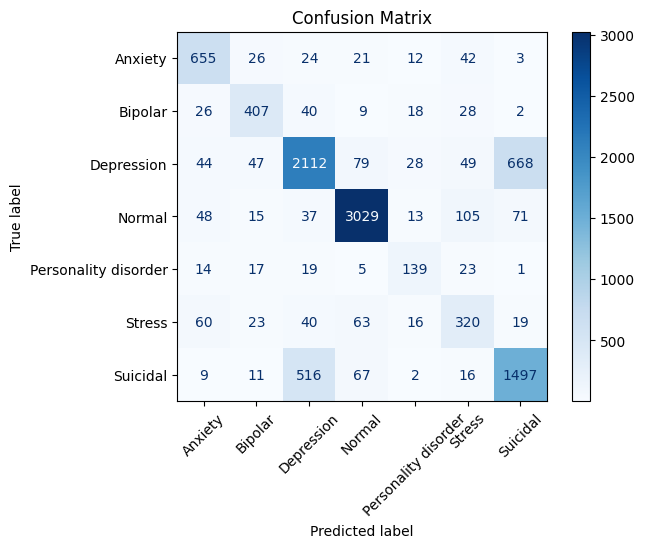

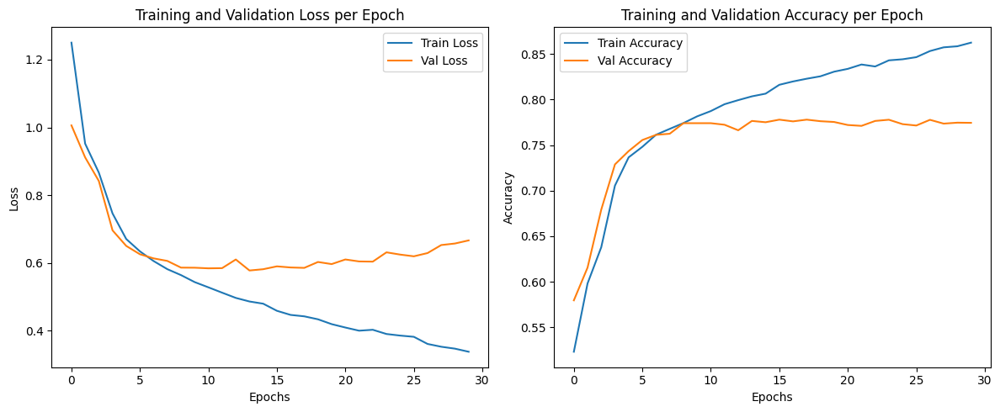

In [ ]:
# 4. -- Model evaluation --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds_glove,
    all_labels=all_labels_glove,
    train_losses=train_losses_glove,
    val_losses=val_losses_glove,
    train_accuracies=train_accuracies_glove,
    val_accuracies=val_accuracies_glove,
    save_name="glove_model"
)

In [ ]:
torch.save(model_glove.state_dict(), results_path + 'models/model4_v2_glove_weights.pt')

## 5. Model after data augmentation

### 5.1 Data augmentation with synonyms

In [ ]:
nltk.download('wordnet')
nltk.download('omw-1.4')

def synonym_replacement(sentence, n=2):
    words = sentence.split()
    new_words = words.copy()
    random.shuffle(new_words)
    num_replaced = 0

    for word in new_words:
        if word in stop_words_expanded:
            continue
        synonyms = wordnet.synsets(word)
        if not synonyms:
            continue
        syn_words = set()
        for syn in synonyms:
            for lemma in syn.lemmas():
                candidate = lemma.name().replace("_", " ")
                if candidate.lower() != word.lower():
                    syn_words.add(candidate)
        if syn_words:
            replacement = random.choice(list(syn_words))
            words = [replacement if w == word else w for w in words]
            num_replaced += 1
        if num_replaced >= n:
            break
    return ' '.join(words)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
def balance_with_synonyms(df, label_col='status', text_col='statement'):
    augmented_rows = []
    max_count = df[label_col].value_counts().max()

    for cls in df[label_col].unique():
        subset = df[df[label_col] == cls]
        needed = max_count - len(subset)
        if needed <= 0:
            continue

        # Loop and augment with synonyms
        for _ in range(needed):
            row = subset.sample(1).iloc[0]
            aug_text = synonym_replacement(row[text_col], n=2)
            augmented_rows.append({text_col: aug_text, label_col: cls})

    df_aug = pd.DataFrame(augmented_rows)
    return pd.concat([df, df_aug], ignore_index=True)

In [ ]:
# 1. -- Prepare data --

#data augmentation should only be applied to the training dataset!
data4 = data2.copy()
X_train, X_test, y_train, y_test = train_test_split(data4["statement"], data4["status"], test_size=0.2, random_state=42)

train_df = pd.DataFrame({"statement": X_train, "status": y_train})
test_df = pd.DataFrame({"statement": X_test, "status": y_test})

print("BEFORE:")
print(train_df.shape)
display(train_df["status"].value_counts())

train_df_augmented = balance_with_synonyms(train_df)
#train_df_augmented = train_df_augmented.sample(frac=1, random_state=42).reset_index(drop=True) #shuffle

print("AFTER:")
print(train_df_augmented.shape)
display(train_df_augmented["status"].value_counts())
display(train_df_augmented.head())

BEFORE:
(42140, 2)


,count
status,
Normal,13025
Depression,12376
Suicidal,8531
Anxiety,3058
Bipolar,2246
Stress,2046
Personality disorder,858


AFTER:
(91175, 2)


,count
status,
Normal,13025
Bipolar,13025
Depression,13025
Suicidal,13025
Stress,13025
Anxiety,13025
Personality disorder,13025


,statement,status
0,"perbabian..haram thread, dont read it, because...",Normal
1,"just when we think we have all the answers, al...",Bipolar
2,i feel like it is just over when i failed univ...,Depression
3,beans on toast with simona. can it get any bet...,Normal
4,some of you on this sub probably have this a w...,Depression


In [ ]:
# 2. -- Tokenization + Vectorization --
#same as in prepare_dataset_for_lst but outside the function because data is already splitted

X_train_seq = tokenizer.texts_to_sequences(train_df_augmented["statement"]) #use the precomputed tokenizer
X_test_seq = tokenizer.texts_to_sequences(test_df["statement"])

X_train_pad = pad_sequences(X_train_seq, maxlen=100, padding='post', truncating='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=100, padding='post', truncating='post')

label_encoder = LabelEncoder()
y_train_enc = label_encoder.fit_transform(train_df_augmented["status"])
y_test_enc = label_encoder.transform(test_df["status"])  # Use transform to keep label mapping

X_train_tensor = torch.tensor(X_train_pad, dtype=torch.long)
y_train_tensor = torch.tensor(y_train_enc, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_pad, dtype=torch.long)
y_test_tensor = torch.tensor(y_test_enc, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64)


In [ ]:
# 3. -- GLOVE EMBEDDINGS --
embedding_matrix = build_embedding_matrix_from_glove(
    tokenizer=tokenizer,
    glove_index=embeddings_index,
    embedding_dim=100,
    max_vocab_size=MAX_VOCAB_SIZE
)

In [ ]:
# 3. -- Train the model --
model5 = GloveLSTM(
    embedding_matrix=embedding_matrix,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model5.parameters(), lr=0.001)

model5, train_losses5, val_losses5, train_accuracies5, val_accuracies5, all_preds5, all_labels5 = train_model(
    model=model5,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30)

Epoch 1/30 | Train Loss: 1.3811 | Val Loss: 0.9870 | Train Acc: 0.4533 | Val Acc: 0.6230 | Time: 4.96s
Epoch 6/30 | Train Loss: 0.5226 | Val Loss: 0.7049 | Train Acc: 0.8116 | Val Acc: 0.7311 | Time: 4.13s
Epoch 11/30 | Train Loss: 0.3532 | Val Loss: 0.6727 | Train Acc: 0.8666 | Val Acc: 0.7543 | Time: 4.13s
Epoch 16/30 | Train Loss: 0.2792 | Val Loss: 0.7415 | Train Acc: 0.8920 | Val Acc: 0.7505 | Time: 4.81s
Epoch 21/30 | Train Loss: 0.2393 | Val Loss: 0.7752 | Train Acc: 0.9055 | Val Acc: 0.7523 | Time: 4.34s
Epoch 26/30 | Train Loss: 0.2118 | Val Loss: 0.8323 | Train Acc: 0.9160 | Val Acc: 0.7551 | Time: 4.11s
Epoch 30/30 | Train Loss: 0.1924 | Val Loss: 0.8882 | Train Acc: 0.9230 | Val Acc: 0.7443 | Time: 4.42s


Maximum accuracy: 0.7590887517797816 obtained at epoch 20
Final accuracy: 0.744280968201234
Final loss: 0.8882176272796862

Weighted F1-score: 0.7476

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.74      0.80      0.77       783
             Bipolar       0.69      0.82      0.75       530
          Depression       0.74      0.65      0.69      3027
              Normal       0.93      0.86      0.89      3318
Personality disorder       0.64      0.61      0.62       218
              Stress       0.53      0.67      0.59       541
            Suicidal       0.60      0.70      0.64      2118

            accuracy                           0.74     10535
           macro avg       0.70      0.73      0.71     10535
        weighted avg       0.76      0.74      0.75     10535



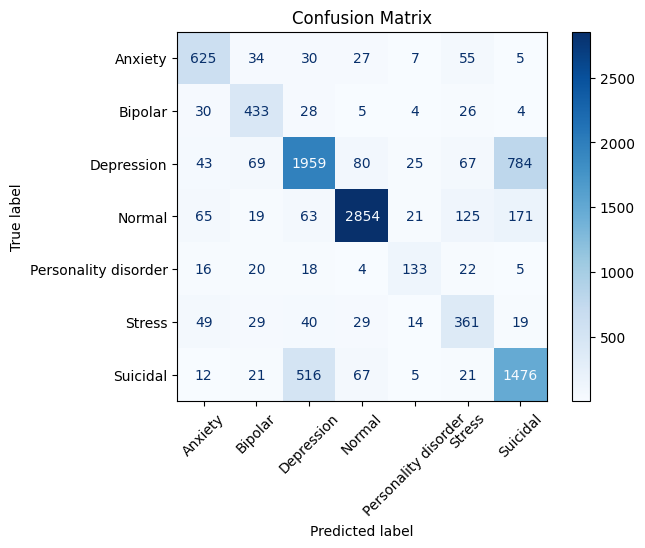

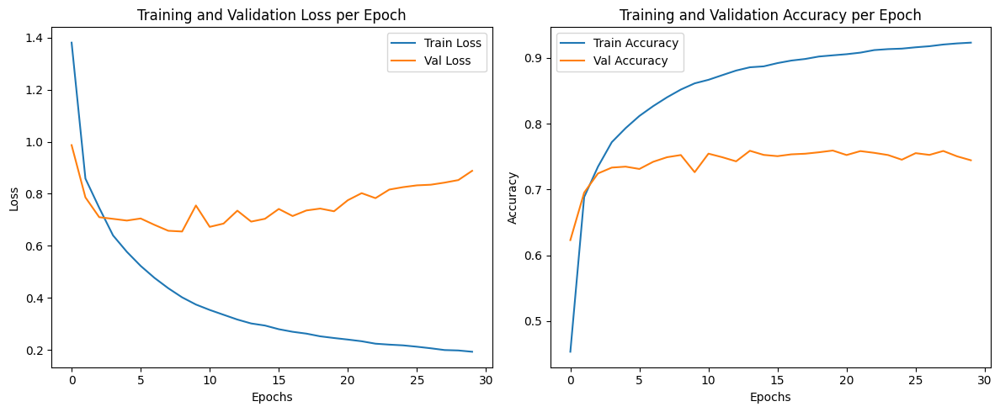

In [ ]:
# 4. -- Evaluate the model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds5,
    all_labels=all_labels5,
    train_losses=train_losses5,
    val_losses=val_losses5,
    train_accuracies=train_accuracies5,
    val_accuracies=val_accuracies5,
    save_name="data_augmentation_model_ok"
)

In [ ]:
torch.save(model5.state_dict(), results_path + 'models/model5_data_augmentation_weights.pt')

### 5.2 Data augmentation with back translation

In [ ]:
translator = Translator()

def back_translate(sentence):
    available_langs = ['es', 'fr', 'de', 'ja', 'ru']
    trans_lang = random.choice(available_langs)
    try:
        translated_sentence = translator.translate(sentence, src='en', dest=trans_lang).text
        back_translated_sentence = translator.translate(translated_sentence, src=trans_lang, dest='en').text
        return back_translated_sentence
    except Exception as e:
        print(f"Translation failed for sentence '{sentence}' via {trans_lang}: {e}")
        return sentence

In [ ]:
def balance_dataset_to_fixed_size(df, target_size=10000, text_col="statement", label_col="status"):
    balanced_rows = []

    for cls, group in df.groupby(label_col):
        print(f"\nProcessing class: {cls} (current size: {len(group)})")

        if len(group) > target_size:
            # Downsample
            balanced_rows.append(group.sample(target_size, random_state=42))

        elif len(group) < target_size:
            shortfall = target_size - len(group)

            # Back-translate from a sample
            augment_source = group.sample(min(len(group), shortfall), random_state=42)
            augmented = []

            for _, row in augment_source.iterrows():
                bt = back_translate(row[text_col])
                augmented.append({text_col: bt, label_col: cls})
                if _ % 100 == 0:
                    print(f"Back-translated {_} sentences")

            remaining = shortfall - len(augmented)
            if remaining > 0:
                oversampled = group.sample(remaining, replace=True, random_state=42)
                for _, row in oversampled.iterrows():
                    augmented.append({text_col: row[text_col], label_col: cls})

            combined = pd.concat([group, pd.DataFrame(augmented)], ignore_index=True)
            balanced_rows.append(combined)

        else:
            balanced_rows.append(group)

    return pd.concat(balanced_rows, ignore_index=True)

In [ ]:
# 1. -- Prepare data --
data4_v2 = data2.copy()

print("BEFORE:")
print(data4_v2.shape)
display(data4_v2["status"].value_counts())

BEFORE:
(52675, 2)


,count
status,
Normal,16343
Depression,15403
Suicidal,10649
Anxiety,3841
Bipolar,2776
Stress,2587
Personality disorder,1076


In [ ]:
# Balance the dataset
# more than 3h to execute
data4_v2 = balance_dataset_to_fixed_size(
    df=data4_v2,
    target_size=1000,
    text_col="statement",
    label_col="status"
)

print("\nAFTER:")
print(data4_v2.shape)
display(data4_v2["status"].value_counts())
data4_v2.to_csv(results_path + 'data4_v2.csv', index=False)


Processing class: Anxiety (current size: 3841)

Processing class: Bipolar (current size: 2776)

Processing class: Depression (current size: 15403)

Processing class: Normal (current size: 16343)

Processing class: Personality disorder (current size: 1076)

Processing class: Stress (current size: 2587)

Processing class: Suicidal (current size: 10649)

AFTER:
(7000, 2)


,count
status,
Anxiety,1000
Bipolar,1000
Depression,1000
Normal,1000
Personality disorder,1000
Stress,1000
Suicidal,1000


In [ ]:
# 2. -- Tokenization + Vectorization --
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
      dataframe=data4_v2,
      tokenizer=tokenizer,
      text_col="statement",
      label_col="status",
      max_seq_len=MAX_SEQ_LEN,
      test_size=TEST_SIZE,
      batch_size=BATCH_SIZE,
      random_state=RANDOM_STATE
)

In [ ]:
# 3. -- Train the model --
model4_v2 = BaselineLSTM(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model4_v2.parameters(), lr=0.001)

model4_v2, train_losses4_v2, val_losses4_v2, train_accuracies4_v2, val_accuracies4_v2, all_preds4_v2, all_labels4_v2 = train_model(
    model=model4_v2,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30)

Epoch 1/30 | Train Loss: 1.9342 | Val Loss: 1.9134 | Train Acc: 0.1718 | Val Acc: 0.2007 | Time: 0.40s
Epoch 6/30 | Train Loss: 1.5271 | Val Loss: 1.5992 | Train Acc: 0.3998 | Val Acc: 0.3771 | Time: 0.32s
Epoch 11/30 | Train Loss: 1.3259 | Val Loss: 1.4209 | Train Acc: 0.4630 | Val Acc: 0.4150 | Time: 0.31s
Epoch 16/30 | Train Loss: 1.0294 | Val Loss: 1.3831 | Train Acc: 0.5920 | Val Acc: 0.4500 | Time: 0.49s
Epoch 21/30 | Train Loss: 0.7717 | Val Loss: 1.4260 | Train Acc: 0.7189 | Val Acc: 0.4900 | Time: 0.42s
Epoch 26/30 | Train Loss: 0.5368 | Val Loss: 1.5272 | Train Acc: 0.8237 | Val Acc: 0.5179 | Time: 0.31s
Epoch 30/30 | Train Loss: 0.4179 | Val Loss: 1.6165 | Train Acc: 0.8661 | Val Acc: 0.5336 | Time: 0.32s


Maximum accuracy: 0.5357142857142857 obtained at epoch 29
Final accuracy: 0.5335714285714286
Final loss: 1.6165080774914136

Weighted F1-score: 0.5315

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.56      0.48      0.52       203
             Bipolar       0.48      0.50      0.49       224
          Depression       0.36      0.29      0.32       178
              Normal       0.84      0.75      0.79       215
Personality disorder       0.48      0.64      0.55       183
              Stress       0.45      0.42      0.43       211
            Suicidal       0.56      0.63      0.59       186

            accuracy                           0.53      1400
           macro avg       0.53      0.53      0.53      1400
        weighted avg       0.54      0.53      0.53      1400



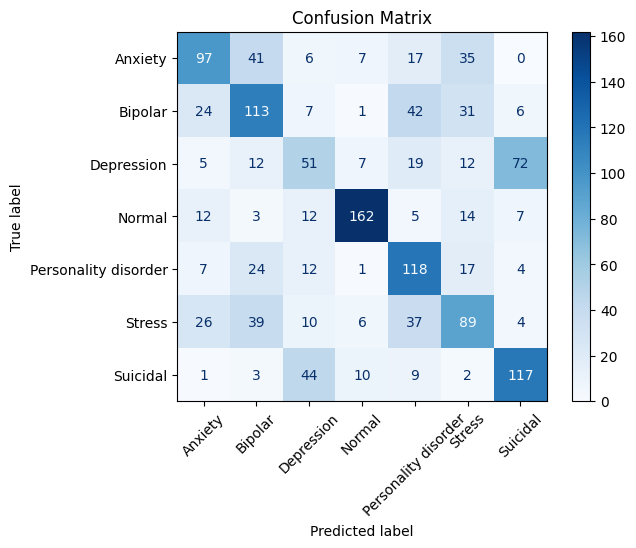

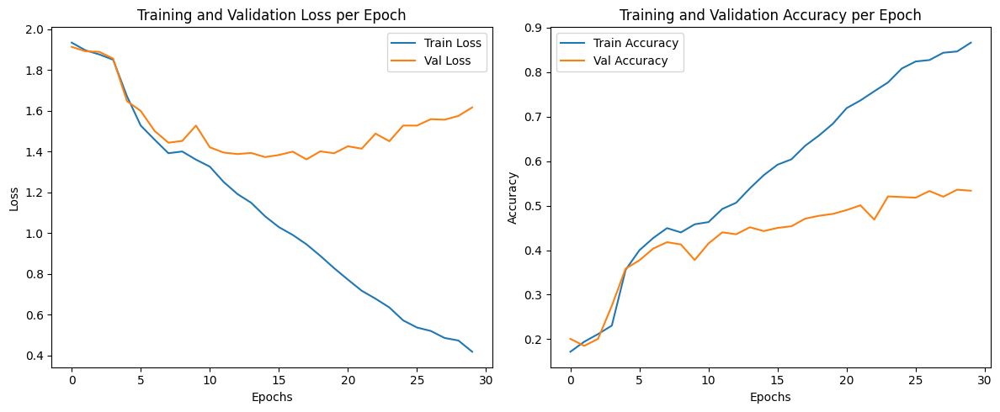

In [ ]:
# 4. -- Evaluate the model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds4_v2,
    all_labels=all_labels4_v2,
    train_losses=train_losses4_v2,
    val_losses=val_losses4_v2,
    train_accuracies=train_accuracies4_v2,
    val_accuracies=val_accuracies4_v2,
    save_name="data_augmentation_v2"
)

In [ ]:
torch.save(model4_v2.state_dict(), results_path + 'models/model4_data_augmentation_weights_v2.pt')

## 6. Model after grid search

Apply grid search to find best parameters

In [ ]:
# 1. -- Prepare data --
#we use data after data cleaning
data6 = data.copy()

# Remove outliers that are too long
print("Length before outlier removal:", len(data6))
data6 = data6[data6['statement'].str.len() < 15000]
print("Length after outlier removal:", len(data6))

# Clean text
data6['statement'] = data6['statement'].apply(clean_text)
display(data6.head(5))

Length before outlier removal: 52681
Length after outlier removal: 52675


,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"all wrong, back off dear, forward doubt. stay ...",Anxiety
3,ive shifted my focus to something else but im ...,Anxiety
4,"im restless and restless, its been a month now...",Anxiety


In [ ]:
#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=data6,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=BATCH_SIZE,
    random_state=RANDOM_STATE
)

In [ ]:
# 2. -- use glove embeddings --
glove_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/data/glove.6B.100d.txt'

#load glove embeddings
def load_glove_embeddings(glove_file, embedding_dim):
    embeddings_index = {}
    with open(glove_file, encoding='utf-8') as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            vector = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = vector
    print(f"Loaded {len(embeddings_index)} word vectors from GloVe.")
    return embeddings_index

embedding_dim = 100
embeddings_index = load_glove_embeddings(glove_path, embedding_dim)

embedding_matrix = build_embedding_matrix_from_glove(
    tokenizer=tokenizer,
    glove_index=embeddings_index,
    embedding_dim=100,
    max_vocab_size=MAX_VOCAB_SIZE
)

Loaded 400000 word vectors from GloVe.


In [ ]:
# 3. -- Parameters definition --
#embedding_dim_list = [64, 128, 256] --> we are using glove embeddings
hidden_dim_list = [64, 128, 256]
learning_rate_list = [ 0.1, 0.01, 0.001]
batch_size_list = [32, 64, 128]

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.1, batch_size=32
Epoch 1/30 | Train Loss: 1.6007 | Val Loss: 1.7895 | Train Acc: 0.4457 | Val Acc: 0.3268 | Time: 3.72s
Epoch 6/30 | Train Loss: 1.6165 | Val Loss: 1.6082 | Train Acc: 0.4202 | Val Acc: 0.4555 | Time: 4.36s
Epoch 11/30 | Train Loss: 1.6036 | Val Loss: 1.5942 | Train Acc: 0.4200 | Val Acc: 0.4524 | Time: 3.62s
Epoch 16/30 | Train Loss: 1.6257 | Val Loss: 1.6098 | Train Acc: 0.4208 | Val Acc: 0.4614 | Time: 4.36s
Epoch 21/30 | Train Loss: 1.5794 | Val Loss: 1.6265 | Train Acc: 0.4309 | Val Acc: 0.3763 | Time: 3.63s
Epoch 26/30 | Train Loss: 1.5680 | Val Loss: 1.5092 | Train Acc: 0.4382 | Val Acc: 0.4504 | Time: 4.28s
Epoch 30/30 | Train Loss: 1.5496 | Val Loss: 1.6315 | Train Acc: 0.4663 | Val Acc: 0.4531 | Time: 4.16s
Maximum accuracy: 0.4960607498813479 obtained at epoch 18
Final accuracy: 0.4530612244897959
Final loss: 1.6314854723034482

Weighted F1-score: 0.3521

Classification Report:

            

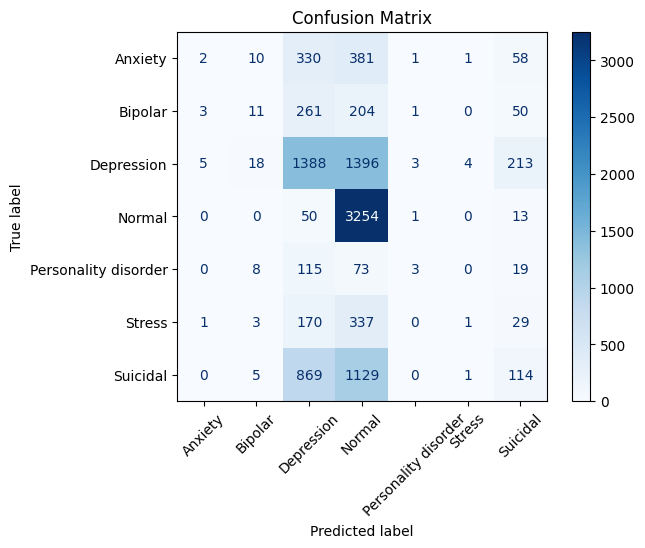

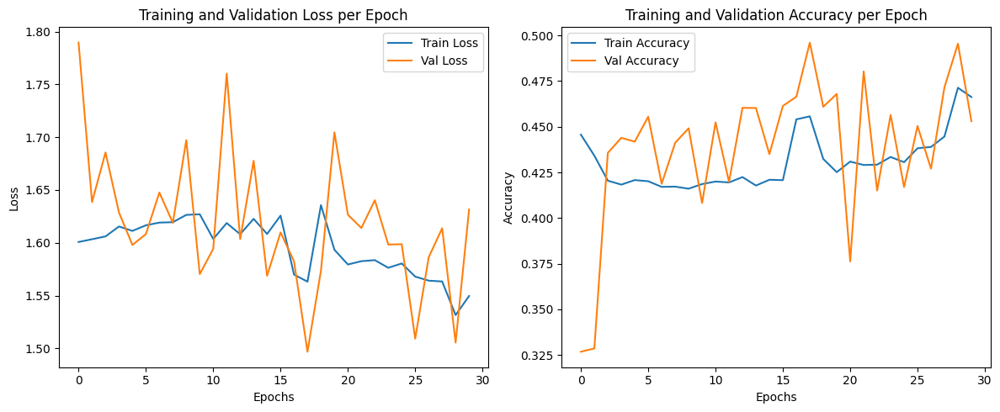

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.1, batch_size=64
Epoch 1/30 | Train Loss: 1.2048 | Val Loss: 1.0525 | Train Acc: 0.5262 | Val Acc: 0.5788 | Time: 2.04s
Epoch 6/30 | Train Loss: 1.4850 | Val Loss: 1.5052 | Train Acc: 0.4756 | Val Acc: 0.4962 | Time: 1.99s
Epoch 11/30 | Train Loss: 1.5285 | Val Loss: 1.5064 | Train Acc: 0.4598 | Val Acc: 0.4500 | Time: 2.02s
Epoch 16/30 | Train Loss: 1.5278 | Val Loss: 1.6084 | Train Acc: 0.4571 | Val Acc: 0.4567 | Time: 2.02s
Epoch 21/30 | Train Loss: 1.5221 | Val Loss: 1.6185 | Train Acc: 0.4620 | Val Acc: 0.3399 | Time: 2.30s
Epoch 26/30 | Train Loss: 1.5274 | Val Loss: 1.4833 | Train Acc: 0.4571 | Val Acc: 0.4649 | Time: 2.62s
Epoch 30/30 | Train Loss: 1.5259 | Val Loss: 1.5834 | Train Acc: 0.4587 | Val Acc: 0.4314 | Time: 2.06s
Maximum accuracy: 0.5939250118652112 obtained at epoch 2
Final accuracy: 0.4314190792596108
Final loss: 1.583374260411118

Weighted F1-score: 0.3499

Classification Report:

              

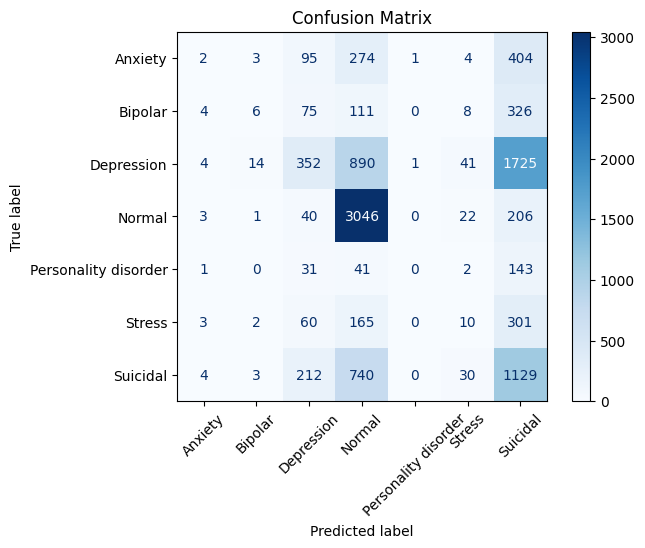

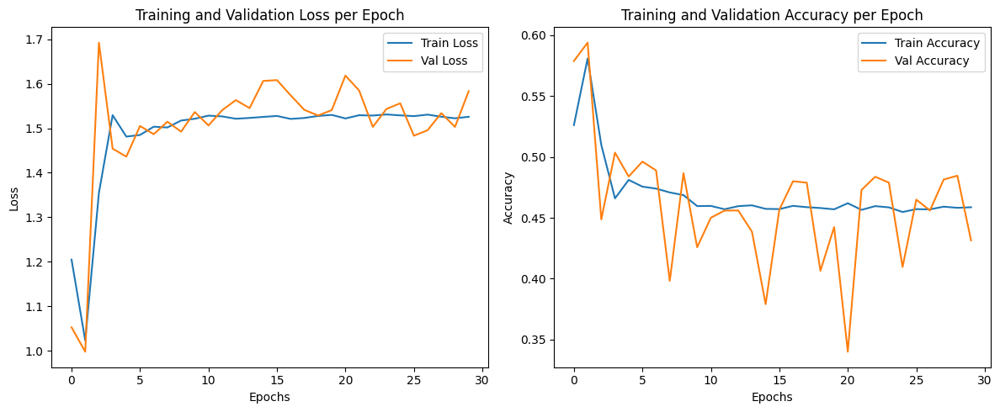

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.1, batch_size=128
Epoch 1/30 | Train Loss: 1.3401 | Val Loss: 1.3007 | Train Acc: 0.5180 | Val Acc: 0.4981 | Time: 1.35s
Epoch 6/30 | Train Loss: 1.4925 | Val Loss: 1.5128 | Train Acc: 0.4657 | Val Acc: 0.4547 | Time: 1.25s
Epoch 11/30 | Train Loss: 1.5189 | Val Loss: 1.4987 | Train Acc: 0.4565 | Val Acc: 0.4753 | Time: 1.26s
Epoch 16/30 | Train Loss: 1.5078 | Val Loss: 1.4933 | Train Acc: 0.4671 | Val Acc: 0.4718 | Time: 1.30s
Epoch 21/30 | Train Loss: 1.5317 | Val Loss: 1.4985 | Train Acc: 0.4473 | Val Acc: 0.4702 | Time: 1.38s
Epoch 26/30 | Train Loss: 1.5184 | Val Loss: 1.5111 | Train Acc: 0.4507 | Val Acc: 0.4626 | Time: 1.27s
Epoch 30/30 | Train Loss: 1.5139 | Val Loss: 1.4972 | Train Acc: 0.4549 | Val Acc: 0.4579 | Time: 1.28s
Maximum accuracy: 0.55453251067869 obtained at epoch 3
Final accuracy: 0.45790223065970576
Final loss: 1.4972495630563023

Weighted F1-score: 0.3731

Classification Report:

             

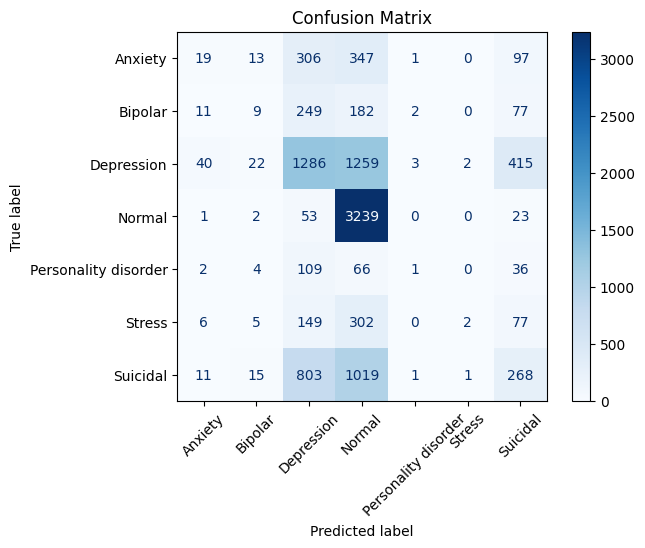

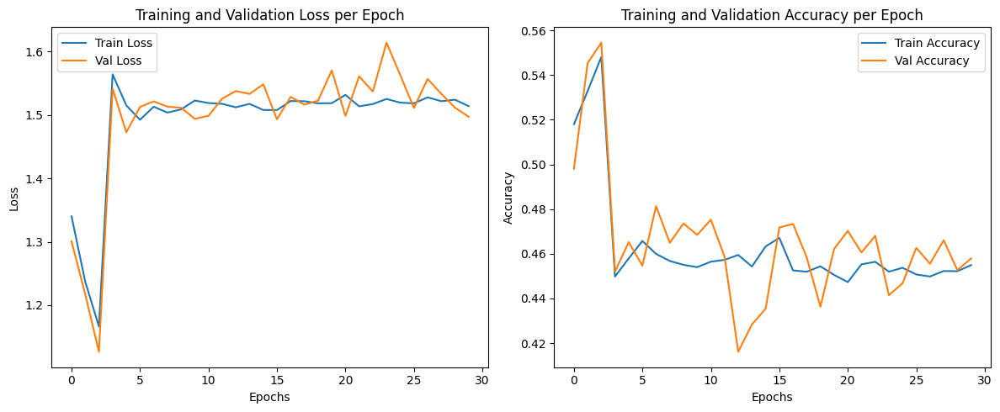

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.01, batch_size=32
Epoch 1/30 | Train Loss: 0.9359 | Val Loss: 0.7524 | Train Acc: 0.6347 | Val Acc: 0.7043 | Time: 4.14s
Epoch 6/30 | Train Loss: 0.6646 | Val Loss: 0.7889 | Train Acc: 0.7413 | Val Acc: 0.7097 | Time: 3.71s
Epoch 11/30 | Train Loss: 0.5883 | Val Loss: 0.6856 | Train Acc: 0.7660 | Val Acc: 0.7379 | Time: 4.05s
Epoch 16/30 | Train Loss: 0.5369 | Val Loss: 0.6831 | Train Acc: 0.7829 | Val Acc: 0.7490 | Time: 3.67s
Epoch 21/30 | Train Loss: 0.5076 | Val Loss: 0.7107 | Train Acc: 0.7954 | Val Acc: 0.7342 | Time: 4.06s
Epoch 26/30 | Train Loss: 0.4862 | Val Loss: 0.7128 | Train Acc: 0.8022 | Val Acc: 0.7359 | Time: 3.67s
Epoch 30/30 | Train Loss: 0.4753 | Val Loss: 0.7228 | Train Acc: 0.8073 | Val Acc: 0.7397 | Time: 4.00s
Maximum accuracy: 0.7490270526815377 obtained at epoch 16
Final accuracy: 0.7397247271001424
Final loss: 0.7228455594994805

Weighted F1-score: 0.7357

Classification Report:

           

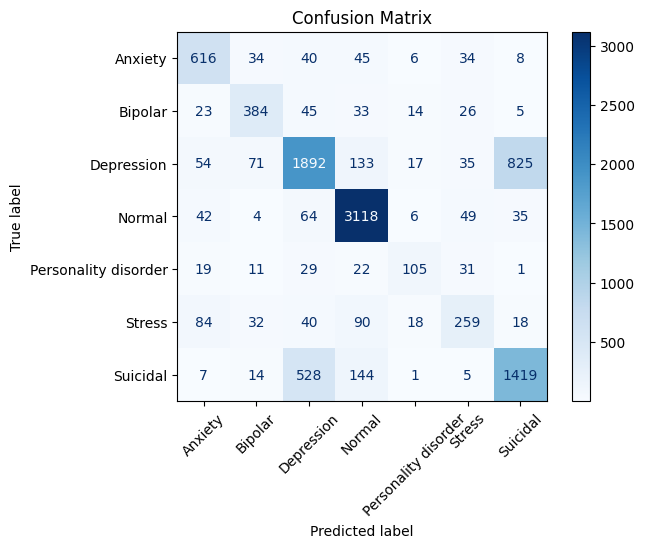

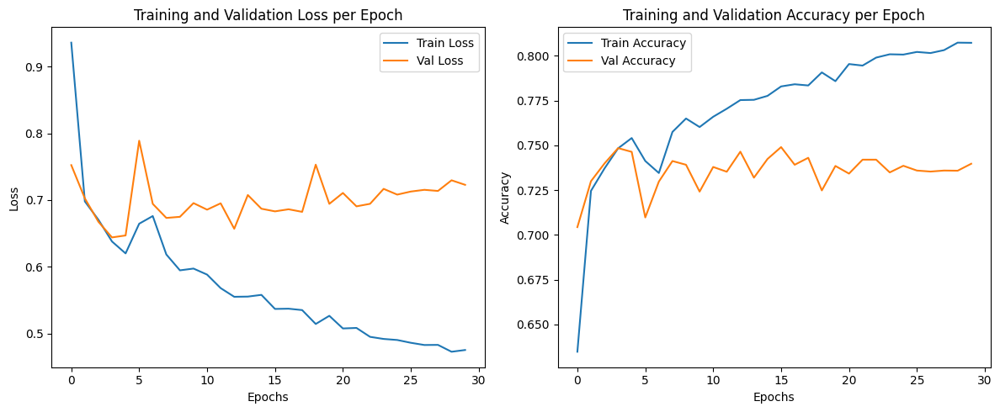

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.01, batch_size=64
Epoch 1/30 | Train Loss: 1.0880 | Val Loss: 0.8891 | Train Acc: 0.5628 | Val Acc: 0.6247 | Time: 2.44s
Epoch 6/30 | Train Loss: 0.5888 | Val Loss: 0.6352 | Train Acc: 0.7629 | Val Acc: 0.7508 | Time: 2.54s
Epoch 11/30 | Train Loss: 0.4997 | Val Loss: 0.6486 | Train Acc: 0.7980 | Val Acc: 0.7481 | Time: 2.05s
Epoch 16/30 | Train Loss: 0.4630 | Val Loss: 0.6809 | Train Acc: 0.8112 | Val Acc: 0.7481 | Time: 2.05s
Epoch 21/30 | Train Loss: 0.4205 | Val Loss: 0.7067 | Train Acc: 0.8286 | Val Acc: 0.7469 | Time: 2.02s
Epoch 26/30 | Train Loss: 0.5715 | Val Loss: 0.8001 | Train Acc: 0.7810 | Val Acc: 0.7111 | Time: 2.11s
Epoch 30/30 | Train Loss: 0.6410 | Val Loss: 0.7725 | Train Acc: 0.7514 | Val Acc: 0.7116 | Time: 2.56s
Maximum accuracy: 0.7530137636449928 obtained at epoch 12
Final accuracy: 0.7116279069767442
Final loss: 0.7725061705618194

Weighted F1-score: 0.7064

Classification Report:

           

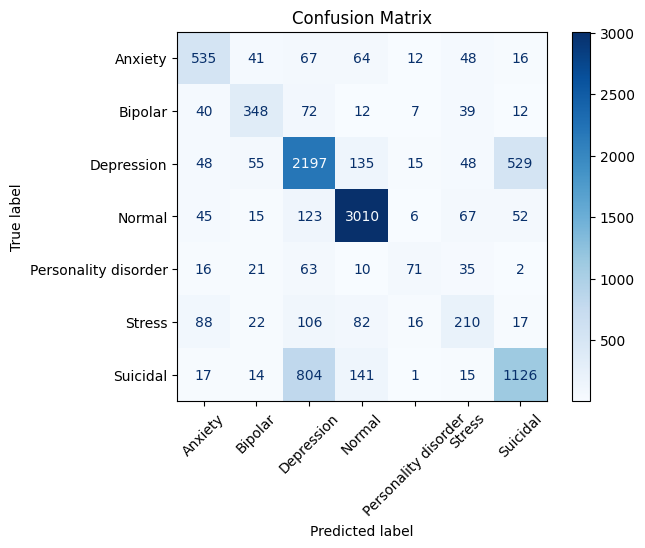

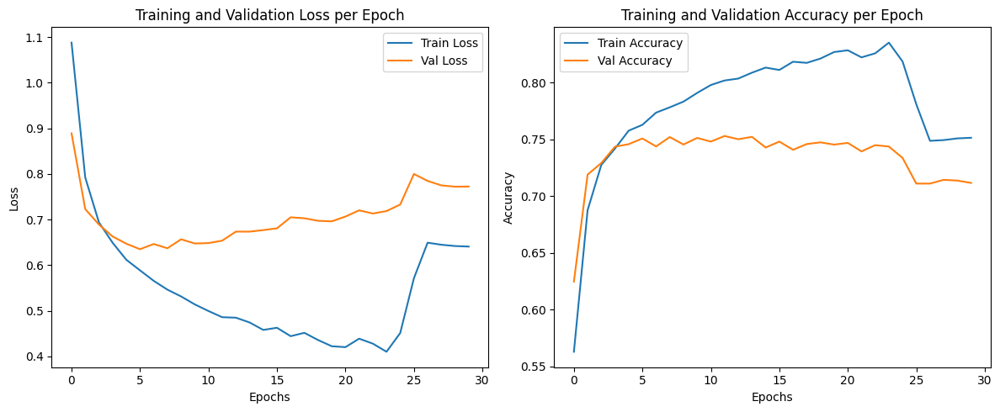

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.01, batch_size=128
Epoch 1/30 | Train Loss: 1.1252 | Val Loss: 0.7959 | Train Acc: 0.5670 | Val Acc: 0.6927 | Time: 1.33s
Epoch 6/30 | Train Loss: 0.5400 | Val Loss: 0.6016 | Train Acc: 0.7825 | Val Acc: 0.7674 | Time: 1.23s
Epoch 11/30 | Train Loss: 0.4566 | Val Loss: 0.6281 | Train Acc: 0.8144 | Val Acc: 0.7636 | Time: 1.28s
Epoch 16/30 | Train Loss: 0.3854 | Val Loss: 0.6942 | Train Acc: 0.8431 | Val Acc: 0.7531 | Time: 1.27s
Epoch 21/30 | Train Loss: 0.3474 | Val Loss: 0.7468 | Train Acc: 0.8622 | Val Acc: 0.7488 | Time: 1.29s
Epoch 26/30 | Train Loss: 0.3217 | Val Loss: 0.7788 | Train Acc: 0.8700 | Val Acc: 0.7496 | Time: 1.25s
Epoch 30/30 | Train Loss: 0.3048 | Val Loss: 0.8506 | Train Acc: 0.8777 | Val Acc: 0.7370 | Time: 1.22s
Maximum accuracy: 0.7674418604651163 obtained at epoch 6
Final accuracy: 0.7369719981015662
Final loss: 0.8506160030163914

Weighted F1-score: 0.7344

Classification Report:

           

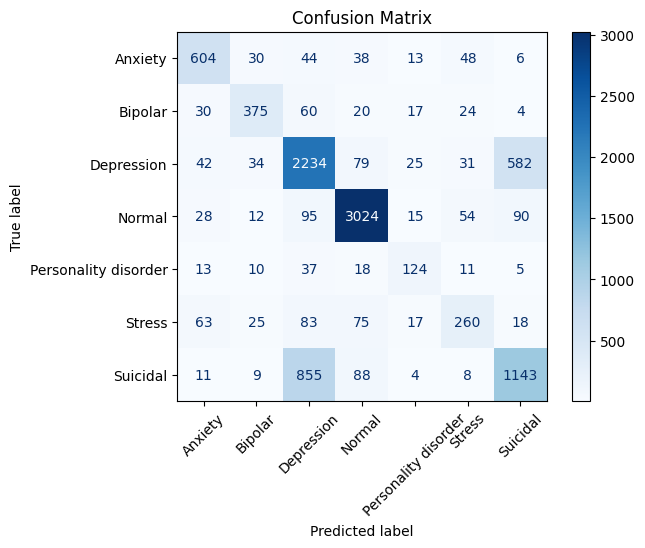

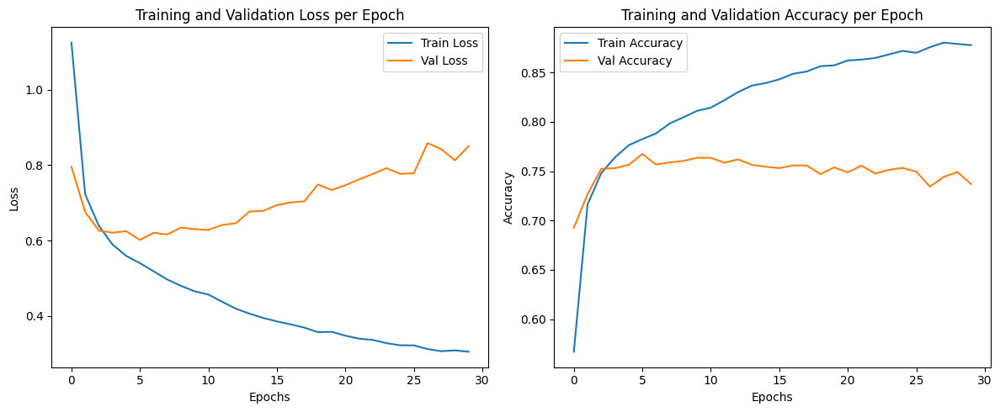

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.001, batch_size=32
Epoch 1/30 | Train Loss: 1.3011 | Val Loss: 1.0689 | Train Acc: 0.5097 | Val Acc: 0.5676 | Time: 3.74s
Epoch 6/30 | Train Loss: 0.6336 | Val Loss: 0.6333 | Train Acc: 0.7495 | Val Acc: 0.7545 | Time: 4.45s
Epoch 11/30 | Train Loss: 0.5276 | Val Loss: 0.6058 | Train Acc: 0.7876 | Val Acc: 0.7657 | Time: 3.64s
Epoch 16/30 | Train Loss: 0.4497 | Val Loss: 0.5958 | Train Acc: 0.8211 | Val Acc: 0.7702 | Time: 4.41s
Epoch 21/30 | Train Loss: 0.3838 | Val Loss: 0.6433 | Train Acc: 0.8466 | Val Acc: 0.7697 | Time: 3.62s
Epoch 26/30 | Train Loss: 0.3295 | Val Loss: 0.6954 | Train Acc: 0.8710 | Val Acc: 0.7640 | Time: 4.35s
Epoch 30/30 | Train Loss: 0.2922 | Val Loss: 0.7635 | Train Acc: 0.8850 | Val Acc: 0.7580 | Time: 4.14s
Maximum accuracy: 0.7717133364973896 obtained at epoch 13
Final accuracy: 0.7580446131941149
Final loss: 0.763520542419318

Weighted F1-score: 0.7594

Classification Report:

           

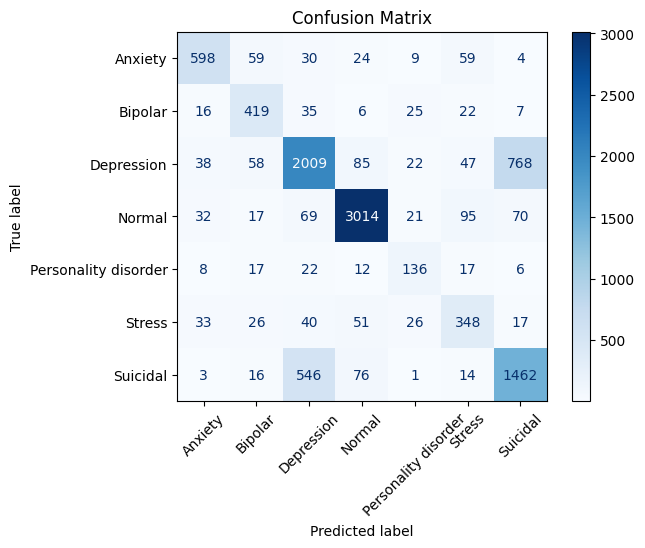

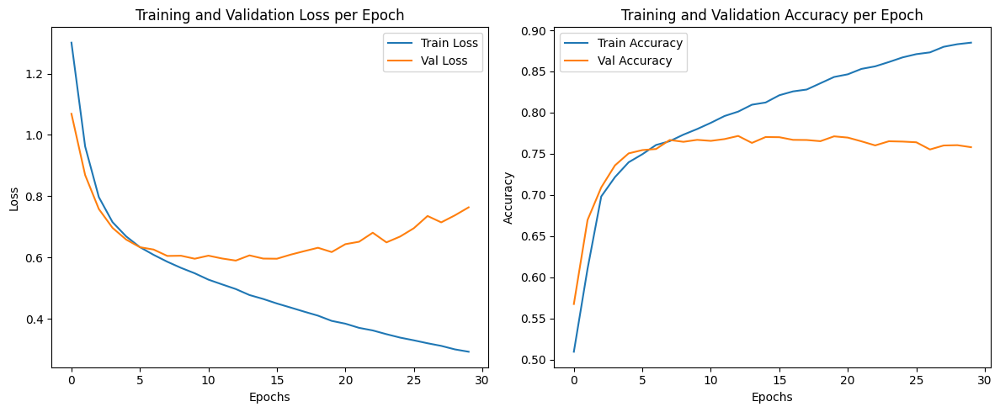

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.001, batch_size=64
Epoch 1/30 | Train Loss: 1.2947 | Val Loss: 1.0328 | Train Acc: 0.5125 | Val Acc: 0.5645 | Time: 2.10s
Epoch 6/30 | Train Loss: 0.6364 | Val Loss: 0.6367 | Train Acc: 0.7495 | Val Acc: 0.7491 | Time: 2.03s
Epoch 11/30 | Train Loss: 0.5374 | Val Loss: 0.5849 | Train Acc: 0.7865 | Val Acc: 0.7660 | Time: 2.05s
Epoch 16/30 | Train Loss: 0.4694 | Val Loss: 0.5883 | Train Acc: 0.8137 | Val Acc: 0.7765 | Time: 2.60s
Epoch 21/30 | Train Loss: 0.4171 | Val Loss: 0.6079 | Train Acc: 0.8306 | Val Acc: 0.7687 | Time: 2.30s
Epoch 26/30 | Train Loss: 0.3729 | Val Loss: 0.6407 | Train Acc: 0.8500 | Val Acc: 0.7653 | Time: 2.03s
Epoch 30/30 | Train Loss: 0.3376 | Val Loss: 0.6840 | Train Acc: 0.8626 | Val Acc: 0.7653 | Time: 2.00s
Maximum accuracy: 0.7764594209776934 obtained at epoch 16
Final accuracy: 0.7652586616041765
Final loss: 0.6839803249546976

Weighted F1-score: 0.7616

Classification Report:

          

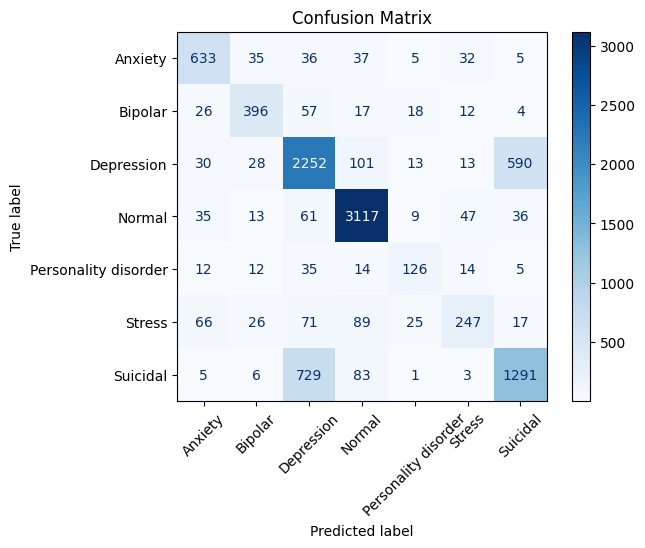

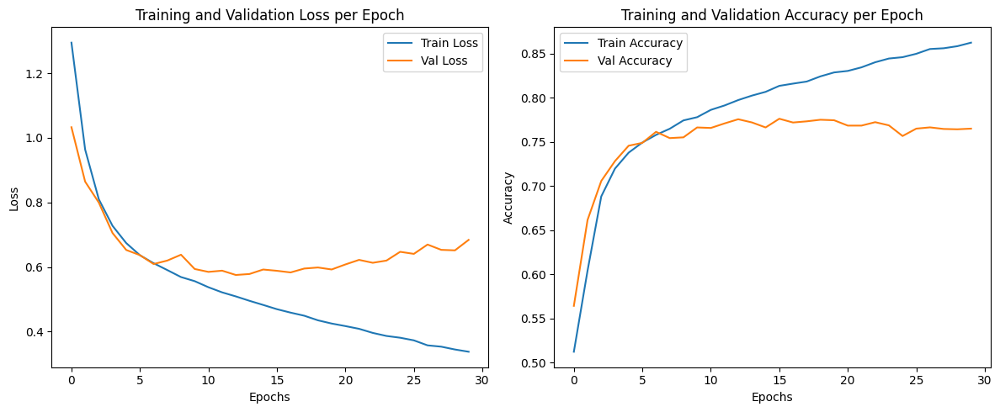

Trying parameters: embedding_dim=100, hidden_dim=64, learning_rate=0.001, batch_size=128
Epoch 1/30 | Train Loss: 1.3535 | Val Loss: 1.1984 | Train Acc: 0.5073 | Val Acc: 0.5311 | Time: 1.34s
Epoch 6/30 | Train Loss: 0.7223 | Val Loss: 0.7177 | Train Acc: 0.7194 | Val Acc: 0.7218 | Time: 1.67s
Epoch 11/30 | Train Loss: 0.5965 | Val Loss: 0.6260 | Train Acc: 0.7639 | Val Acc: 0.7546 | Time: 1.24s
Epoch 16/30 | Train Loss: 0.5171 | Val Loss: 0.5924 | Train Acc: 0.7926 | Val Acc: 0.7681 | Time: 1.65s
Epoch 21/30 | Train Loss: 0.4700 | Val Loss: 0.5674 | Train Acc: 0.8117 | Val Acc: 0.7788 | Time: 1.22s
Epoch 26/30 | Train Loss: 0.4252 | Val Loss: 0.5792 | Train Acc: 0.8299 | Val Acc: 0.7759 | Time: 1.62s
Epoch 30/30 | Train Loss: 0.4004 | Val Loss: 0.6023 | Train Acc: 0.8381 | Val Acc: 0.7775 | Time: 1.23s
Maximum accuracy: 0.7818699572852397 obtained at epoch 23
Final accuracy: 0.7775035595633603
Final loss: 0.6023471947894039

Weighted F1-score: 0.7789

Classification Report:

         

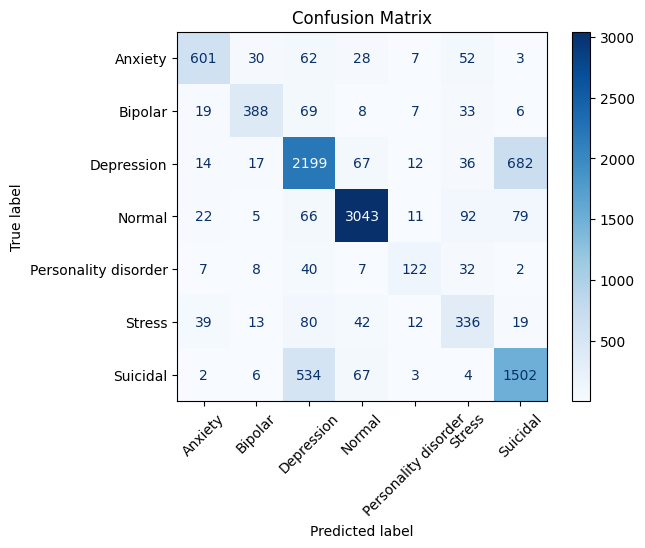

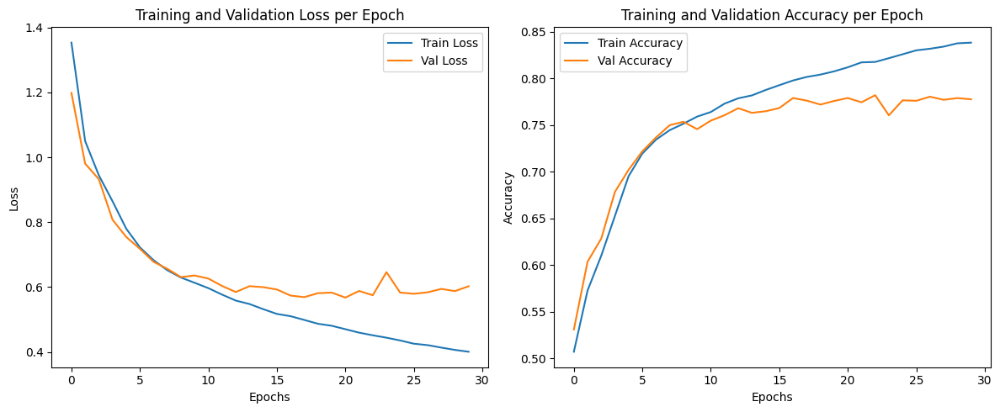

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.1, batch_size=32
Epoch 1/30 | Train Loss: 1.4367 | Val Loss: 1.3345 | Train Acc: 0.5045 | Val Acc: 0.5517 | Time: 3.76s
Epoch 6/30 | Train Loss: 1.7140 | Val Loss: 1.6781 | Train Acc: 0.4210 | Val Acc: 0.3916 | Time: 4.41s
Epoch 11/30 | Train Loss: 1.6732 | Val Loss: 1.5050 | Train Acc: 0.4487 | Val Acc: 0.4597 | Time: 3.67s
Epoch 16/30 | Train Loss: 1.7611 | Val Loss: 1.6032 | Train Acc: 0.4323 | Val Acc: 0.4736 | Time: 4.29s
Epoch 21/30 | Train Loss: 1.7185 | Val Loss: 1.7058 | Train Acc: 0.4339 | Val Acc: 0.4695 | Time: 3.66s
Epoch 26/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 4.39s
Epoch 30/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 3.74s
Maximum accuracy: 0.5516848599905079 obtained at epoch 1
Final accuracy: 0.07432368296155671
Final loss: nan

Weighted F1-score: 0.0103

Classification Report:

                      precision    rec

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


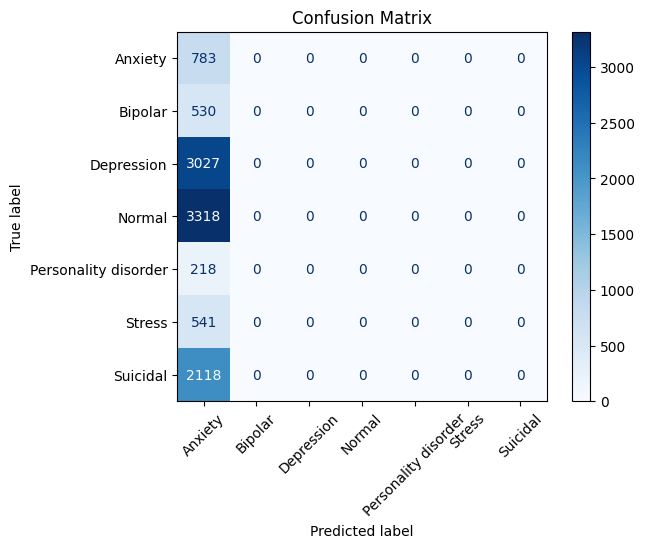

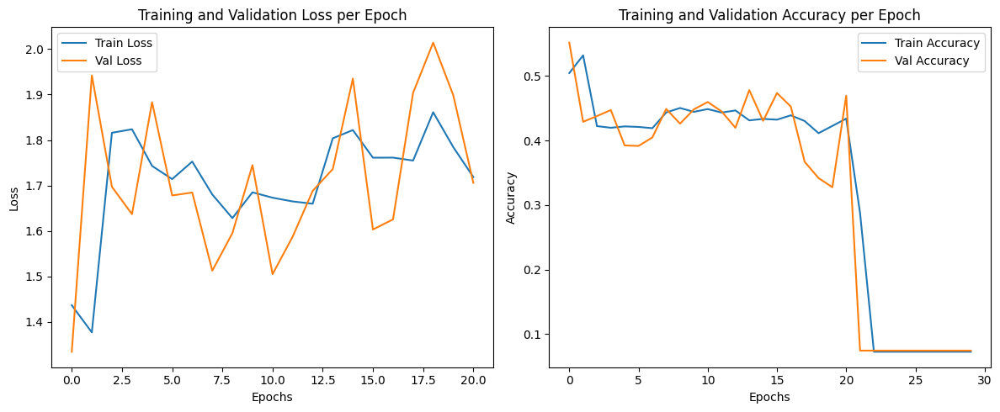

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.1, batch_size=64
Epoch 1/30 | Train Loss: 1.2923 | Val Loss: 1.1741 | Train Acc: 0.5146 | Val Acc: 0.5598 | Time: 2.90s
Epoch 6/30 | Train Loss: 1.6403 | Val Loss: 1.7345 | Train Acc: 0.4324 | Val Acc: 0.4689 | Time: 2.85s
Epoch 11/30 | Train Loss: 1.6392 | Val Loss: 1.7816 | Train Acc: 0.4291 | Val Acc: 0.4444 | Time: 2.85s
Epoch 16/30 | Train Loss: 1.6467 | Val Loss: 1.6165 | Train Acc: 0.4311 | Val Acc: 0.4093 | Time: 2.89s
Epoch 21/30 | Train Loss: 1.6168 | Val Loss: 1.5567 | Train Acc: 0.4335 | Val Acc: 0.4744 | Time: 3.07s
Epoch 26/30 | Train Loss: 1.6396 | Val Loss: 1.6612 | Train Acc: 0.4313 | Val Acc: 0.3925 | Time: 3.07s
Epoch 30/30 | Train Loss: 1.6292 | Val Loss: 1.6355 | Train Acc: 0.4366 | Val Acc: 0.4074 | Time: 3.04s
Maximum accuracy: 0.5597532036070242 obtained at epoch 1
Final accuracy: 0.40740389178927383
Final loss: 1.6354914513501253

Weighted F1-score: 0.3872

Classification Report:

           

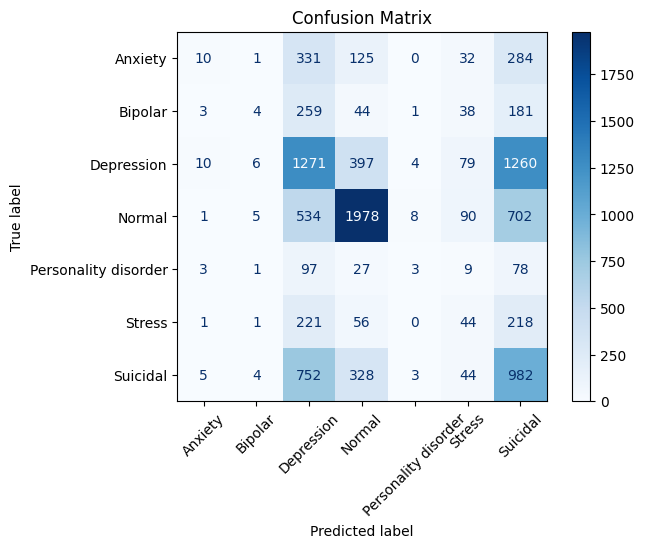

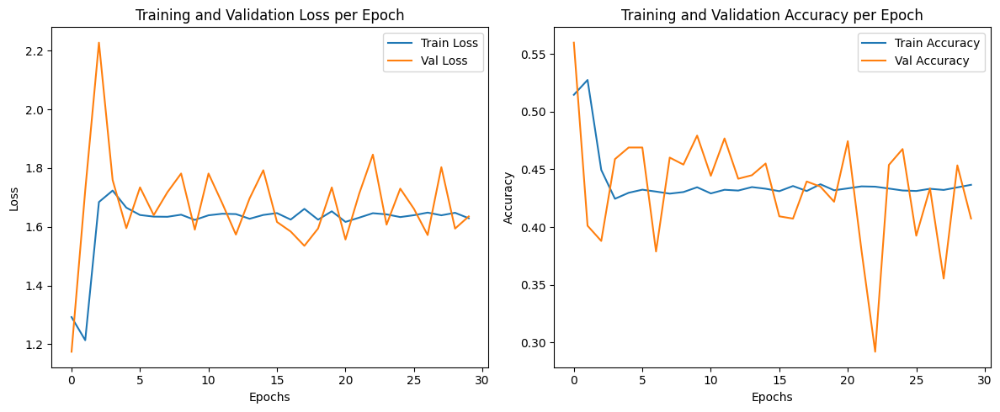

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.1, batch_size=128
Epoch 1/30 | Train Loss: 1.2517 | Val Loss: 1.1583 | Train Acc: 0.5175 | Val Acc: 0.5350 | Time: 2.70s
Epoch 6/30 | Train Loss: 1.0870 | Val Loss: 1.0639 | Train Acc: 0.5818 | Val Acc: 0.5744 | Time: 2.61s
Epoch 11/30 | Train Loss: 1.4075 | Val Loss: 1.3878 | Train Acc: 0.4620 | Val Acc: 0.4531 | Time: 2.69s
Epoch 16/30 | Train Loss: 1.5153 | Val Loss: 1.5581 | Train Acc: 0.4453 | Val Acc: 0.4240 | Time: 2.60s
Epoch 21/30 | Train Loss: 1.4483 | Val Loss: 1.4153 | Train Acc: 0.4682 | Val Acc: 0.4953 | Time: 2.52s
Epoch 26/30 | Train Loss: 1.4525 | Val Loss: 1.4689 | Train Acc: 0.4725 | Val Acc: 0.4601 | Time: 2.46s
Epoch 30/30 | Train Loss: 1.4385 | Val Loss: 1.4111 | Train Acc: 0.4768 | Val Acc: 0.4577 | Time: 2.38s
Maximum accuracy: 0.6294257237778832 obtained at epoch 5
Final accuracy: 0.45771238728049357
Final loss: 1.4111466221062534

Weighted F1-score: 0.4429

Classification Report:

          

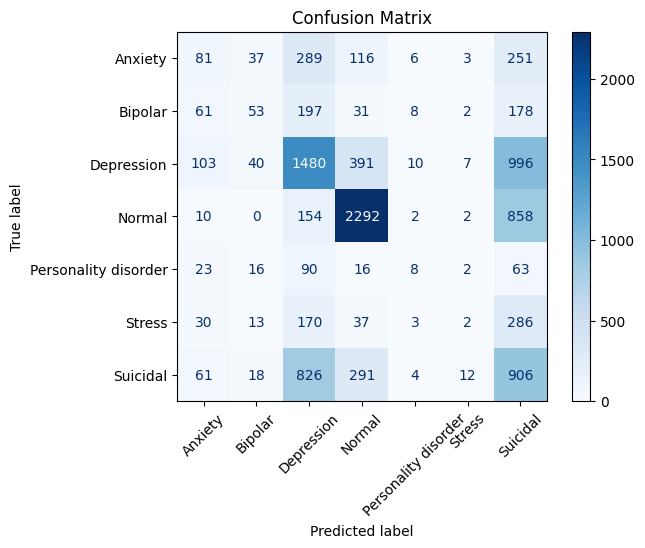

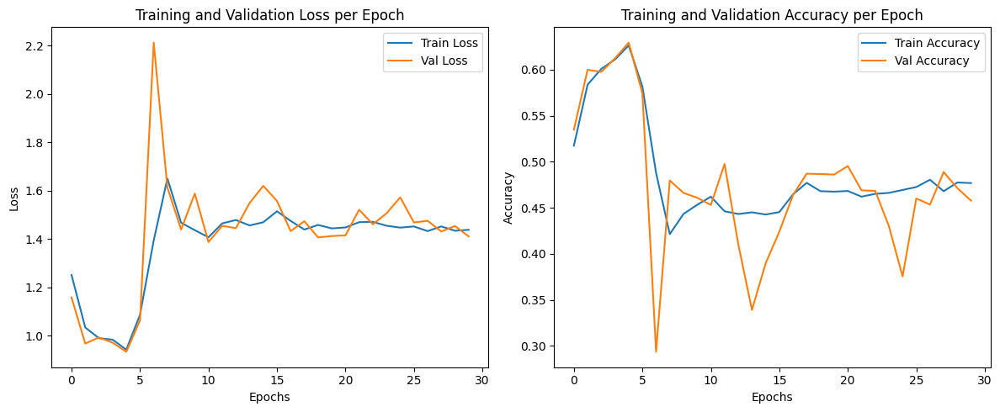

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.01, batch_size=32
Epoch 1/30 | Train Loss: 0.9306 | Val Loss: 0.7321 | Train Acc: 0.6363 | Val Acc: 0.7127 | Time: 4.23s
Epoch 6/30 | Train Loss: 0.5894 | Val Loss: 0.6335 | Train Acc: 0.7616 | Val Acc: 0.7505 | Time: 3.81s
Epoch 11/30 | Train Loss: 0.5333 | Val Loss: 0.6483 | Train Acc: 0.7846 | Val Acc: 0.7540 | Time: 4.37s
Epoch 16/30 | Train Loss: 0.4917 | Val Loss: 0.6967 | Train Acc: 0.7998 | Val Acc: 0.7467 | Time: 3.79s
Epoch 21/30 | Train Loss: 1.3825 | Val Loss: 1.4059 | Train Acc: 0.4958 | Val Acc: 0.4802 | Time: 4.54s
Epoch 26/30 | Train Loss: 1.3272 | Val Loss: 1.3150 | Train Acc: 0.5028 | Val Acc: 0.5059 | Time: 3.80s
Epoch 30/30 | Train Loss: 1.3374 | Val Loss: 1.3399 | Train Acc: 0.4916 | Val Acc: 0.4948 | Time: 3.78s
Maximum accuracy: 0.7539629805410536 obtained at epoch 11
Final accuracy: 0.4948267679164689
Final loss: 1.3399006729776208

Weighted F1-score: 0.4508

Classification Report:

          

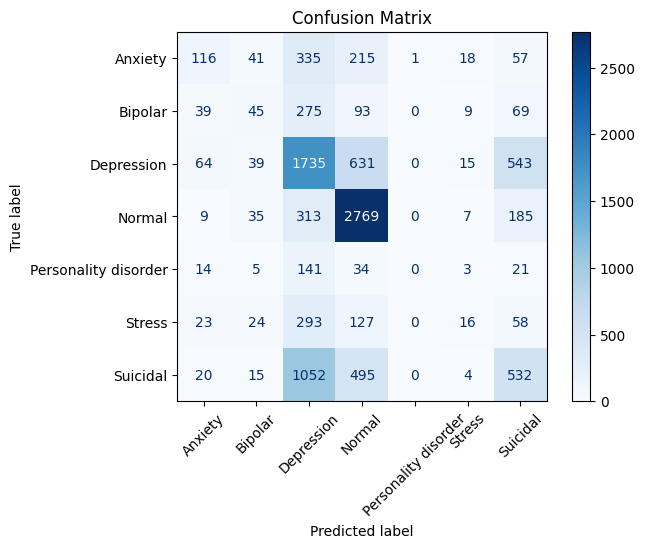

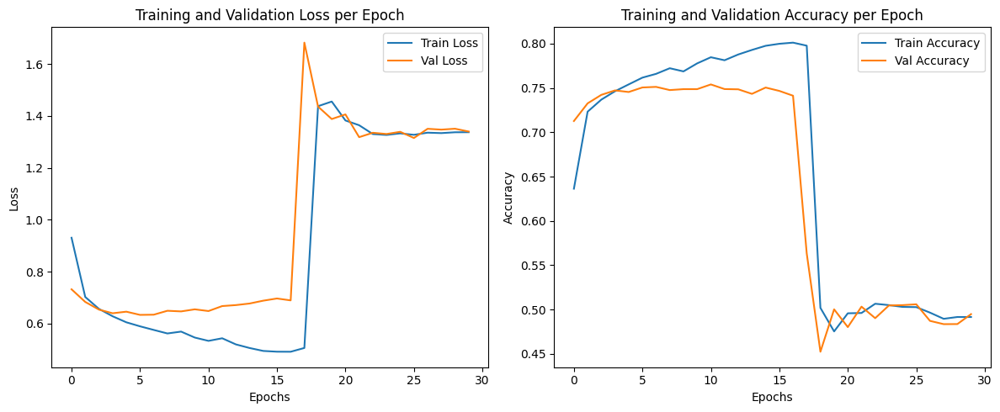

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.01, batch_size=64
Epoch 1/30 | Train Loss: 0.9727 | Val Loss: 0.7369 | Train Acc: 0.6146 | Val Acc: 0.7098 | Time: 3.11s
Epoch 6/30 | Train Loss: 0.5404 | Val Loss: 0.6163 | Train Acc: 0.7830 | Val Acc: 0.7593 | Time: 2.85s
Epoch 11/30 | Train Loss: 0.4544 | Val Loss: 0.6764 | Train Acc: 0.8186 | Val Acc: 0.7477 | Time: 2.81s
Epoch 16/30 | Train Loss: 0.4854 | Val Loss: 0.6926 | Train Acc: 0.8087 | Val Acc: 0.7504 | Time: 2.79s
Epoch 21/30 | Train Loss: 1.1192 | Val Loss: 1.1327 | Train Acc: 0.5799 | Val Acc: 0.5740 | Time: 2.79s
Epoch 26/30 | Train Loss: 1.1084 | Val Loss: 1.2271 | Train Acc: 0.5749 | Val Acc: 0.5418 | Time: 2.78s
Epoch 30/30 | Train Loss: 1.2417 | Val Loss: 1.2628 | Train Acc: 0.5278 | Val Acc: 0.5268 | Time: 2.80s
Maximum accuracy: 0.7614617940199335 obtained at epoch 5
Final accuracy: 0.5268153773137162
Final loss: 1.262762473930012

Weighted F1-score: 0.4932

Classification Report:

            

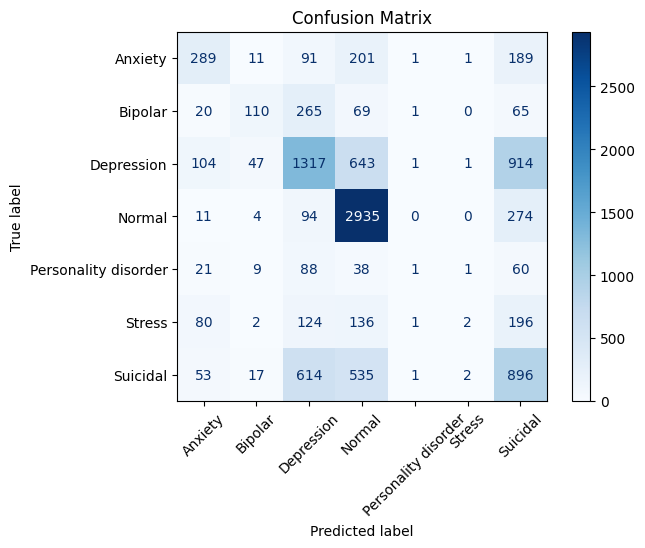

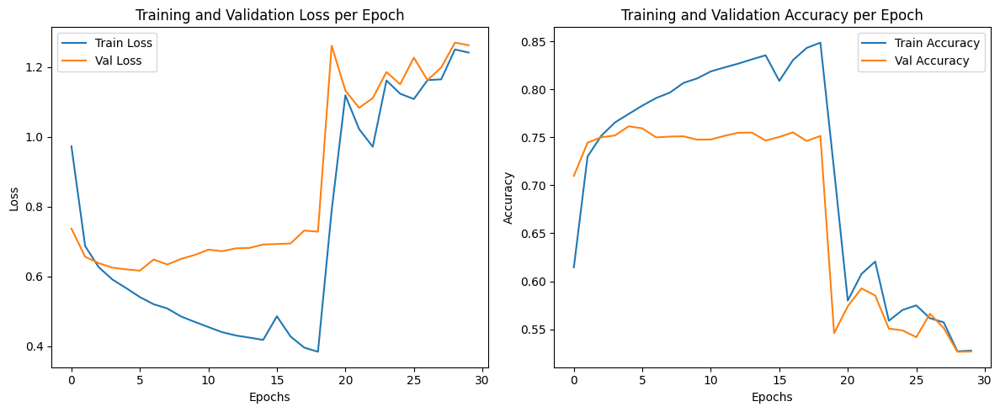

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.01, batch_size=128
Epoch 1/30 | Train Loss: 1.0439 | Val Loss: 0.7771 | Train Acc: 0.5848 | Val Acc: 0.6904 | Time: 2.58s
Epoch 6/30 | Train Loss: 0.5320 | Val Loss: 0.6095 | Train Acc: 0.7865 | Val Acc: 0.7606 | Time: 2.48s
Epoch 11/30 | Train Loss: 0.4173 | Val Loss: 0.6625 | Train Acc: 0.8344 | Val Acc: 0.7586 | Time: 2.50s
Epoch 16/30 | Train Loss: 1.3465 | Val Loss: 1.2825 | Train Acc: 0.5423 | Val Acc: 0.5337 | Time: 2.49s
Epoch 21/30 | Train Loss: 1.2218 | Val Loss: 1.2448 | Train Acc: 0.5512 | Val Acc: 0.5541 | Time: 2.47s
Epoch 26/30 | Train Loss: 1.2183 | Val Loss: 1.2399 | Train Acc: 0.5510 | Val Acc: 0.5467 | Time: 2.43s
Epoch 30/30 | Train Loss: 1.2178 | Val Loss: 1.2414 | Train Acc: 0.5506 | Val Acc: 0.5356 | Time: 2.46s
Maximum accuracy: 0.7642145230185098 obtained at epoch 7
Final accuracy: 0.5356430944470811
Final loss: 1.2413802549063442

Weighted F1-score: 0.4947

Classification Report:

          

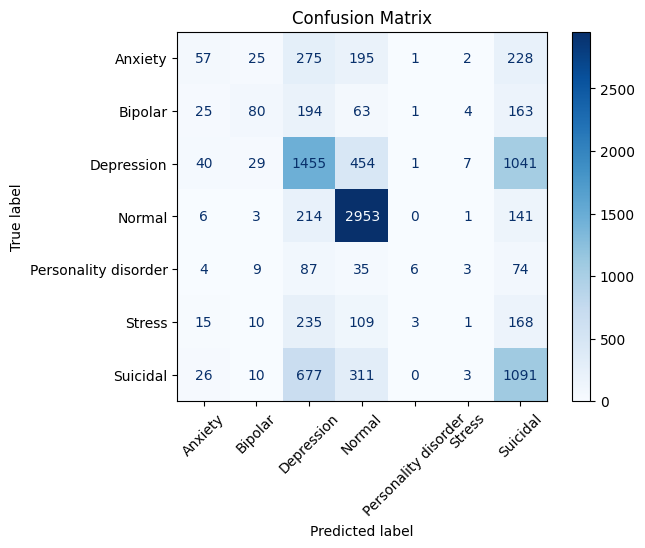

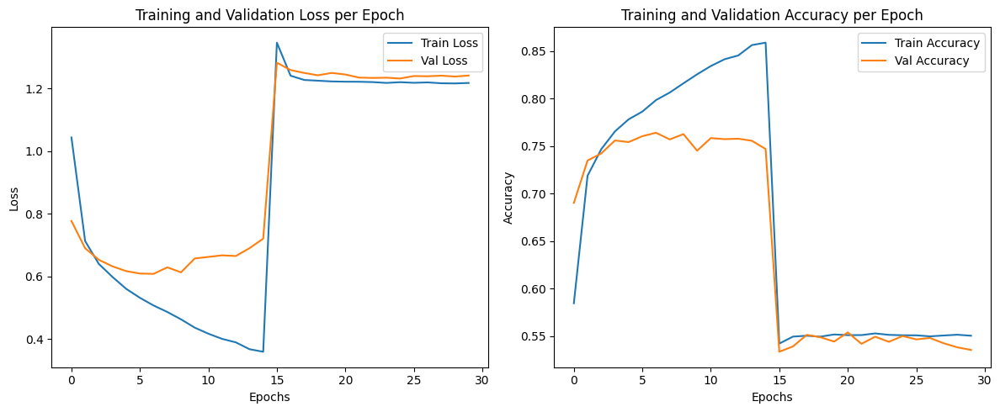

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.001, batch_size=32
Epoch 1/30 | Train Loss: 1.1736 | Val Loss: 0.9453 | Train Acc: 0.5461 | Val Acc: 0.6105 | Time: 3.94s
Epoch 6/30 | Train Loss: 0.5459 | Val Loss: 0.5797 | Train Acc: 0.7814 | Val Acc: 0.7648 | Time: 4.45s
Epoch 11/30 | Train Loss: 0.4074 | Val Loss: 0.5830 | Train Acc: 0.8344 | Val Acc: 0.7814 | Time: 3.67s
Epoch 16/30 | Train Loss: 0.2910 | Val Loss: 0.6821 | Train Acc: 0.8819 | Val Acc: 0.7725 | Time: 4.47s
Epoch 21/30 | Train Loss: 0.2006 | Val Loss: 0.8134 | Train Acc: 0.9199 | Val Acc: 0.7659 | Time: 3.66s
Epoch 26/30 | Train Loss: 0.1377 | Val Loss: 1.0010 | Train Acc: 0.9490 | Val Acc: 0.7592 | Time: 4.44s
Epoch 30/30 | Train Loss: 0.1074 | Val Loss: 1.0680 | Train Acc: 0.9612 | Val Acc: 0.7624 | Time: 3.82s
Maximum accuracy: 0.7813953488372093 obtained at epoch 11
Final accuracy: 0.7624110109159943
Final loss: 1.0680035599253395

Weighted F1-score: 0.7627

Classification Report:

         

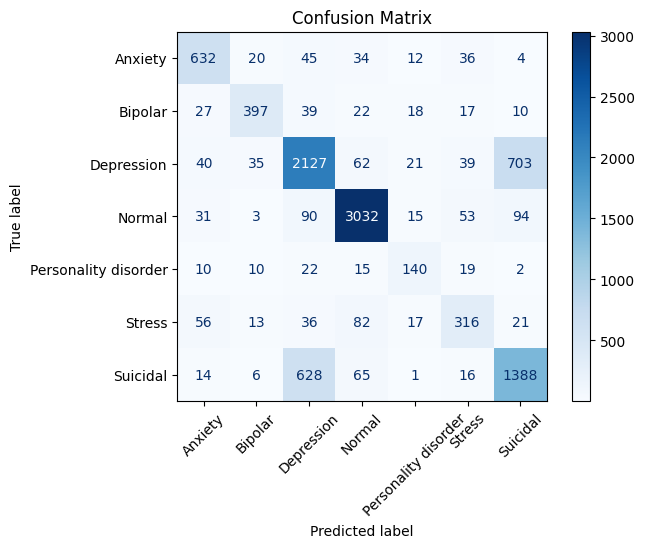

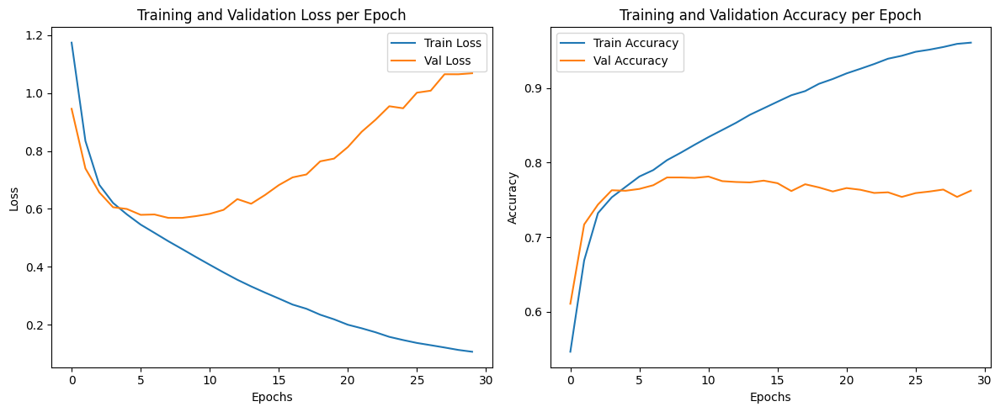

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.001, batch_size=64
Epoch 1/30 | Train Loss: 1.2572 | Val Loss: 1.0664 | Train Acc: 0.5223 | Val Acc: 0.5729 | Time: 2.91s
Epoch 6/30 | Train Loss: 0.5944 | Val Loss: 0.6013 | Train Acc: 0.7652 | Val Acc: 0.7615 | Time: 2.81s
Epoch 11/30 | Train Loss: 0.4810 | Val Loss: 0.5655 | Train Acc: 0.8062 | Val Acc: 0.7787 | Time: 2.82s
Epoch 16/30 | Train Loss: 0.3744 | Val Loss: 0.6242 | Train Acc: 0.8489 | Val Acc: 0.7703 | Time: 2.79s
Epoch 21/30 | Train Loss: 0.2761 | Val Loss: 0.6824 | Train Acc: 0.8909 | Val Acc: 0.7715 | Time: 2.94s
Epoch 26/30 | Train Loss: 0.2025 | Val Loss: 0.7957 | Train Acc: 0.9234 | Val Acc: 0.7690 | Time: 3.07s
Epoch 30/30 | Train Loss: 0.1499 | Val Loss: 0.9358 | Train Acc: 0.9462 | Val Acc: 0.7673 | Time: 2.92s
Maximum accuracy: 0.7831039392501187 obtained at epoch 13
Final accuracy: 0.7673469387755102
Final loss: 0.9357677127375748

Weighted F1-score: 0.7668

Classification Report:

         

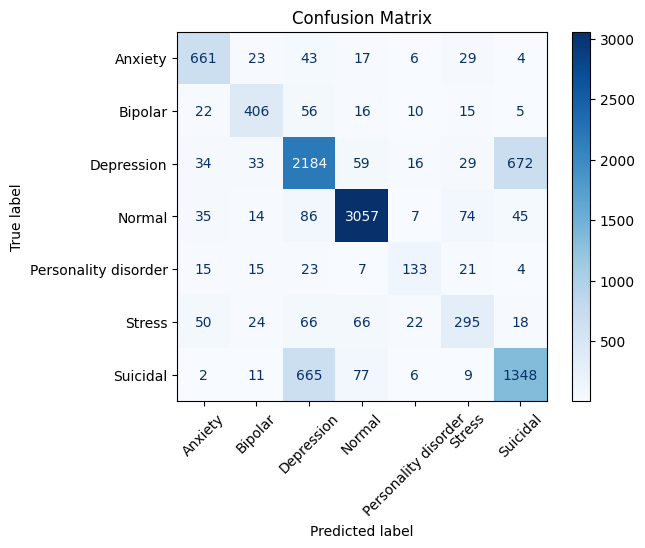

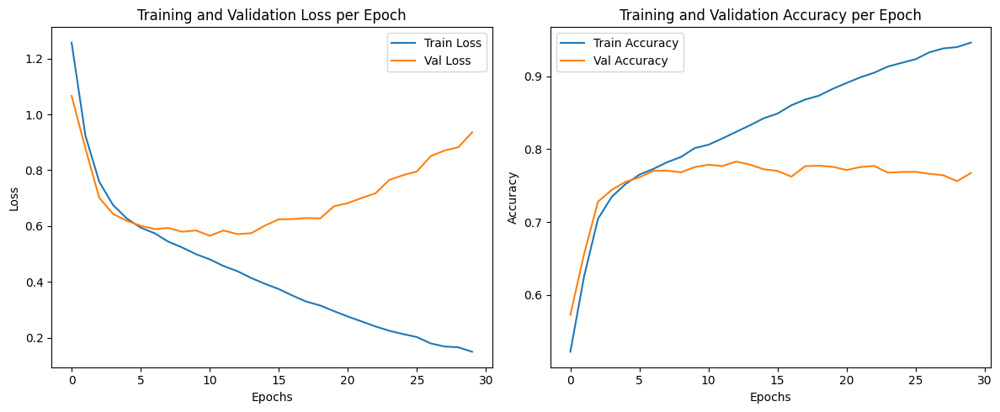

Trying parameters: embedding_dim=100, hidden_dim=128, learning_rate=0.001, batch_size=128
Epoch 1/30 | Train Loss: 1.3740 | Val Loss: 1.1328 | Train Acc: 0.4949 | Val Acc: 0.5465 | Time: 2.57s
Epoch 6/30 | Train Loss: 0.6403 | Val Loss: 0.6338 | Train Acc: 0.7479 | Val Acc: 0.7496 | Time: 2.47s
Epoch 11/30 | Train Loss: 0.5288 | Val Loss: 0.5739 | Train Acc: 0.7874 | Val Acc: 0.7742 | Time: 2.48s
Epoch 16/30 | Train Loss: 0.4469 | Val Loss: 0.5894 | Train Acc: 0.8205 | Val Acc: 0.7738 | Time: 2.48s
Epoch 21/30 | Train Loss: 0.3692 | Val Loss: 0.6055 | Train Acc: 0.8509 | Val Acc: 0.7793 | Time: 2.46s
Epoch 26/30 | Train Loss: 0.3000 | Val Loss: 0.6775 | Train Acc: 0.8785 | Val Acc: 0.7732 | Time: 2.50s
Epoch 30/30 | Train Loss: 0.2485 | Val Loss: 0.7608 | Train Acc: 0.9026 | Val Acc: 0.7622 | Time: 2.59s
Maximum accuracy: 0.7793070716658757 obtained at epoch 21
Final accuracy: 0.7622211675367822
Final loss: 0.7607946158891701

Weighted F1-score: 0.7637

Classification Report:

        

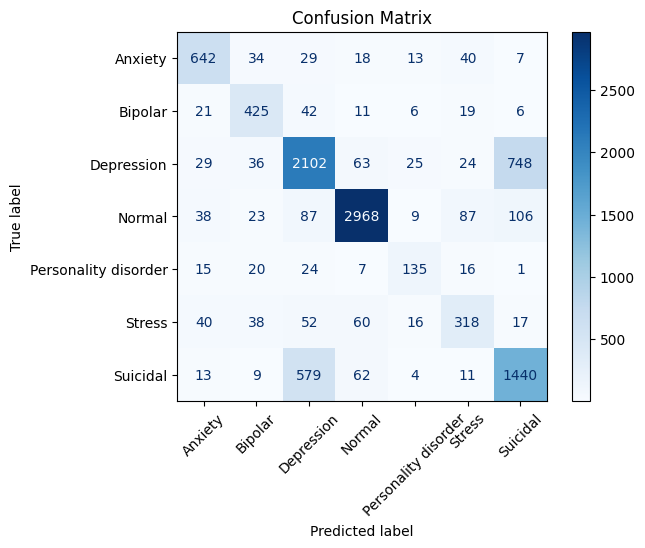

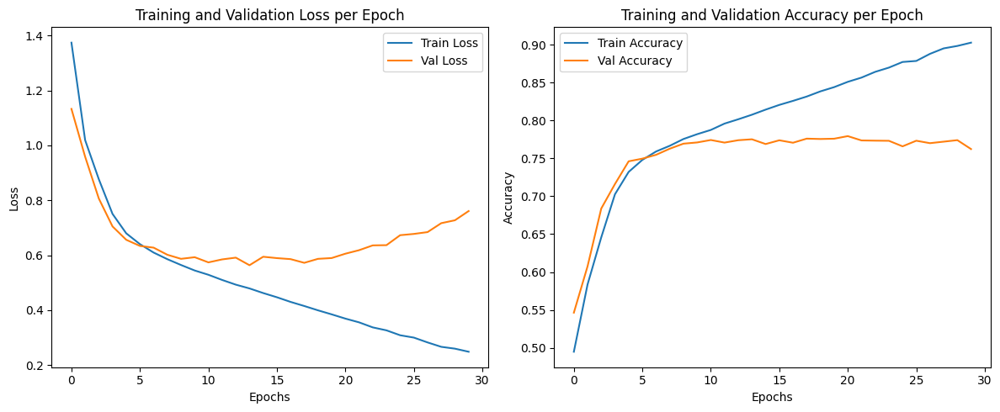

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.1, batch_size=32
Epoch 1/30 | Train Loss: 1.7585 | Val Loss: 1.8818 | Train Acc: 0.4495 | Val Acc: 0.4550 | Time: 8.12s
Epoch 6/30 | Train Loss: 1.8680 | Val Loss: 1.6321 | Train Acc: 0.4264 | Val Acc: 0.4433 | Time: 7.85s
Epoch 11/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.2366 | Val Acc: 0.0743 | Time: 7.61s
Epoch 16/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 7.61s
Epoch 21/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 7.83s
Epoch 26/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 7.93s
Epoch 30/30 | Train Loss: nan | Val Loss: nan | Train Acc: 0.0726 | Val Acc: 0.0743 | Time: 7.40s
Maximum accuracy: 0.489890840056953 obtained at epoch 7
Final accuracy: 0.07432368296155671
Final loss: nan

Weighted F1-score: 0.0103

Classification Report:

                      precision    recall  f1-score   sup

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


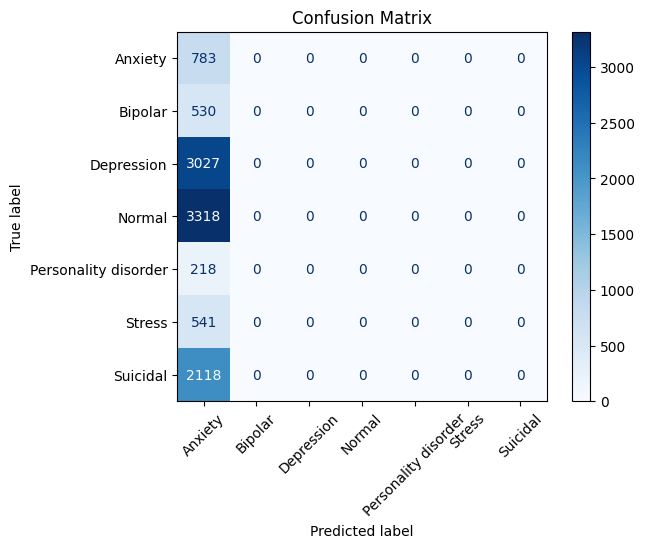

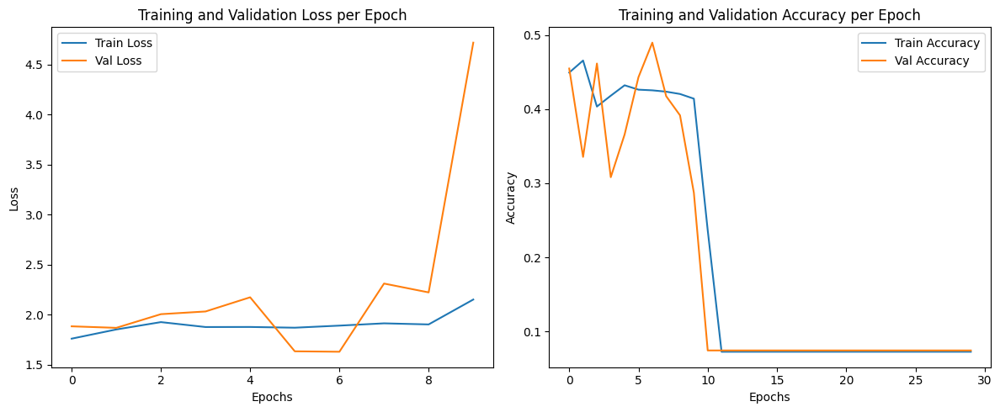

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.1, batch_size=64
Epoch 1/30 | Train Loss: 1.5821 | Val Loss: 1.5522 | Train Acc: 0.4775 | Val Acc: 0.4810 | Time: 5.85s
Epoch 6/30 | Train Loss: 1.4205 | Val Loss: 1.5059 | Train Acc: 0.5051 | Val Acc: 0.5155 | Time: 5.77s
Epoch 11/30 | Train Loss: 1.2432 | Val Loss: 1.1496 | Train Acc: 0.5480 | Val Acc: 0.5398 | Time: 5.68s
Epoch 16/30 | Train Loss: 1.0570 | Val Loss: 1.1980 | Train Acc: 0.6164 | Val Acc: 0.5694 | Time: 5.63s
Epoch 21/30 | Train Loss: 1.8870 | Val Loss: 1.9878 | Train Acc: 0.4213 | Val Acc: 0.3381 | Time: 5.60s
Epoch 26/30 | Train Loss: 1.8191 | Val Loss: 1.7209 | Train Acc: 0.4215 | Val Acc: 0.4539 | Time: 5.62s
Epoch 30/30 | Train Loss: 1.8171 | Val Loss: 1.8980 | Train Acc: 0.4237 | Val Acc: 0.4467 | Time: 5.60s
Maximum accuracy: 0.6311343141907926 obtained at epoch 15
Final accuracy: 0.44670147128618887
Final loss: 1.8980185667673746

Weighted F1-score: 0.3739

Classification Report:

          

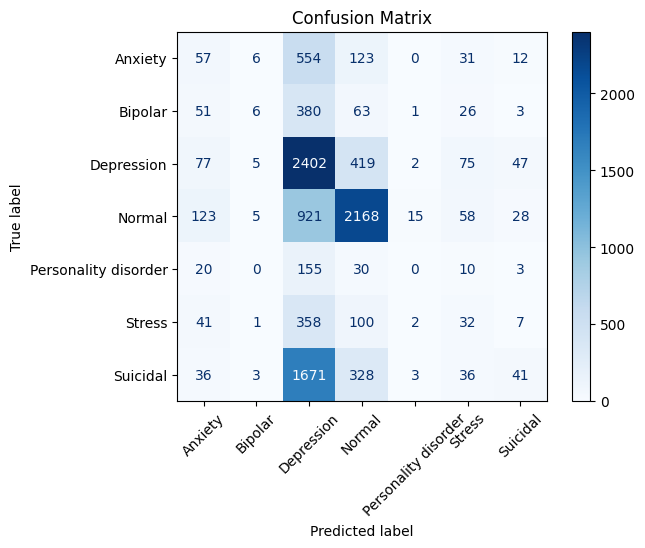

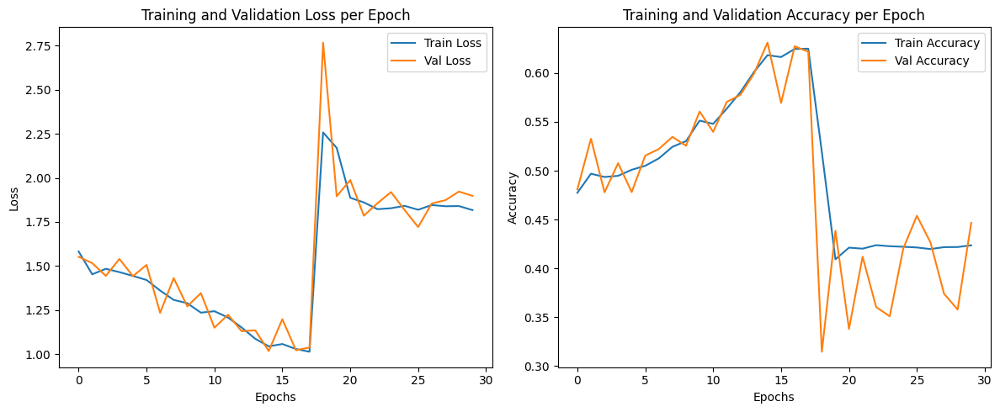

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.1, batch_size=128
Epoch 1/30 | Train Loss: 1.8029 | Val Loss: 1.6007 | Train Acc: 0.4582 | Val Acc: 0.4690 | Time: 4.75s
Epoch 6/30 | Train Loss: 1.6276 | Val Loss: 1.6832 | Train Acc: 0.4739 | Val Acc: 0.5163 | Time: 4.72s
Epoch 11/30 | Train Loss: 1.6634 | Val Loss: 1.8119 | Train Acc: 0.4682 | Val Acc: 0.4221 | Time: 4.64s
Epoch 16/30 | Train Loss: 1.5862 | Val Loss: 1.6691 | Train Acc: 0.4773 | Val Acc: 0.5070 | Time: 4.70s
Epoch 21/30 | Train Loss: 1.6221 | Val Loss: 1.8526 | Train Acc: 0.4722 | Val Acc: 0.4620 | Time: 4.76s
Epoch 26/30 | Train Loss: 1.6431 | Val Loss: 1.8747 | Train Acc: 0.4700 | Val Acc: 0.3594 | Time: 4.62s
Epoch 30/30 | Train Loss: 1.6217 | Val Loss: 1.5766 | Train Acc: 0.4711 | Val Acc: 0.4711 | Time: 4.69s
Maximum accuracy: 0.5162790697674419 obtained at epoch 6
Final accuracy: 0.47109634551495017
Final loss: 1.5766443401934154

Weighted F1-score: 0.4311

Classification Report:

          

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


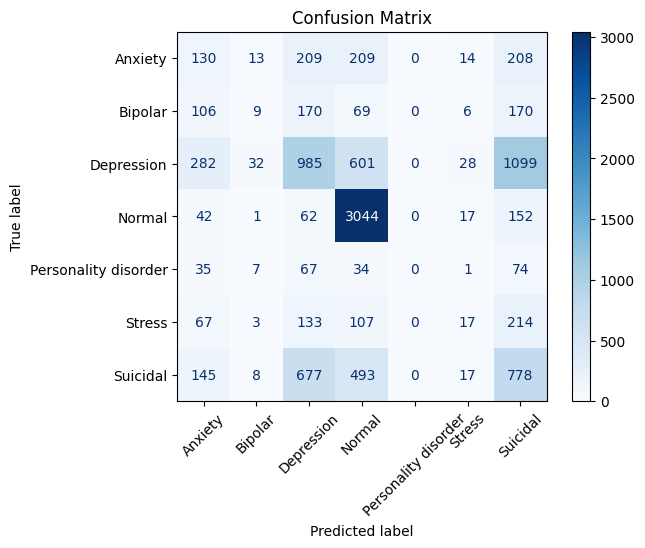

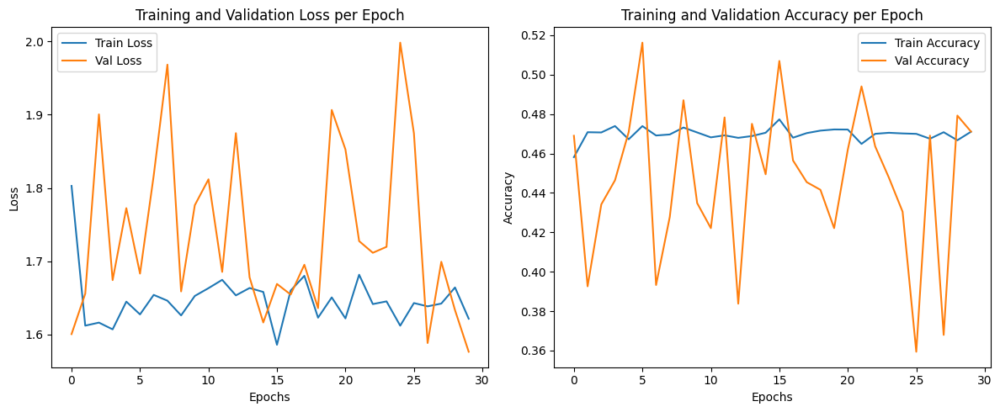

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.01, batch_size=32
Epoch 1/30 | Train Loss: 1.0056 | Val Loss: 0.7612 | Train Acc: 0.6018 | Val Acc: 0.6941 | Time: 7.73s
Epoch 6/30 | Train Loss: 0.5801 | Val Loss: 0.6376 | Train Acc: 0.7655 | Val Acc: 0.7458 | Time: 7.80s
Epoch 11/30 | Train Loss: 0.5157 | Val Loss: 0.6611 | Train Acc: 0.7921 | Val Acc: 0.7484 | Time: 7.98s
Epoch 16/30 | Train Loss: 1.0193 | Val Loss: 0.9915 | Train Acc: 0.6374 | Val Acc: 0.6424 | Time: 8.30s
Epoch 21/30 | Train Loss: 1.3733 | Val Loss: 1.3062 | Train Acc: 0.5116 | Val Acc: 0.5218 | Time: 8.25s
Epoch 26/30 | Train Loss: 1.2649 | Val Loss: 1.3327 | Train Acc: 0.5250 | Val Acc: 0.5203 | Time: 8.27s
Epoch 30/30 | Train Loss: 1.4037 | Val Loss: 1.3858 | Train Acc: 0.4857 | Val Acc: 0.4902 | Time: 7.66s
Maximum accuracy: 0.7524442335073565 obtained at epoch 10
Final accuracy: 0.49017560512577124
Final loss: 1.3858442015720136

Weighted F1-score: 0.4164

Classification Report:

         

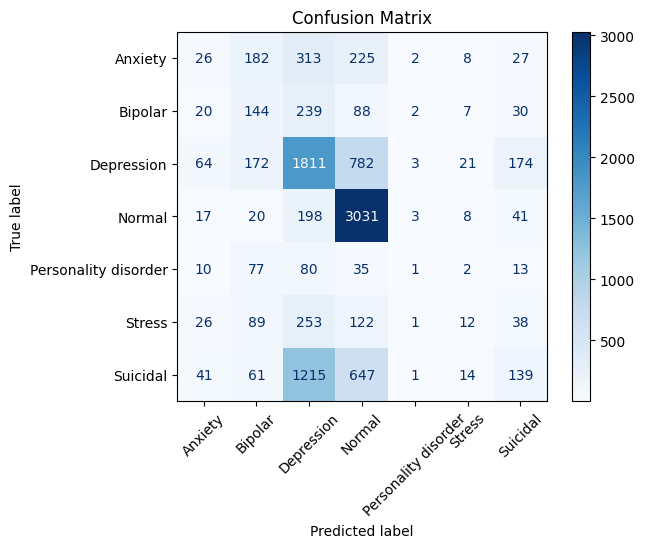

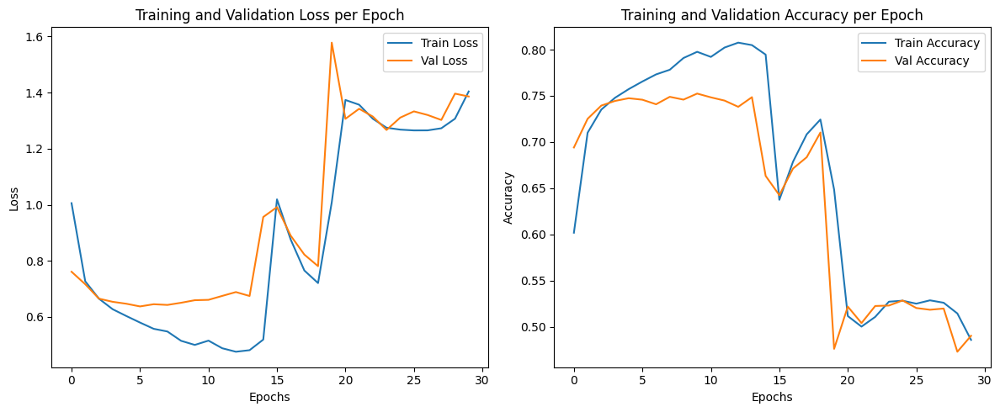

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.01, batch_size=64
Epoch 1/30 | Train Loss: 1.1196 | Val Loss: 0.8500 | Train Acc: 0.5629 | Val Acc: 0.6524 | Time: 5.72s
Epoch 6/30 | Train Loss: 0.5729 | Val Loss: 0.6313 | Train Acc: 0.7703 | Val Acc: 0.7453 | Time: 5.75s
Epoch 11/30 | Train Loss: 0.4746 | Val Loss: 0.6490 | Train Acc: 0.8102 | Val Acc: 0.7512 | Time: 5.63s
Epoch 16/30 | Train Loss: 0.4050 | Val Loss: 0.6857 | Train Acc: 0.8381 | Val Acc: 0.7484 | Time: 5.62s
Epoch 21/30 | Train Loss: 0.4932 | Val Loss: 1.7325 | Train Acc: 0.8140 | Val Acc: 0.4782 | Time: 5.60s
Epoch 26/30 | Train Loss: 1.2262 | Val Loss: 1.2343 | Train Acc: 0.5350 | Val Acc: 0.5297 | Time: 5.69s
Epoch 30/30 | Train Loss: 1.2220 | Val Loss: 1.2459 | Train Acc: 0.5347 | Val Acc: 0.5262 | Time: 5.60s
Maximum accuracy: 0.7575700047460845 obtained at epoch 8
Final accuracy: 0.5262458471760797
Final loss: 1.2459254680257854

Weighted F1-score: 0.4773

Classification Report:

           

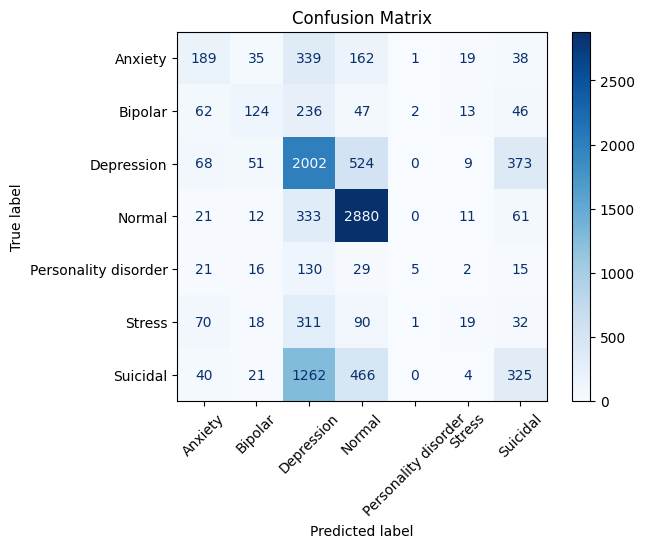

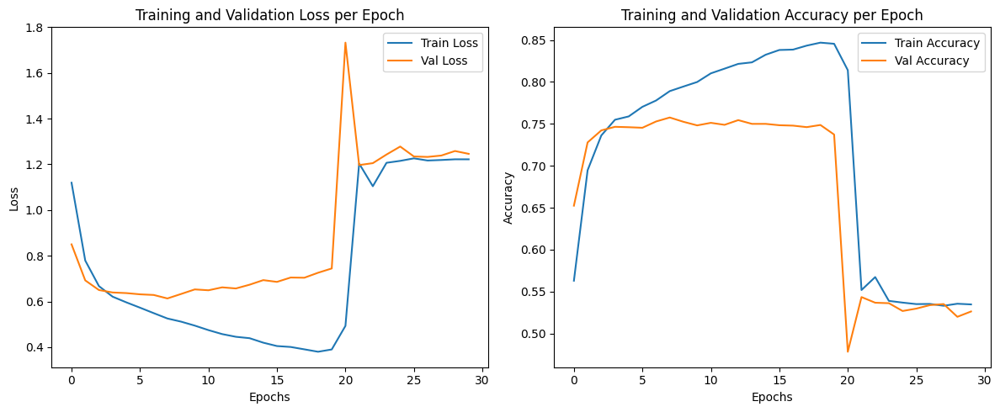

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.01, batch_size=128
Epoch 1/30 | Train Loss: 1.1116 | Val Loss: 0.8286 | Train Acc: 0.5631 | Val Acc: 0.6690 | Time: 4.86s
Epoch 6/30 | Train Loss: 0.5076 | Val Loss: 0.6032 | Train Acc: 0.7970 | Val Acc: 0.7624 | Time: 4.72s
Epoch 11/30 | Train Loss: 0.5793 | Val Loss: 0.6542 | Train Acc: 0.7779 | Val Acc: 0.7533 | Time: 4.64s
Epoch 16/30 | Train Loss: 0.8133 | Val Loss: 0.7765 | Train Acc: 0.6941 | Val Acc: 0.7010 | Time: 4.59s
Epoch 21/30 | Train Loss: 0.4460 | Val Loss: 0.7421 | Train Acc: 0.8249 | Val Acc: 0.7341 | Time: 4.71s
Epoch 26/30 | Train Loss: 0.3603 | Val Loss: 0.8309 | Train Acc: 0.8602 | Val Acc: 0.7354 | Time: 4.76s
Epoch 30/30 | Train Loss: 0.3357 | Val Loss: 0.8656 | Train Acc: 0.8710 | Val Acc: 0.7393 | Time: 4.64s
Maximum accuracy: 0.7662078785002373 obtained at epoch 7
Final accuracy: 0.7393450403417181
Final loss: 0.8655941493539925

Weighted F1-score: 0.7356

Classification Report:

          

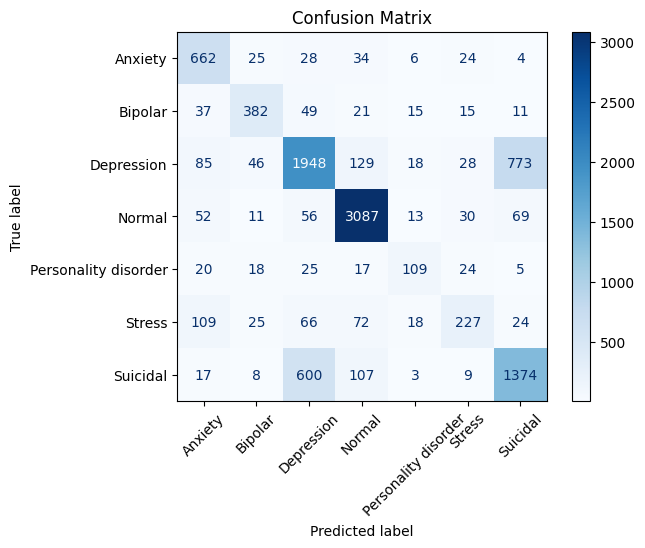

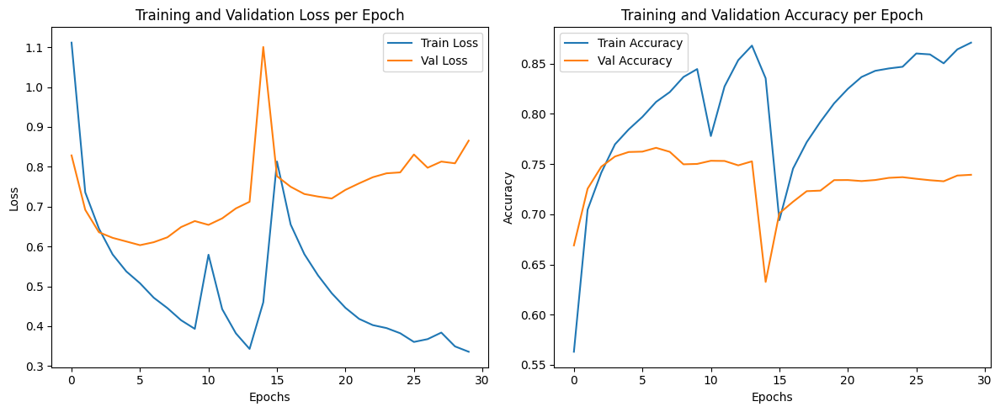

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.001, batch_size=32
Epoch 1/30 | Train Loss: 1.1904 | Val Loss: 0.9284 | Train Acc: 0.5423 | Val Acc: 0.6165 | Time: 8.27s
Epoch 6/30 | Train Loss: 0.5121 | Val Loss: 0.5712 | Train Acc: 0.7916 | Val Acc: 0.7775 | Time: 8.26s
Epoch 11/30 | Train Loss: 0.3347 | Val Loss: 0.6153 | Train Acc: 0.8606 | Val Acc: 0.7822 | Time: 8.27s
Epoch 16/30 | Train Loss: 0.1734 | Val Loss: 0.8140 | Train Acc: 0.9326 | Val Acc: 0.7646 | Time: 8.26s
Epoch 21/30 | Train Loss: 0.0833 | Val Loss: 1.1515 | Train Acc: 0.9717 | Val Acc: 0.7571 | Time: 8.23s
Epoch 26/30 | Train Loss: 0.0523 | Val Loss: 1.2984 | Train Acc: 0.9833 | Val Acc: 0.7567 | Time: 8.23s
Epoch 30/30 | Train Loss: 0.0442 | Val Loss: 1.3258 | Train Acc: 0.9858 | Val Acc: 0.7572 | Time: 7.67s
Maximum accuracy: 0.7821547223540579 obtained at epoch 11
Final accuracy: 0.7571903179876602
Final loss: 1.3257697241324367

Weighted F1-score: 0.7580

Classification Report:

         

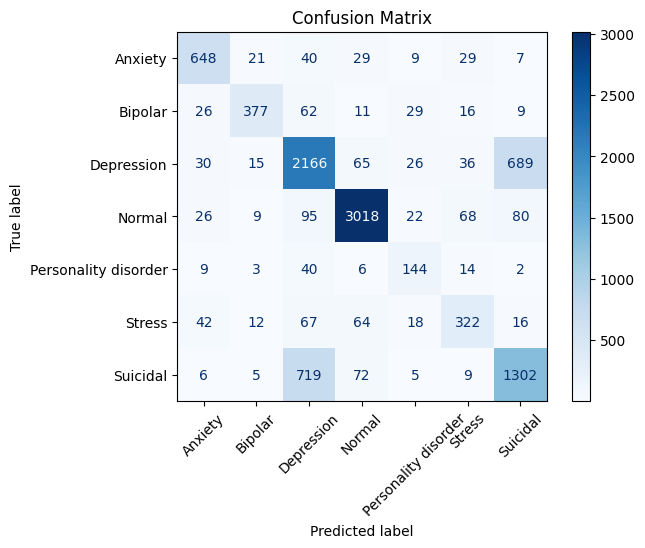

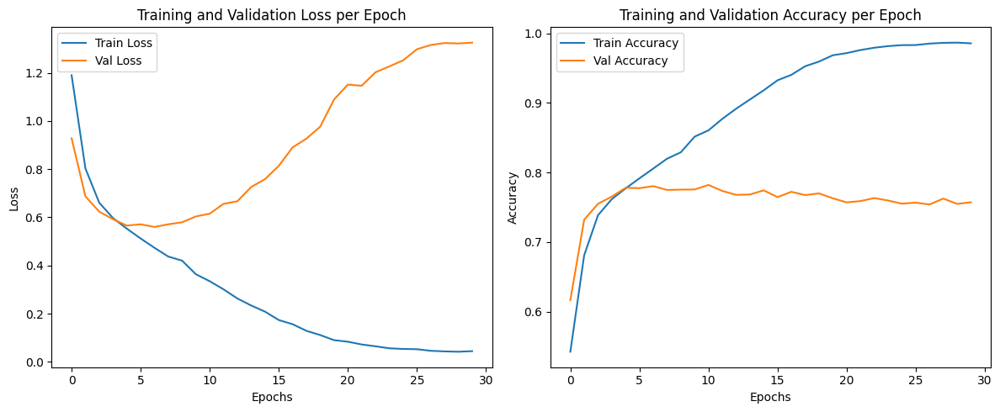

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.001, batch_size=64
Epoch 1/30 | Train Loss: 1.2508 | Val Loss: 1.0224 | Train Acc: 0.5259 | Val Acc: 0.5898 | Time: 5.72s
Epoch 6/30 | Train Loss: 0.5706 | Val Loss: 0.5829 | Train Acc: 0.7695 | Val Acc: 0.7652 | Time: 5.64s
Epoch 11/30 | Train Loss: 0.4064 | Val Loss: 0.5890 | Train Acc: 0.8350 | Val Acc: 0.7721 | Time: 5.57s
Epoch 16/30 | Train Loss: 0.2357 | Val Loss: 0.7397 | Train Acc: 0.9071 | Val Acc: 0.7740 | Time: 5.61s
Epoch 21/30 | Train Loss: 0.1145 | Val Loss: 0.9329 | Train Acc: 0.9605 | Val Acc: 0.7633 | Time: 5.75s
Epoch 26/30 | Train Loss: 0.0565 | Val Loss: 1.2393 | Train Acc: 0.9826 | Val Acc: 0.7546 | Time: 5.71s
Epoch 30/30 | Train Loss: 0.0439 | Val Loss: 1.2957 | Train Acc: 0.9872 | Val Acc: 0.7579 | Time: 5.65s
Maximum accuracy: 0.775984812529663 obtained at epoch 10
Final accuracy: 0.7579496915045087
Final loss: 1.2957393928007646

Weighted F1-score: 0.7559

Classification Report:

          

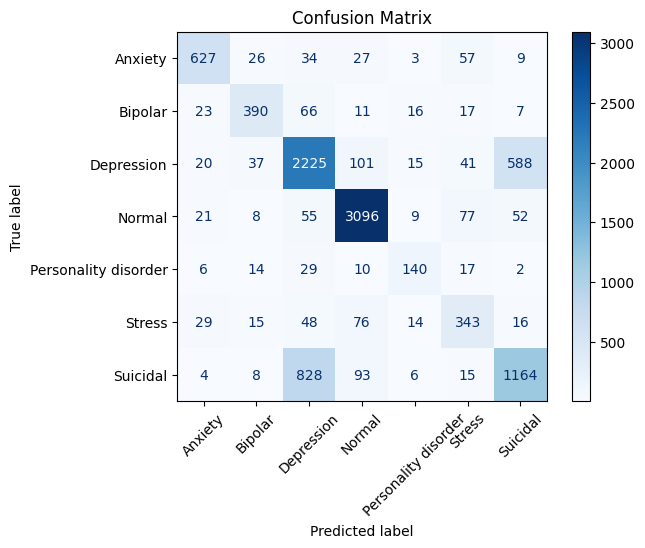

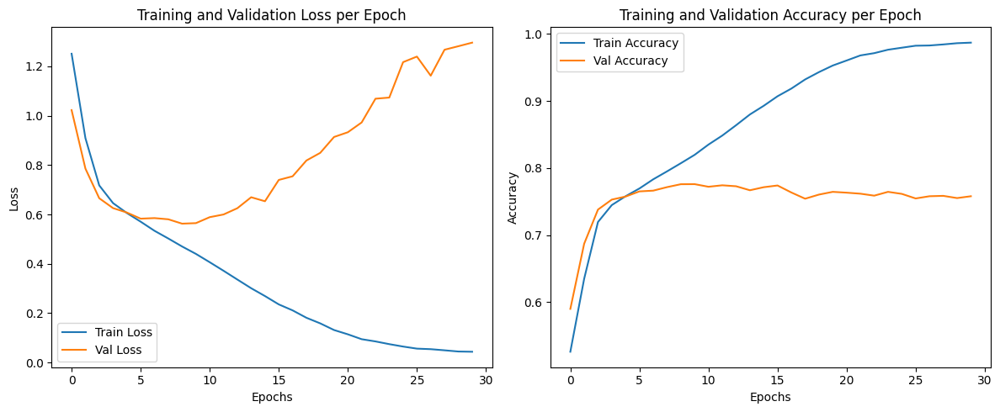

Trying parameters: embedding_dim=100, hidden_dim=256, learning_rate=0.001, batch_size=128
Epoch 1/30 | Train Loss: 1.3885 | Val Loss: 1.2577 | Train Acc: 0.5006 | Val Acc: 0.5374 | Time: 4.73s
Epoch 6/30 | Train Loss: 0.6385 | Val Loss: 0.6341 | Train Acc: 0.7489 | Val Acc: 0.7515 | Time: 4.85s
Epoch 11/30 | Train Loss: 0.5124 | Val Loss: 0.5829 | Train Acc: 0.7930 | Val Acc: 0.7730 | Time: 4.71s
Epoch 16/30 | Train Loss: 0.3865 | Val Loss: 0.6111 | Train Acc: 0.8409 | Val Acc: 0.7660 | Time: 4.60s
Epoch 21/30 | Train Loss: 0.2637 | Val Loss: 0.6884 | Train Acc: 0.8956 | Val Acc: 0.7609 | Time: 4.61s
Epoch 26/30 | Train Loss: 0.1490 | Val Loss: 0.9073 | Train Acc: 0.9463 | Val Acc: 0.7568 | Time: 4.73s
Epoch 30/30 | Train Loss: 0.1053 | Val Loss: 1.0634 | Train Acc: 0.9638 | Val Acc: 0.7582 | Time: 4.64s
Maximum accuracy: 0.778452776459421 obtained at epoch 14
Final accuracy: 0.758234456573327
Final loss: 1.0633684849164573

Weighted F1-score: 0.7580

Classification Report:

          

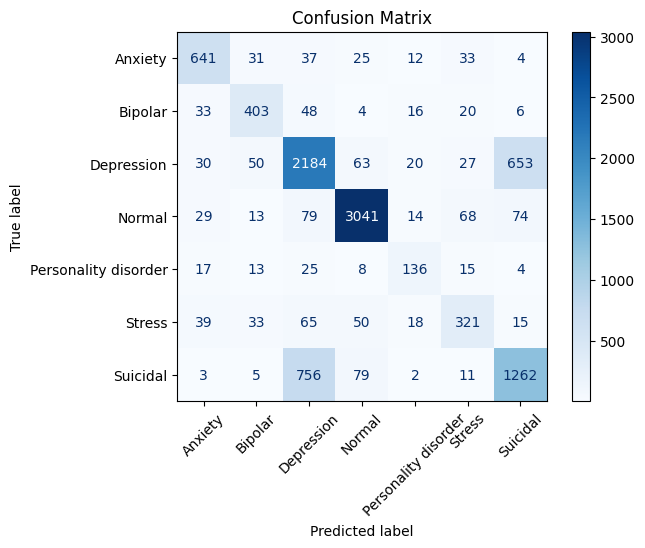

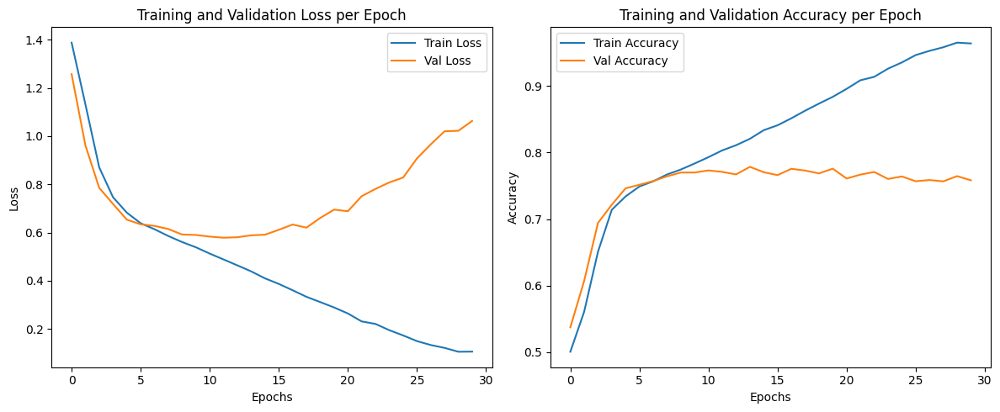

In [ ]:
# 4. -- Grid Search --
best_params = None
best_accuracy = 0.0
grid_results = []

#for embedding_dim in embedding_dim_list:
for hidden_dim in hidden_dim_list:
  for learning_rate in learning_rate_list:
      for batch_size in batch_size_list:
          print(f"Trying parameters: embedding_dim={embedding_dim}, hidden_dim={hidden_dim}, learning_rate={learning_rate}, batch_size={batch_size}")

          #prepare dataset with the predefined tokenizer
          train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
              dataframe=data6,
              tokenizer=tokenizer,
              text_col="statement",
              label_col="status",
              max_seq_len=MAX_SEQ_LEN,
              test_size=TEST_SIZE,
              batch_size=batch_size,
              random_state=RANDOM_STATE
          )

          model6 = GloveLSTM(
              embedding_matrix=embedding_matrix,
              hidden_dim=hidden_dim,
              output_dim=len(label_encoder.classes_)
          )

          #define loss and optimizer
          loss_function = nn.CrossEntropyLoss()
          optimizer = torch.optim.Adam(model6.parameters(), lr=learning_rate)

          #train the model
          model6, train_losses5, val_losses5, train_accuracies5, val_accuracies5, all_preds5, all_labels = train_model(
              model=model6,
              train_loader=train_loader,
              test_loader=test_loader,
              loss_function=loss_function,
              optimizer=optimizer,
              num_epochs= 30
          )
          name = f"grid_search/model_hdim{hidden_dim}_lr{learning_rate}_bs{batch_size}"

          #evaluate model
          evaluate_model(
              label_encoder=label_encoder,
              all_preds=all_preds5,
              all_labels=all_labels,
              train_losses=train_losses5,
              val_losses=val_losses5,
              train_accuracies=train_accuracies5,
              val_accuracies=val_accuracies5,
              save_name= name
          )
          accuracy = max(val_accuracies5)
          smaller_lost = min(val_losses5)

          #update best parameters
          if accuracy > best_accuracy:
              best_accuracy = accuracy
              best_params = {
                  "hidden_dim": hidden_dim,
                  "learning_rate": learning_rate,
                  "batch_size": batch_size
              }

          #save weights
          path = results_path + f'{name}_weights.pt'
          torch.save(model6.state_dict(), path)

          #save results to check later
          grid_results.append({
              "hidden_dim": hidden_dim,
              "learning_rate": learning_rate,
              "batch_size": batch_size,
              "best_val_accuracy": accuracy,
              "best_val_loss": smaller_lost,
              "final_val_accuracy": val_accuracies5[-1],
              "final_val_loss": val_losses5[-1]
          })


In [ ]:
#df to check results
results_df = pd.DataFrame(grid_results)
results_df.to_csv(results_path + 'grid_search/grid_search_results.csv', index=False)

## HYPEPARAMETER DEFINITION AND DATA CREATION FOR NEXT MODELS

### parameters definition

In [ ]:
results_df = pd.read_csv(results_path + 'grid_search/grid_search_results.csv', sep=",")
results_df = results_df.sort_values("final_val_loss", ascending=True).reset_index(drop=True)
print("Top Hyperparameter Combinations:")
display(results_df.head())

Top Hyperparameter Combinations:


,hidden_dim,learning_rate,batch_size,best_val_accuracy,best_val_loss,final_val_accuracy,final_val_loss
0,64,0.001,128,0.781870,0.567434,0.777504,0.602347
1,64,0.001,64,0.776459,0.575322,0.765259,0.683980
2,64,0.010,32,0.749027,0.644028,0.739725,0.722846
3,128,0.001,128,0.779307,0.563567,0.762221,0.760795
4,64,0.001,32,0.771713,0.589714,0.758045,0.763521


In [ ]:
#BEST HYPERPARAMETERS
best_hidden_dim = 64
best_learning_rate = 0.001
best_batch_size = 128
best_dropout_value = 0.3  #found at model 7
best_num_layers = 4 #found at model 8

In [ ]:
#GLOVE EMBEDDINGS
glove_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/data/glove.6B.100d.txt'

#load glove embeddings
def load_glove_embeddings(glove_file, embedding_dim):
    embeddings_index = {}
    with open(glove_file, encoding='utf-8') as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            vector = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = vector
    print(f"Loaded {len(embeddings_index)} word vectors from GloVe.")
    return embeddings_index

embedding_dim = 100
embeddings_index = load_glove_embeddings(glove_path, embedding_dim)

glove_embedding_matrix = build_embedding_matrix_from_glove(
    tokenizer=tokenizer,
    glove_index=embeddings_index,
    embedding_dim=100,
    max_vocab_size=MAX_VOCAB_SIZE
)

Loaded 400000 word vectors from GloVe.


In [ ]:
# 1. -- Prepare data --
#we use data after data cleaning
final_data = data.copy()

# Remove outliers that are too long
print("Length before outlier removal:", len(final_data))
final_data = final_data[final_data['statement'].str.len() < 15000]
print("Length after outlier removal:", len(final_data))

# Clean text
final_data['statement'] = final_data['statement'].apply(clean_text)
display(final_data.head(5))

Length before outlier removal: 52681
Length after outlier removal: 52675


,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"all wrong, back off dear, forward doubt. stay ...",Anxiety
3,ive shifted my focus to something else but im ...,Anxiety
4,"im restless and restless, its been a month now...",Anxiety


### comprovation

In [ ]:
#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)

In [ ]:
model_comp = GloveLSTM(
    embedding_matrix=glove_embedding_matrix, #glove matrix
    hidden_dim=best_hidden_dim,              #best hidden dimension
    output_dim=len(label_encoder.classes_)
)

#define loss and optimizer
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_comp.parameters(), lr=best_learning_rate) #best learning rate

#train the model
model_comp, train_losses_comp, val_losses_comp, train_accuracies_comp, val_accuracies_comp, all_preds_comp, all_labels_comp = train_model(
    model=model_comp,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs= 30
)

Epoch 1/30 | Train Loss: 1.3834 | Val Loss: 1.1641 | Train Acc: 0.4935 | Val Acc: 0.5448 | Time: 1.35s
Epoch 6/30 | Train Loss: 0.7124 | Val Loss: 0.6858 | Train Acc: 0.7233 | Val Acc: 0.7341 | Time: 3.05s
Epoch 11/30 | Train Loss: 0.5855 | Val Loss: 0.6375 | Train Acc: 0.7686 | Val Acc: 0.7549 | Time: 1.27s
Epoch 16/30 | Train Loss: 0.5182 | Val Loss: 0.5855 | Train Acc: 0.7914 | Val Acc: 0.7749 | Time: 1.63s
Epoch 21/30 | Train Loss: 0.4683 | Val Loss: 0.5821 | Train Acc: 0.8110 | Val Acc: 0.7772 | Time: 1.22s
Epoch 26/30 | Train Loss: 0.4282 | Val Loss: 0.6096 | Train Acc: 0.8255 | Val Acc: 0.7735 | Time: 1.65s
Epoch 30/30 | Train Loss: 0.3995 | Val Loss: 0.5983 | Train Acc: 0.8367 | Val Acc: 0.7799 | Time: 1.20s


Maximum accuracy: 0.7804461319411485 obtained at epoch 23
Final accuracy: 0.7798766018035121
Final loss: 0.598286067505917

Weighted F1-score: 0.7791

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.82      0.79      0.80       783
             Bipolar       0.82      0.74      0.78       530
          Depression       0.73      0.75      0.74      3027
              Normal       0.91      0.94      0.92      3318
Personality disorder       0.61      0.61      0.61       218
              Stress       0.61      0.62      0.62       541
            Suicidal       0.68      0.65      0.66      2118

            accuracy                           0.78     10535
           macro avg       0.74      0.73      0.73     10535
        weighted avg       0.78      0.78      0.78     10535



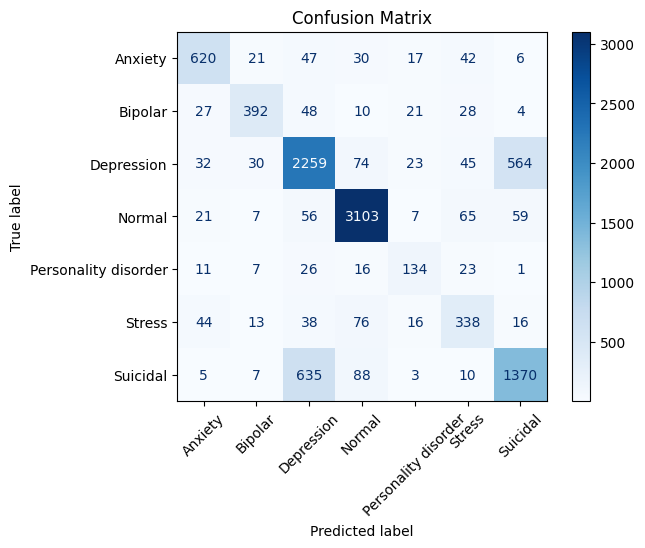

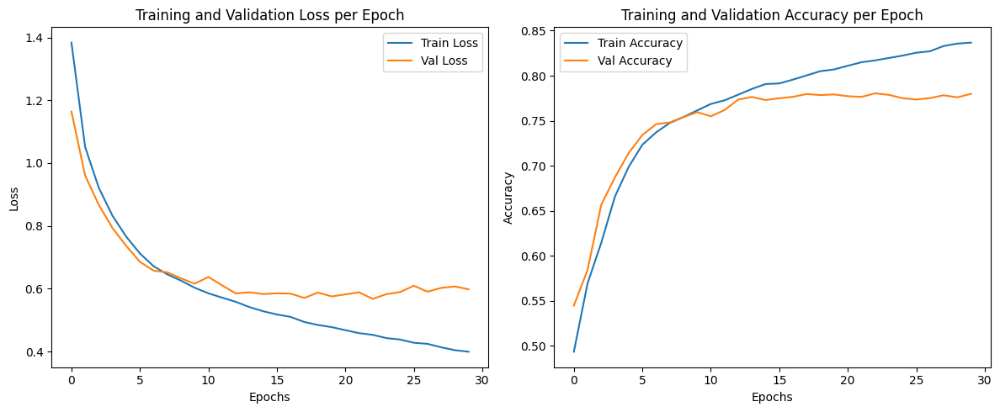

In [ ]:
#evaluate model
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds_comp,
    all_labels=all_labels_comp,
    train_losses=train_losses_comp,
    val_losses=val_losses_comp,
    train_accuracies=train_accuracies_comp,
    val_accuracies=val_accuracies_comp,
    save_name= "model_comp"
)

### try class weights

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
# Compute class weights using sklearn
class_labels = final_data["status"]
class_weights_np = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(class_labels),
    y=class_labels
)
class_weights = torch.tensor(class_weights_np, dtype=torch.float32)

print(class_weights)
print("Label classes:", label_encoder.classes_)

tensor([1.9591, 2.7107, 0.4885, 0.4604, 6.9935, 2.9088, 0.7066])
Label classes: ['Anxiety' 'Bipolar' 'Depression' 'Normal' 'Personality disorder' 'Stress'
 'Suicidal']


In [ ]:
#prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)

In [ ]:
# 3. -- Model setup
model_weighted = GloveLSTM(
    embedding_matrix=glove_embedding_matrix,
    hidden_dim=best_hidden_dim,
    output_dim=len(label_encoder.classes_)
)

# 4. -- Define weighted loss and optimizer
loss_function = nn.CrossEntropyLoss(weight=class_weights)  #weighted loss
optimizer = torch.optim.Adam(model_weighted.parameters(), lr=best_learning_rate)

#move loss function to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loss_function = loss_function.to(device)

# 5. -- Train
model_weighted, train_losses_comp, val_losses_comp, train_accuracies_comp, val_accuracies_comp, all_preds_comp, all_labels_comp = train_model(
    model=model_weighted,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.7781 | Val Loss: 1.6780 | Train Acc: 0.3677 | Val Acc: 0.4165 | Time: 1.34s
Epoch 6/30 | Train Loss: 0.9731 | Val Loss: 1.0247 | Train Acc: 0.6465 | Val Acc: 0.6412 | Time: 1.22s
Epoch 11/30 | Train Loss: 0.7187 | Val Loss: 0.7753 | Train Acc: 0.7247 | Val Acc: 0.7142 | Time: 1.21s
Epoch 16/30 | Train Loss: 0.5924 | Val Loss: 0.7818 | Train Acc: 0.7487 | Val Acc: 0.6914 | Time: 1.23s
Epoch 21/30 | Train Loss: 0.5101 | Val Loss: 0.7109 | Train Acc: 0.7662 | Val Acc: 0.7420 | Time: 1.20s
Epoch 26/30 | Train Loss: 0.4469 | Val Loss: 0.7890 | Train Acc: 0.7779 | Val Acc: 0.7486 | Time: 1.48s
Epoch 30/30 | Train Loss: 0.4005 | Val Loss: 0.7813 | Train Acc: 0.7905 | Val Acc: 0.7429 | Time: 1.22s


Maximum accuracy: 0.7501661129568107 obtained at epoch 28
Final accuracy: 0.7428571428571429
Final loss: 0.7813439160944468

Weighted F1-score: 0.7477

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.75      0.82      0.78       783
             Bipolar       0.72      0.78      0.75       530
          Depression       0.81      0.56      0.66      3027
              Normal       0.94      0.88      0.91      3318
Personality disorder       0.45      0.75      0.56       218
              Stress       0.41      0.77      0.54       541
            Suicidal       0.63      0.75      0.68      2118

            accuracy                           0.74     10535
           macro avg       0.67      0.76      0.70     10535
        weighted avg       0.78      0.74      0.75     10535



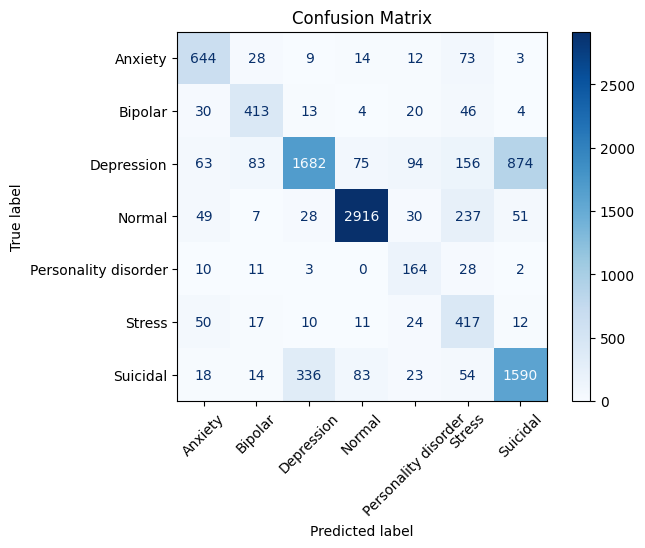

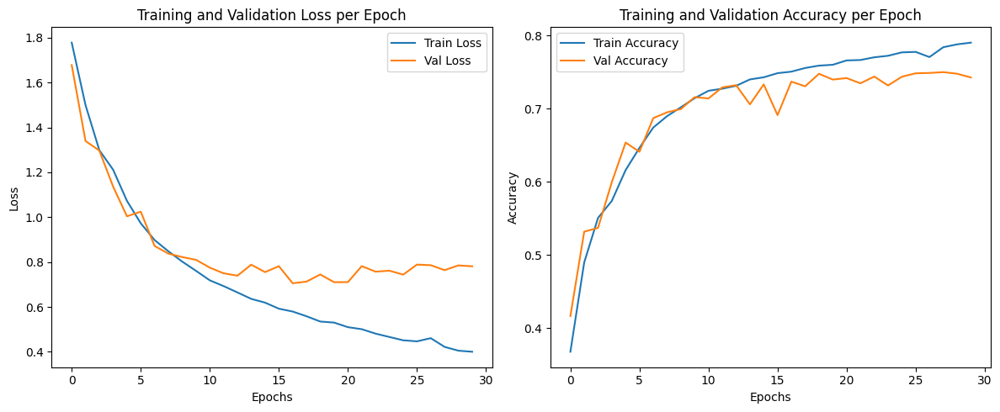

In [ ]:
# 6. -- Evaluate
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds_comp,
    all_labels=all_labels_comp,
    train_losses=train_losses_comp,
    val_losses=val_losses_comp,
    train_accuracies=train_accuracies_comp,
    val_accuracies=val_accuracies_comp,
    save_name="model_weighted"
)

## 7. Dropout to treat overfitting

In [ ]:
# 1. -- prepare data --
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)

In [ ]:
# 2.  -- new class definition --
class DropoutLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, dropout_value):
        super(DropoutLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout_value)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        hidden_dropout = self.dropout(hidden[-1])
        output = self.fc(hidden_dropout)
        return output

In [ ]:
# 3.  -- train model --
model7 = DropoutLSTM(
    embedding_matrix=glove_embedding_matrix,
    hidden_dim=best_hidden_dim,
    output_dim=len(label_encoder.classes_),
    dropout_value=0.3 #best dropout value found at the following subsection
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model7.parameters(), lr=best_learning_rate)

model7, train_losses7, val_losses7, train_accuracies7, val_accuracies7, all_preds7, all_labels7 = train_model(
    model=model7,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs= 30
)

Epoch 1/30 | Train Loss: 1.4274 | Val Loss: 1.3082 | Train Acc: 0.4931 | Val Acc: 0.5308 | Time: 1.38s
Epoch 6/30 | Train Loss: 0.8333 | Val Loss: 0.7751 | Train Acc: 0.6759 | Val Acc: 0.7056 | Time: 1.22s
Epoch 11/30 | Train Loss: 0.6625 | Val Loss: 0.6412 | Train Acc: 0.7440 | Val Acc: 0.7509 | Time: 1.24s
Epoch 16/30 | Train Loss: 0.5896 | Val Loss: 0.6156 | Train Acc: 0.7720 | Val Acc: 0.7650 | Time: 1.22s
Epoch 21/30 | Train Loss: 0.5347 | Val Loss: 0.5907 | Train Acc: 0.7920 | Val Acc: 0.7718 | Time: 1.22s
Epoch 26/30 | Train Loss: 0.4880 | Val Loss: 0.5834 | Train Acc: 0.8091 | Val Acc: 0.7774 | Time: 1.24s
Epoch 30/30 | Train Loss: 0.4635 | Val Loss: 0.5893 | Train Acc: 0.8178 | Val Acc: 0.7773 | Time: 1.79s


Maximum accuracy: 0.7790223065970574 obtained at epoch 27
Final accuracy: 0.7773137161841481
Final loss: 0.5892623662948608

Weighted F1-score: 0.7748

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.77      0.85      0.81       783
             Bipolar       0.83      0.72      0.77       530
          Depression       0.76      0.70      0.73      3027
              Normal       0.89      0.95      0.92      3318
Personality disorder       0.61      0.62      0.62       218
              Stress       0.58      0.55      0.57       541
            Suicidal       0.68      0.67      0.68      2118

            accuracy                           0.78     10535
           macro avg       0.73      0.72      0.73     10535
        weighted avg       0.77      0.78      0.77     10535



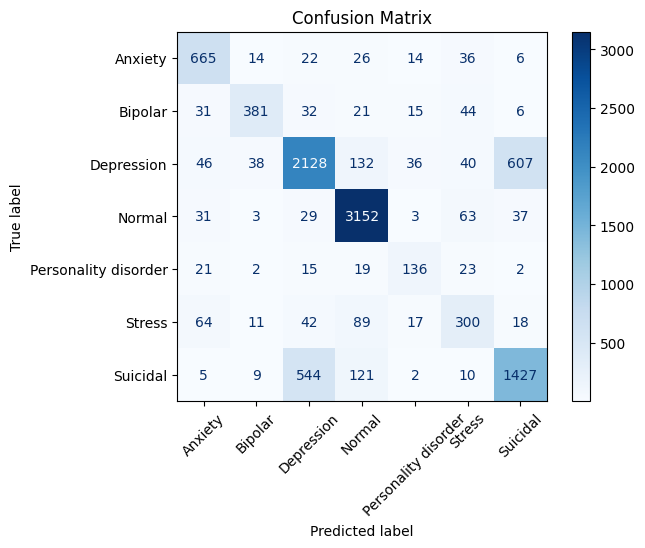

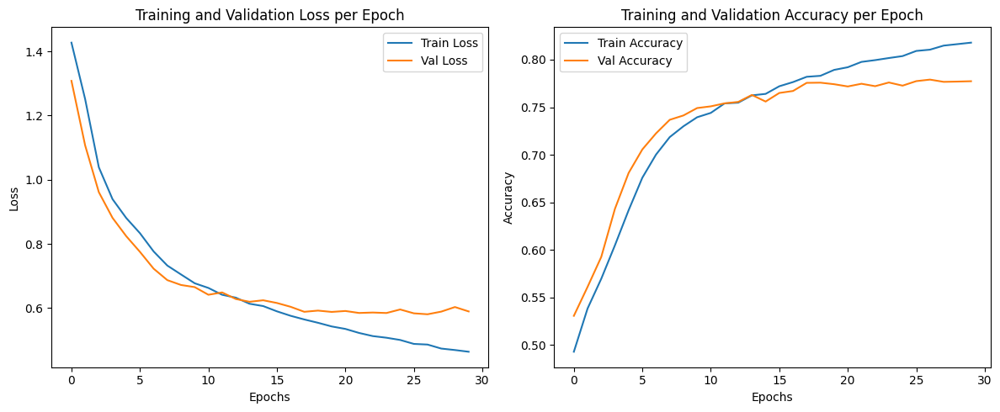

In [ ]:
# 4.  -- evaluate model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds7,
    all_labels=all_labels7,
    train_losses=train_losses7,
    val_losses=val_losses7,
    train_accuracies=train_accuracies7,
    val_accuracies=val_accuracies7,
    save_name="model_dropout"
)

In [ ]:
torch.save(model7.state_dict(), results_path + 'models/model7_dropout0.5_weights.pt')

### search for the best dropout value

Trying dropout value: 0.1
Epoch 1/30 | Train Loss: 1.3494 | Val Loss: 1.1535 | Train Acc: 0.5133 | Val Acc: 0.5512 | Time: 2.19s
Epoch 6/30 | Train Loss: 0.7987 | Val Loss: 0.7522 | Train Acc: 0.6887 | Val Acc: 0.7085 | Time: 1.25s
Epoch 11/30 | Train Loss: 0.6311 | Val Loss: 0.6417 | Train Acc: 0.7519 | Val Acc: 0.7545 | Time: 1.26s
Epoch 16/30 | Train Loss: 0.5622 | Val Loss: 0.6137 | Train Acc: 0.7785 | Val Acc: 0.7588 | Time: 1.28s
Epoch 21/30 | Train Loss: 0.5141 | Val Loss: 0.5942 | Train Acc: 0.7947 | Val Acc: 0.7667 | Time: 1.23s
Epoch 26/30 | Train Loss: 0.4651 | Val Loss: 0.6036 | Train Acc: 0.8126 | Val Acc: 0.7716 | Time: 1.25s
Epoch 30/30 | Train Loss: 0.4376 | Val Loss: 0.5903 | Train Acc: 0.8238 | Val Acc: 0.7760 | Time: 1.22s
Maximum accuracy: 0.7762695775984813 obtained at epoch 23
Final accuracy: 0.775984812529663
Final loss: 0.5903237641575825

Weighted F1-score: 0.7752

Classification Report:

                      precision    recall  f1-score   support

          

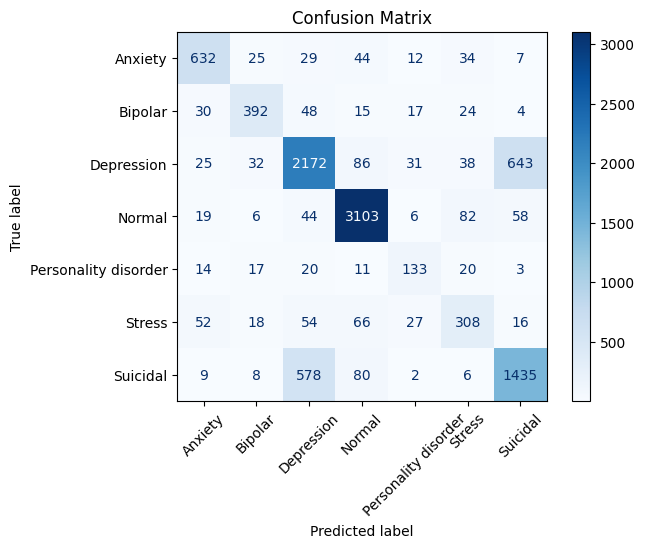

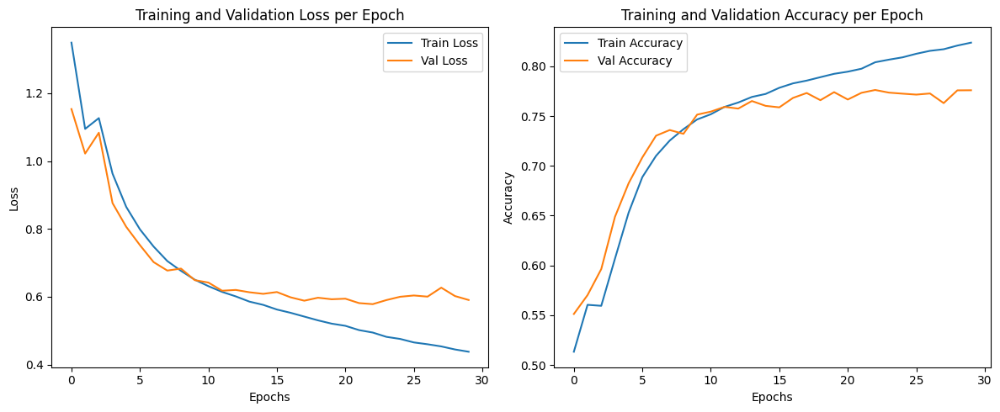

Trying dropout value: 0.2
Epoch 1/30 | Train Loss: 1.3624 | Val Loss: 1.1787 | Train Acc: 0.5119 | Val Acc: 0.5472 | Time: 1.33s
Epoch 6/30 | Train Loss: 0.7372 | Val Loss: 0.7090 | Train Acc: 0.7171 | Val Acc: 0.7303 | Time: 1.23s
Epoch 11/30 | Train Loss: 0.6060 | Val Loss: 0.6114 | Train Acc: 0.7638 | Val Acc: 0.7663 | Time: 1.25s
Epoch 16/30 | Train Loss: 0.5420 | Val Loss: 0.6036 | Train Acc: 0.7879 | Val Acc: 0.7651 | Time: 1.23s
Epoch 21/30 | Train Loss: 0.4961 | Val Loss: 0.5864 | Train Acc: 0.8034 | Val Acc: 0.7748 | Time: 1.29s
Epoch 26/30 | Train Loss: 0.4545 | Val Loss: 0.6095 | Train Acc: 0.8211 | Val Acc: 0.7729 | Time: 1.25s
Epoch 30/30 | Train Loss: 0.4257 | Val Loss: 0.6115 | Train Acc: 0.8312 | Val Acc: 0.7795 | Time: 1.23s
Maximum accuracy: 0.7794969150450878 obtained at epoch 30
Final accuracy: 0.7794969150450878
Final loss: 0.6114550979740648

Weighted F1-score: 0.7778

Classification Report:

                      precision    recall  f1-score   support

         

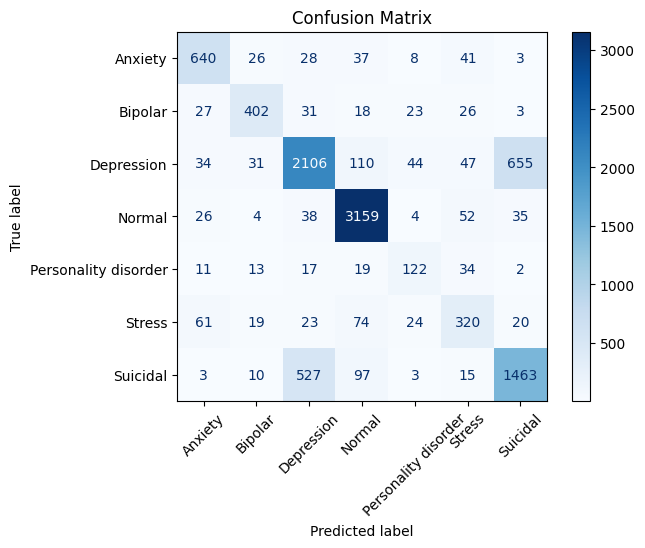

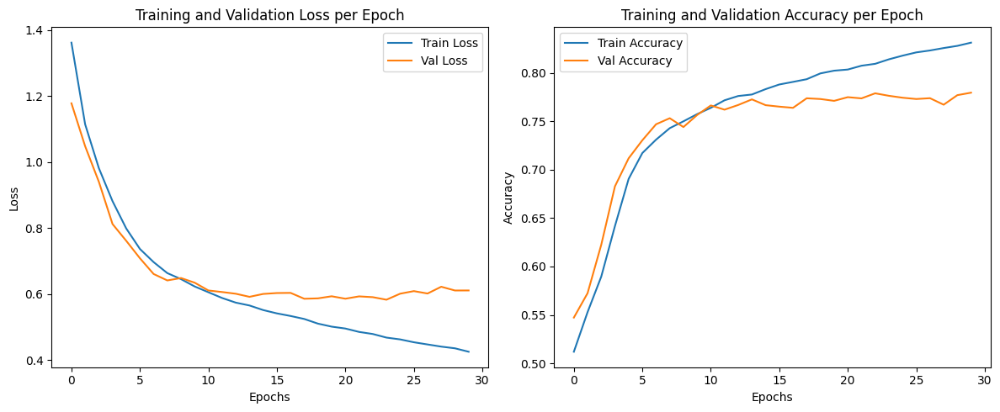

Trying dropout value: 0.3
Epoch 1/30 | Train Loss: 1.4274 | Val Loss: 1.3082 | Train Acc: 0.4931 | Val Acc: 0.5308 | Time: 1.43s
Epoch 6/30 | Train Loss: 0.8333 | Val Loss: 0.7751 | Train Acc: 0.6759 | Val Acc: 0.7056 | Time: 1.25s
Epoch 11/30 | Train Loss: 0.6625 | Val Loss: 0.6412 | Train Acc: 0.7440 | Val Acc: 0.7509 | Time: 1.52s
Epoch 16/30 | Train Loss: 0.5896 | Val Loss: 0.6156 | Train Acc: 0.7720 | Val Acc: 0.7650 | Time: 1.24s
Epoch 21/30 | Train Loss: 0.5347 | Val Loss: 0.5907 | Train Acc: 0.7920 | Val Acc: 0.7718 | Time: 1.58s
Epoch 26/30 | Train Loss: 0.4880 | Val Loss: 0.5834 | Train Acc: 0.8091 | Val Acc: 0.7774 | Time: 1.24s
Epoch 30/30 | Train Loss: 0.4635 | Val Loss: 0.5893 | Train Acc: 0.8178 | Val Acc: 0.7773 | Time: 1.27s
Maximum accuracy: 0.7790223065970574 obtained at epoch 27
Final accuracy: 0.7773137161841481
Final loss: 0.5892623662948608

Weighted F1-score: 0.7748

Classification Report:

                      precision    recall  f1-score   support

         

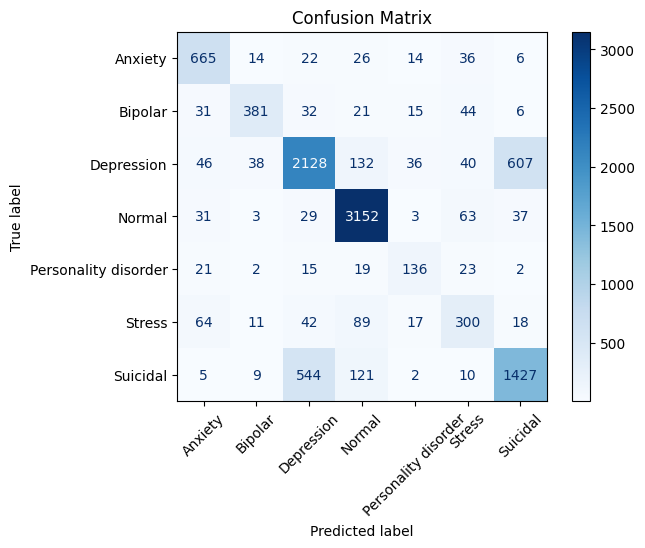

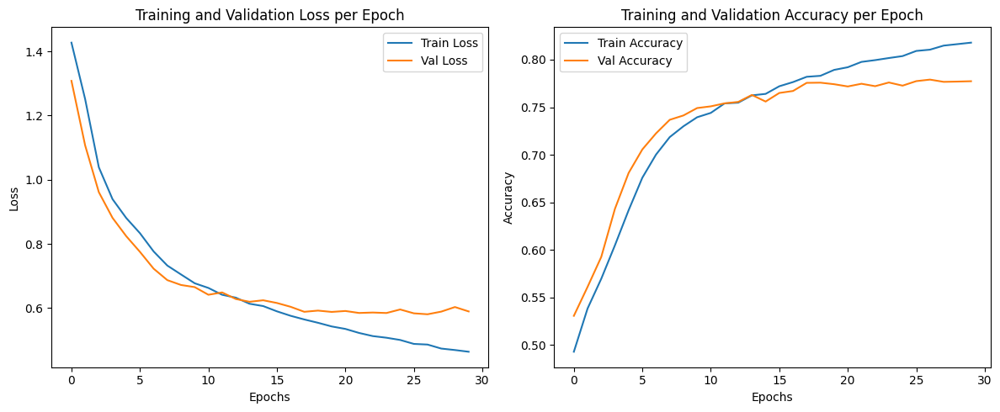

Trying dropout value: 0.4
Epoch 1/30 | Train Loss: 1.3808 | Val Loss: 1.1603 | Train Acc: 0.5062 | Val Acc: 0.5442 | Time: 1.35s
Epoch 6/30 | Train Loss: 0.8049 | Val Loss: 0.7401 | Train Acc: 0.6871 | Val Acc: 0.7150 | Time: 1.67s
Epoch 11/30 | Train Loss: 0.6592 | Val Loss: 0.6467 | Train Acc: 0.7464 | Val Acc: 0.7522 | Time: 1.24s
Epoch 16/30 | Train Loss: 0.5861 | Val Loss: 0.6121 | Train Acc: 0.7750 | Val Acc: 0.7661 | Time: 1.73s
Epoch 21/30 | Train Loss: 0.5415 | Val Loss: 0.6457 | Train Acc: 0.7892 | Val Acc: 0.7626 | Time: 1.27s
Epoch 26/30 | Train Loss: 0.5080 | Val Loss: 0.6086 | Train Acc: 0.8029 | Val Acc: 0.7728 | Time: 1.67s
Epoch 30/30 | Train Loss: 0.4779 | Val Loss: 0.6009 | Train Acc: 0.8131 | Val Acc: 0.7710 | Time: 1.25s
Maximum accuracy: 0.7812055054579972 obtained at epoch 24
Final accuracy: 0.7710488846701471
Final loss: 0.6008606915732464

Weighted F1-score: 0.7703

Classification Report:

                      precision    recall  f1-score   support

         

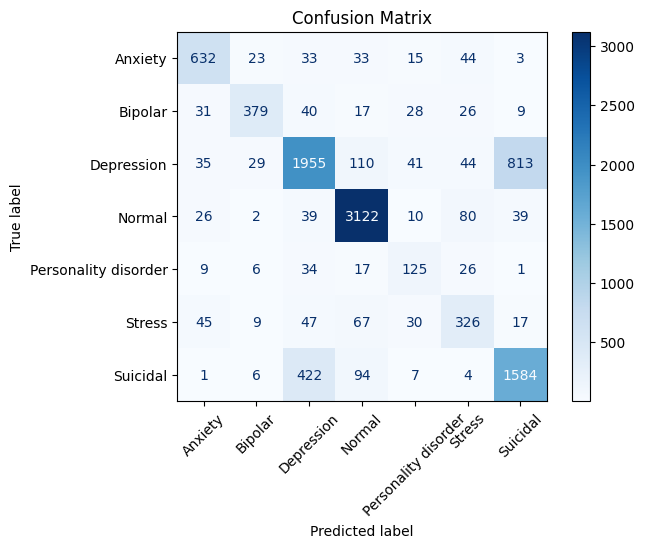

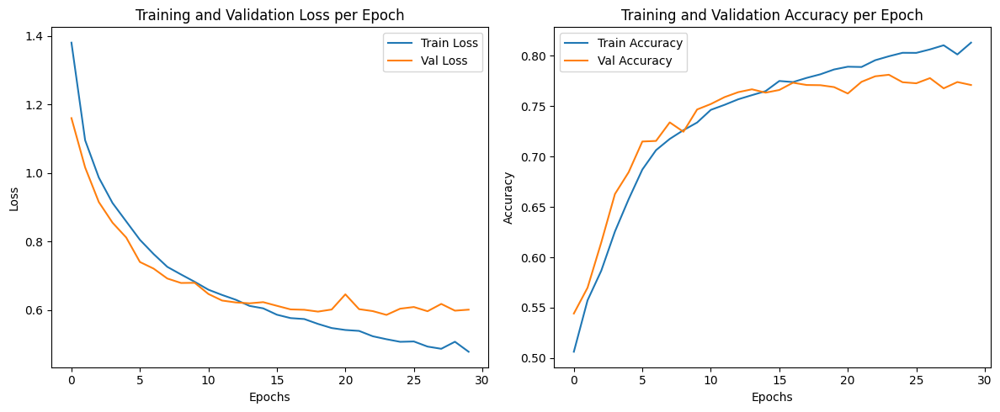

Trying dropout value: 0.5
Epoch 1/30 | Train Loss: 1.4208 | Val Loss: 1.2504 | Train Acc: 0.4940 | Val Acc: 0.5208 | Time: 1.47s
Epoch 6/30 | Train Loss: 0.8100 | Val Loss: 0.7364 | Train Acc: 0.6908 | Val Acc: 0.7228 | Time: 1.26s
Epoch 11/30 | Train Loss: 0.6665 | Val Loss: 0.6544 | Train Acc: 0.7439 | Val Acc: 0.7491 | Time: 1.34s
Epoch 16/30 | Train Loss: 0.6101 | Val Loss: 0.6486 | Train Acc: 0.7691 | Val Acc: 0.7499 | Time: 1.22s
Epoch 21/30 | Train Loss: 0.5734 | Val Loss: 0.6075 | Train Acc: 0.7801 | Val Acc: 0.7683 | Time: 1.25s
Epoch 26/30 | Train Loss: 0.5330 | Val Loss: 0.6043 | Train Acc: 0.7939 | Val Acc: 0.7712 | Time: 1.22s
Epoch 30/30 | Train Loss: 0.5871 | Val Loss: 0.6201 | Train Acc: 0.7785 | Val Acc: 0.7690 | Time: 1.63s
Maximum accuracy: 0.7750355956336022 obtained at epoch 29
Final accuracy: 0.7689606074988135
Final loss: 0.6200520999460335

Weighted F1-score: 0.7678

Classification Report:

                      precision    recall  f1-score   support

         

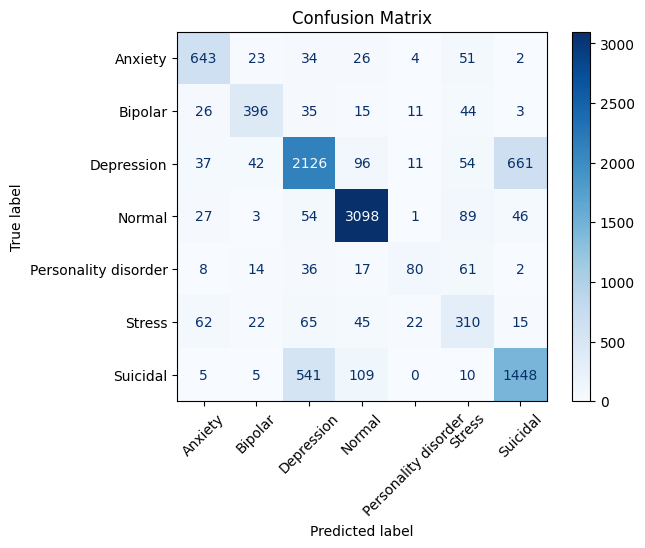

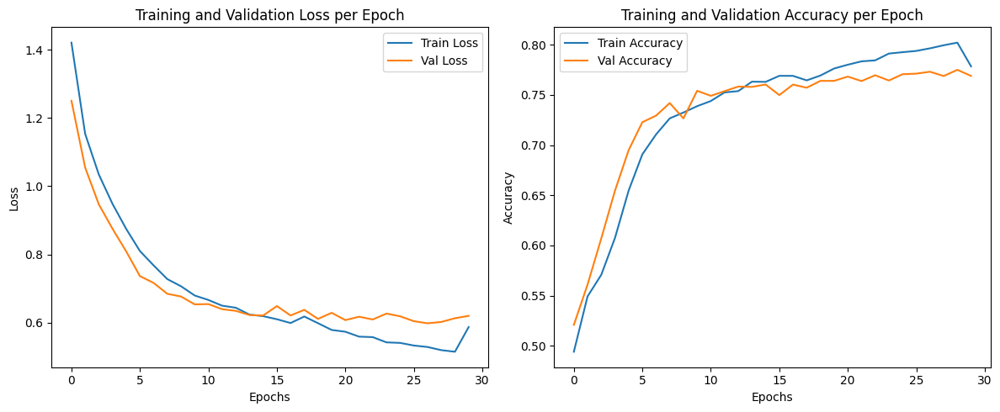

Trying dropout value: 0.6
Epoch 1/30 | Train Loss: 1.3941 | Val Loss: 1.2161 | Train Acc: 0.5068 | Val Acc: 0.5339 | Time: 2.18s
Epoch 6/30 | Train Loss: 0.8629 | Val Loss: 0.7984 | Train Acc: 0.6603 | Val Acc: 0.6988 | Time: 1.26s
Epoch 11/30 | Train Loss: 0.6993 | Val Loss: 0.6665 | Train Acc: 0.7340 | Val Acc: 0.7464 | Time: 1.24s
Epoch 16/30 | Train Loss: 0.6339 | Val Loss: 0.6420 | Train Acc: 0.7573 | Val Acc: 0.7544 | Time: 1.30s
Epoch 21/30 | Train Loss: 0.5928 | Val Loss: 0.6279 | Train Acc: 0.7698 | Val Acc: 0.7599 | Time: 1.28s
Epoch 26/30 | Train Loss: 0.5608 | Val Loss: 0.6112 | Train Acc: 0.7839 | Val Acc: 0.7695 | Time: 1.29s
Epoch 30/30 | Train Loss: 0.5238 | Val Loss: 0.6282 | Train Acc: 0.7964 | Val Acc: 0.7667 | Time: 1.24s
Maximum accuracy: 0.7722828666350261 obtained at epoch 29
Final accuracy: 0.7666824869482677
Final loss: 0.6281689286950123

Weighted F1-score: 0.7619

Classification Report:

                      precision    recall  f1-score   support

         

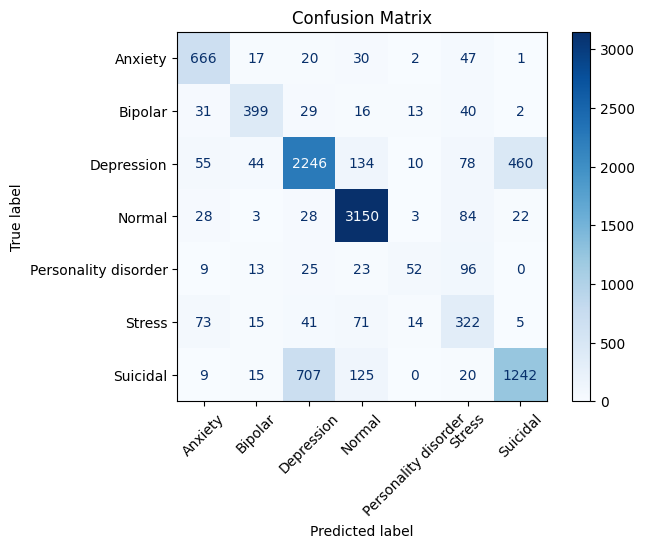

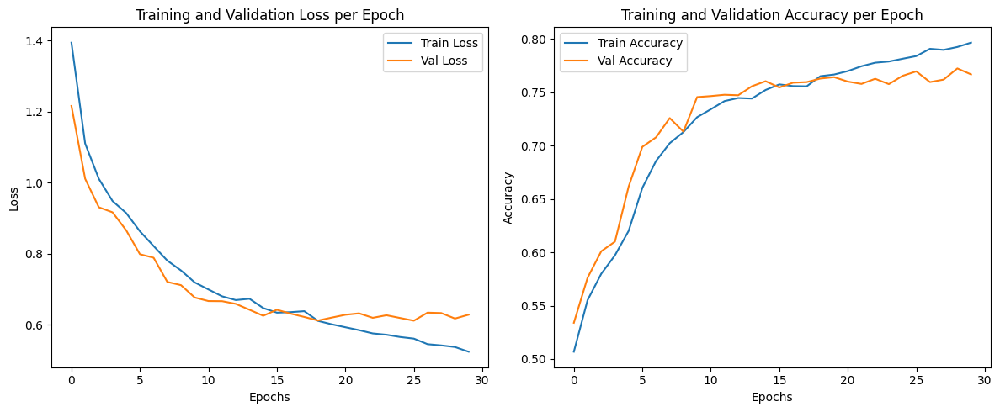

Trying dropout value: 0.7
Epoch 1/40 | Train Loss: 1.4482 | Val Loss: 1.3576 | Train Acc: 0.4810 | Val Acc: 0.5184 | Time: 1.35s
Epoch 6/40 | Train Loss: 0.9907 | Val Loss: 0.9385 | Train Acc: 0.5919 | Val Acc: 0.6020 | Time: 1.36s
Epoch 11/40 | Train Loss: 0.9648 | Val Loss: 0.8910 | Train Acc: 0.6027 | Val Acc: 0.6264 | Time: 1.25s
Epoch 16/40 | Train Loss: 0.8414 | Val Loss: 0.7921 | Train Acc: 0.6664 | Val Acc: 0.6771 | Time: 1.54s
Epoch 21/40 | Train Loss: 0.7525 | Val Loss: 0.7181 | Train Acc: 0.7088 | Val Acc: 0.7269 | Time: 1.24s
Epoch 26/40 | Train Loss: 0.6840 | Val Loss: 0.6695 | Train Acc: 0.7354 | Val Acc: 0.7477 | Time: 1.62s
Epoch 31/40 | Train Loss: 0.6352 | Val Loss: 0.6354 | Train Acc: 0.7540 | Val Acc: 0.7523 | Time: 1.30s
Epoch 36/40 | Train Loss: 0.5989 | Val Loss: 0.6333 | Train Acc: 0.7681 | Val Acc: 0.7586 | Time: 1.75s
Epoch 40/40 | Train Loss: 0.5744 | Val Loss: 0.6285 | Train Acc: 0.7778 | Val Acc: 0.7575 | Time: 1.27s
Maximum accuracy: 0.7586141433317513 obt

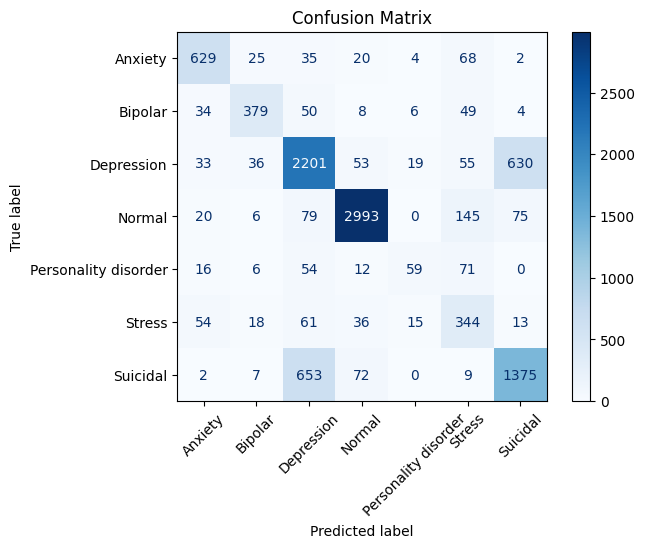

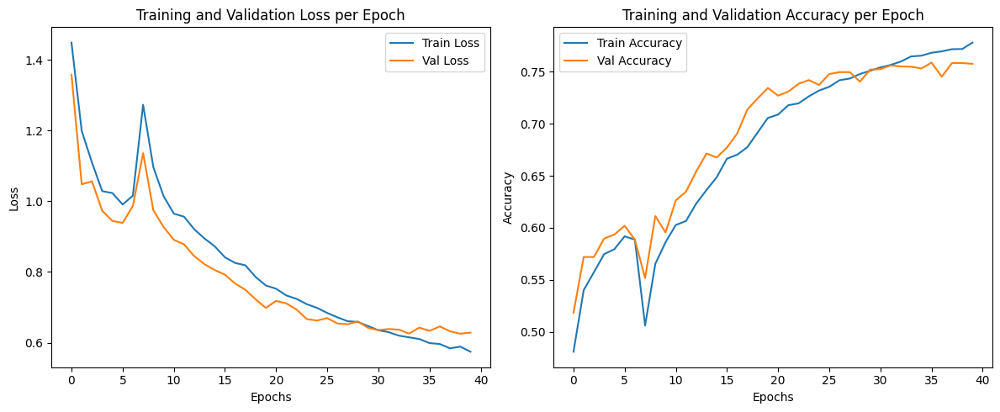

In [ ]:
dropout_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
#weighted_classess = [True, False]
dropout_results = []

for dropout_value in dropout_values:
    #for weighted in weighted_classess:
        torch.manual_seed(42)
        np.random.seed(42)
        random.seed(42)
        print(f"Trying dropout value: {dropout_value}")
        model7 = DropoutLSTM(
            embedding_matrix=glove_embedding_matrix,
            hidden_dim=best_hidden_dim,
            output_dim=len(label_encoder.classes_),
            dropout_value=dropout_value
        )

        #if weighted:
        #    loss_function = nn.CrossEntropyLoss(weight=class_weights)
        #    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        #    loss_function = loss_function.to(device)
        #else:
        loss_function = nn.CrossEntropyLoss()

        optimizer = torch.optim.Adam(model7.parameters(), lr=best_learning_rate)
        num_epochs = 40 if dropout_value == 0.7 else 30

        model7, train_losses7, val_losses7, train_accuracies7, val_accuracies7, all_preds7, all_labels7 = train_model(
            model=model7,
            train_loader=train_loader,
            test_loader=test_loader,
            loss_function=loss_function,
            optimizer=optimizer,
            num_epochs= num_epochs
        )
        name = f"dropout_tunning/model_dropout{dropout_value}"

        evaluate_model(
            label_encoder=label_encoder,
            all_preds=all_preds7,
            all_labels=all_labels7,
            train_losses=train_losses7,
            val_losses=val_losses7,
            train_accuracies=train_accuracies7,
            val_accuracies=val_accuracies7,
            save_name=name
        )

        #save weights
        path = results_path + f'{name}_weights.pt'
        torch.save(model7.state_dict(), path)

        #save results to check later
        best_accuracy = max(val_accuracies7)
        smaller_lost = min(val_losses7)
        dropout_results.append({
            "dropout_value": dropout_value,
            "best_val_accuracy": best_accuracy,
            "best_val_loss": smaller_lost,
            "final_val_accuracy": val_accuracies7[-1],
            "final_val_loss": val_losses7[-1]
        })


In [ ]:
dropout_df = pd.DataFrame(dropout_results)
dropout_df.to_csv(results_path + 'dropout_tunning/dropout_df.csv', index=False)

In [ ]:
dropout_df = dropout_df.sort_values("final_val_loss", ascending=True).reset_index(drop=True)

print("Top Hyperparameter Combinations:")
display(dropout_df.head())

Top Hyperparameter Combinations:


,dropout_value,best_val_accuracy,best_val_loss,final_val_accuracy,final_val_loss
0,0.3,0.779022,0.580415,0.777314,0.589262
1,0.1,0.776270,0.578062,0.775985,0.590324
2,0.4,0.781206,0.585576,0.771049,0.600861
3,0.2,0.779497,0.583405,0.779497,0.611455
4,0.5,0.775036,0.598151,0.768961,0.620052


## 8. Model after batch normalization

Change the baseline lstm and add batch normalization. Rerun with the best performing model

In [ ]:
# 1.  -- new class definition --
class DropoutBatchNorm_LSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, dropout_value):
        super(DropoutBatchNorm_LSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout_value)
        self.batch_norm = nn.BatchNorm1d(hidden_dim)

    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        hidden_dropout = self.dropout(hidden[-1])
        hidden_normalized = self.batch_norm(hidden_dropout)
        output = self.fc(hidden_normalized)
        return output


class BatchNorm_LSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim):
        super(BatchNorm_LSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.batch_norm = nn.BatchNorm1d(hidden_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        hidden_normalized = self.batch_norm(hidden[-1])
        output = self.fc(hidden_normalized)
        return output

In [ ]:
# 2. -- prepare data --
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)

In [ ]:
# 3.  -- train model with dropout--
model8 = DropoutBatchNorm_LSTM(
    embedding_matrix=glove_embedding_matrix,
    hidden_dim=best_hidden_dim,
    output_dim=len(label_encoder.classes_),
    dropout_value=best_dropout_value
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model8.parameters(), lr=best_learning_rate)

model8, train_losses8, val_losses8, train_accuracies8, val_accuracies8, all_preds8, all_labels8 = train_model(
    model=model8,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs= 30
)

Epoch 1/30 | Train Loss: 1.3559 | Val Loss: 1.0767 | Train Acc: 0.5060 | Val Acc: 0.5725 | Time: 1.45s
Epoch 6/30 | Train Loss: 0.7463 | Val Loss: 0.7075 | Train Acc: 0.7197 | Val Acc: 0.7292 | Time: 1.36s
Epoch 11/30 | Train Loss: 0.6197 | Val Loss: 0.6199 | Train Acc: 0.7626 | Val Acc: 0.7611 | Time: 2.84s
Epoch 16/30 | Train Loss: 0.5629 | Val Loss: 0.6039 | Train Acc: 0.7800 | Val Acc: 0.7607 | Time: 1.38s
Epoch 21/30 | Train Loss: 0.5120 | Val Loss: 0.5837 | Train Acc: 0.7995 | Val Acc: 0.7763 | Time: 1.38s
Epoch 26/30 | Train Loss: 0.4739 | Val Loss: 0.6118 | Train Acc: 0.8123 | Val Acc: 0.7702 | Time: 1.70s
Epoch 30/30 | Train Loss: 0.4454 | Val Loss: 0.6138 | Train Acc: 0.8262 | Val Acc: 0.7728 | Time: 1.36s


Maximum accuracy: 0.7788324632178453 obtained at epoch 20
Final accuracy: 0.7727574750830565
Final loss: 0.6138434313147901

Weighted F1-score: 0.7753

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.80      0.85      0.82       783
             Bipolar       0.80      0.78      0.79       530
          Depression       0.73      0.68      0.71      3027
              Normal       0.95      0.89      0.92      3318
Personality disorder       0.56      0.65      0.60       218
              Stress       0.65      0.59      0.62       541
            Suicidal       0.63      0.75      0.69      2118

            accuracy                           0.77     10535
           macro avg       0.73      0.74      0.74     10535
        weighted avg       0.78      0.77      0.78     10535



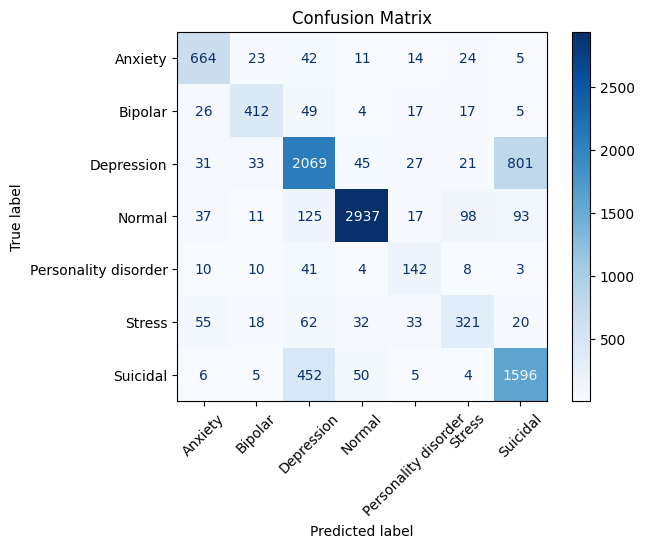

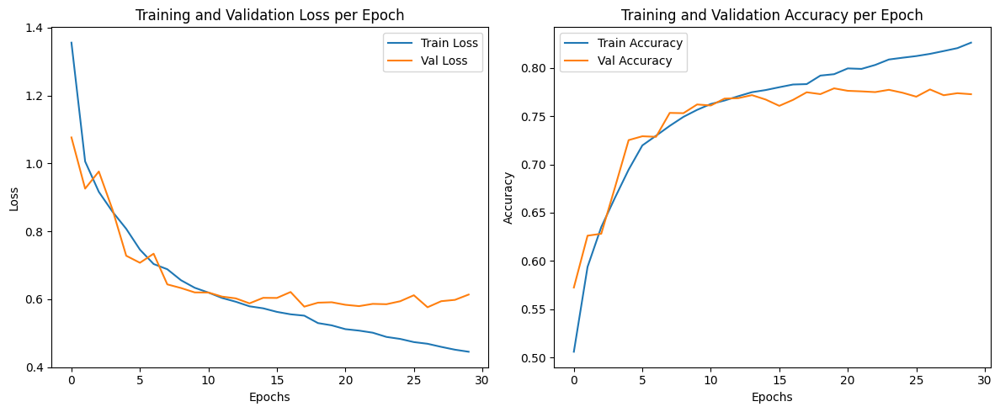

In [ ]:
# 4.  -- evaluate model --
#WITH DROPOUT
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds8,
    all_labels=all_labels8,
    train_losses=train_losses8,
    val_losses=val_losses8,
    train_accuracies=train_accuracies8,
    val_accuracies=val_accuracies8,
    save_name="model_batchnorm"
)

In [ ]:
torch.save(model8.state_dict(), results_path + 'models/model8_dropout_barchnorm_weights.pt')

In [ ]:
# 3.  -- train model without dropout--
model8 = BatchNorm_LSTM(
    embedding_matrix=glove_embedding_matrix,
    hidden_dim=best_hidden_dim,
    output_dim=len(label_encoder.classes_),
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model8.parameters(), lr=best_learning_rate)

model8, train_losses8, val_losses8, train_accuracies8, val_accuracies8, all_preds8, all_labels8 = train_model(
    model=model8,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs= 30
)

Epoch 1/30 | Train Loss: 1.3243 | Val Loss: 1.0571 | Train Acc: 0.5197 | Val Acc: 0.5750 | Time: 1.40s
Epoch 6/30 | Train Loss: 0.6300 | Val Loss: 0.6702 | Train Acc: 0.7502 | Val Acc: 0.7434 | Time: 1.63s
Epoch 11/30 | Train Loss: 0.5486 | Val Loss: 0.6396 | Train Acc: 0.7825 | Val Acc: 0.7423 | Time: 1.36s
Epoch 16/30 | Train Loss: 0.4918 | Val Loss: 0.6073 | Train Acc: 0.8023 | Val Acc: 0.7621 | Time: 1.33s
Epoch 21/30 | Train Loss: 0.4443 | Val Loss: 0.6203 | Train Acc: 0.8221 | Val Acc: 0.7684 | Time: 1.37s
Epoch 26/30 | Train Loss: 0.3995 | Val Loss: 0.6264 | Train Acc: 0.8378 | Val Acc: 0.7705 | Time: 1.34s
Epoch 30/30 | Train Loss: 0.3669 | Val Loss: 0.6655 | Train Acc: 0.8500 | Val Acc: 0.7666 | Time: 1.34s


Maximum accuracy: 0.7727574750830565 obtained at epoch 12
Final accuracy: 0.7665875652586616
Final loss: 0.6655032106910843

Weighted F1-score: 0.7647

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.75      0.84      0.79       783
             Bipolar       0.82      0.66      0.73       530
          Depression       0.73      0.69      0.71      3027
              Normal       0.90      0.94      0.92      3318
Personality disorder       0.64      0.51      0.57       218
              Stress       0.59      0.61      0.60       541
            Suicidal       0.66      0.67      0.66      2118

            accuracy                           0.77     10535
           macro avg       0.73      0.70      0.71     10535
        weighted avg       0.77      0.77      0.76     10535



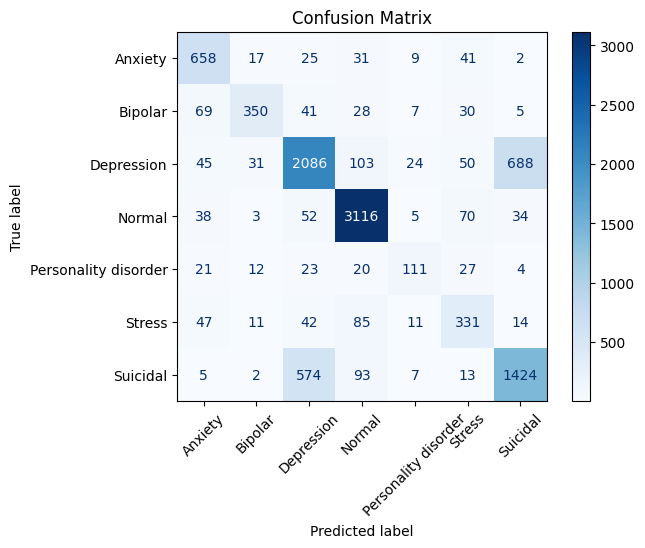

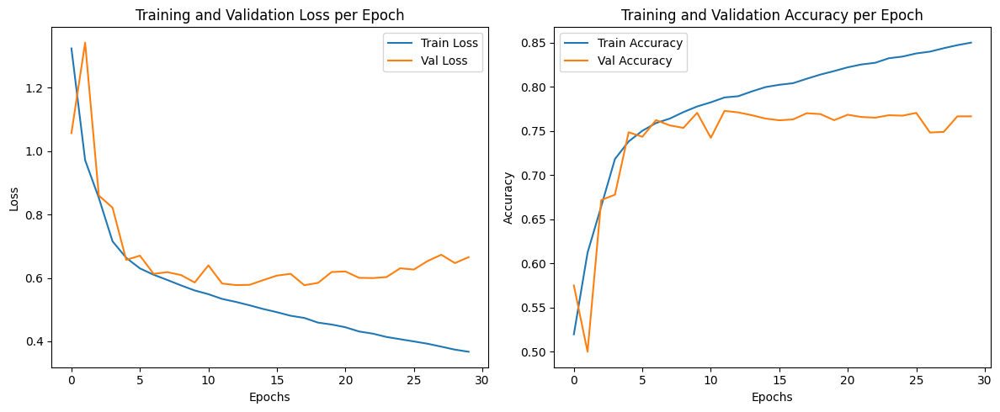

In [ ]:
# 4.  -- evaluate model --
#WITHOUT DROPOUT
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds8,
    all_labels=all_labels8,
    train_losses=train_losses8,
    val_losses=val_losses8,
    train_accuracies=train_accuracies8,
    val_accuracies=val_accuracies8,
    save_name="model_batchnorm"
)

In [ ]:
torch.save(model8.state_dict(), results_path + 'models/model8_barchnorm_weights.pt')

## 9. Model of stacked LSTMs

Try more than one lstm layer

In [ ]:
# 1.  -- new class definition --
class StackedLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, num_layers=2):
        super(StackedLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False # Embeddings are fixed
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output


class Dropout_StackedLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, dropout_value, num_layers=2):
        super(Dropout_StackedLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        dropout_value = dropout_value if num_layers>1 else 0
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers, batch_first=True,
                            dropout = dropout_value)

        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.embedding(x)
        _, (hidden, _) = self.lstm(x)
        output = self.fc(hidden[-1])
        return output

In [ ]:
# 2. -- prepare data --
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)


========== Training StackedLSTM with 1 layers and dropout = False ==========
Epoch 1/30 | Train Loss: 1.3523 | Val Loss: 1.1761 | Train Acc: 0.5130 | Val Acc: 0.5476 | Time: 1.36s
Epoch 6/30 | Train Loss: 0.7266 | Val Loss: 0.7055 | Train Acc: 0.7166 | Val Acc: 0.7284 | Time: 1.27s
Epoch 11/30 | Train Loss: 0.5945 | Val Loss: 0.6245 | Train Acc: 0.7646 | Val Acc: 0.7593 | Time: 1.25s
Epoch 16/30 | Train Loss: 0.5264 | Val Loss: 0.5991 | Train Acc: 0.7925 | Val Acc: 0.7655 | Time: 1.21s
Epoch 21/30 | Train Loss: 0.4816 | Val Loss: 0.5885 | Train Acc: 0.8077 | Val Acc: 0.7736 | Time: 1.24s
Epoch 26/30 | Train Loss: 0.4333 | Val Loss: 0.6051 | Train Acc: 0.8273 | Val Acc: 0.7668 | Time: 1.27s
Epoch 30/30 | Train Loss: 0.4033 | Val Loss: 0.6139 | Train Acc: 0.8394 | Val Acc: 0.7742 | Time: 1.27s
Maximum accuracy: 0.7745609871855719 obtained at epoch 27
Final accuracy: 0.7741813004271476
Final loss: 0.6139081978654287

Weighted F1-score: 0.7730

Classification Report:

                    

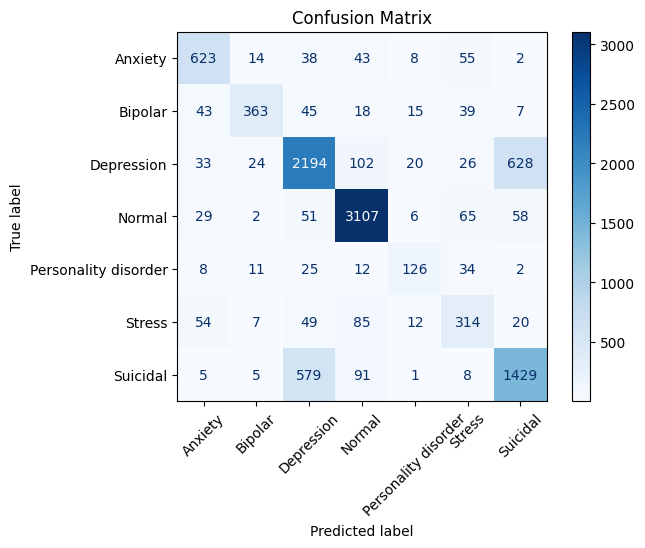

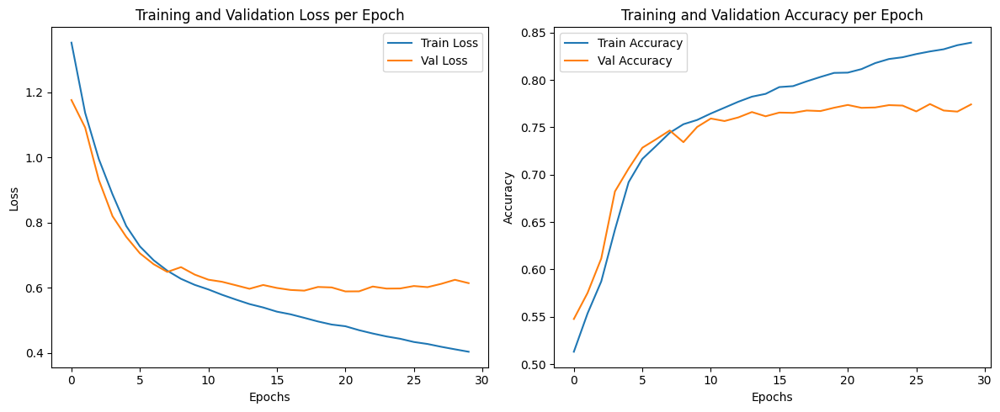


========== Training StackedLSTM with 1 layers and dropout = True ==========
Epoch 1/30 | Train Loss: 1.3523 | Val Loss: 1.1761 | Train Acc: 0.5130 | Val Acc: 0.5476 | Time: 1.35s
Epoch 6/30 | Train Loss: 0.7266 | Val Loss: 0.7055 | Train Acc: 0.7166 | Val Acc: 0.7284 | Time: 1.46s
Epoch 11/30 | Train Loss: 0.5945 | Val Loss: 0.6245 | Train Acc: 0.7646 | Val Acc: 0.7593 | Time: 1.25s
Epoch 16/30 | Train Loss: 0.5264 | Val Loss: 0.5991 | Train Acc: 0.7925 | Val Acc: 0.7655 | Time: 1.34s
Epoch 21/30 | Train Loss: 0.4816 | Val Loss: 0.5885 | Train Acc: 0.8077 | Val Acc: 0.7736 | Time: 1.30s
Epoch 26/30 | Train Loss: 0.4333 | Val Loss: 0.6051 | Train Acc: 0.8273 | Val Acc: 0.7668 | Time: 1.25s
Epoch 30/30 | Train Loss: 0.4033 | Val Loss: 0.6139 | Train Acc: 0.8394 | Val Acc: 0.7742 | Time: 1.24s
Maximum accuracy: 0.7745609871855719 obtained at epoch 27
Final accuracy: 0.7741813004271476
Final loss: 0.6139081978654287

Weighted F1-score: 0.7730

Classification Report:

                     

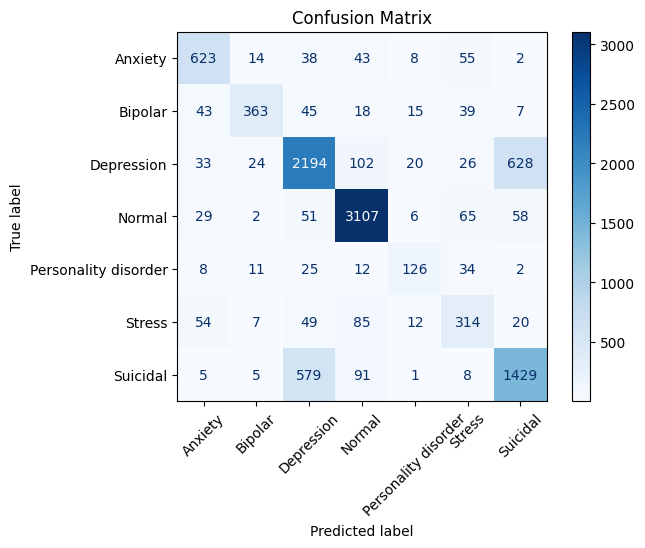

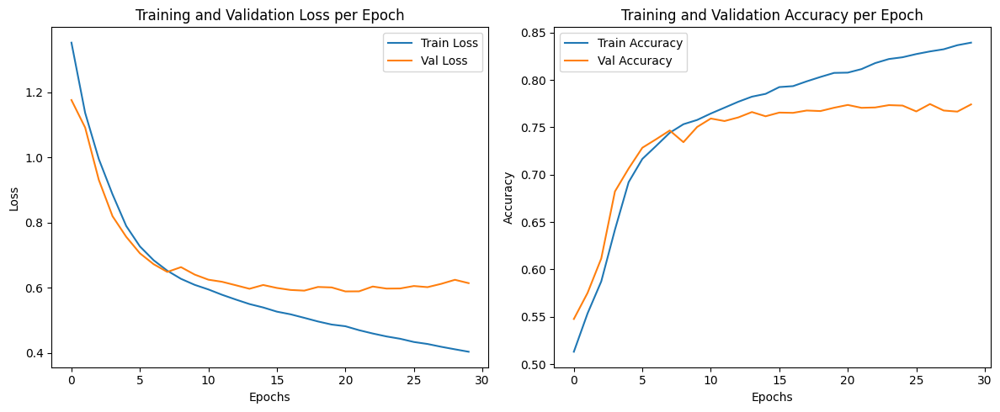


========== Training StackedLSTM with 2 layers and dropout = False ==========
Epoch 1/30 | Train Loss: 1.3343 | Val Loss: 1.1686 | Train Acc: 0.4980 | Val Acc: 0.5411 | Time: 1.71s
Epoch 6/30 | Train Loss: 0.7391 | Val Loss: 0.7361 | Train Acc: 0.7138 | Val Acc: 0.7150 | Time: 1.59s
Epoch 11/30 | Train Loss: 0.6066 | Val Loss: 0.6323 | Train Acc: 0.7618 | Val Acc: 0.7551 | Time: 1.59s
Epoch 16/30 | Train Loss: 0.5375 | Val Loss: 0.5980 | Train Acc: 0.7879 | Val Acc: 0.7664 | Time: 1.87s
Epoch 21/30 | Train Loss: 0.4801 | Val Loss: 0.5740 | Train Acc: 0.8083 | Val Acc: 0.7745 | Time: 1.60s
Epoch 26/30 | Train Loss: 0.4246 | Val Loss: 0.6218 | Train Acc: 0.8299 | Val Acc: 0.7575 | Time: 1.60s
Epoch 30/30 | Train Loss: 0.3894 | Val Loss: 0.6176 | Train Acc: 0.8444 | Val Acc: 0.7695 | Time: 1.80s
Maximum accuracy: 0.7763644992880874 obtained at epoch 20
Final accuracy: 0.76953013763645
Final loss: 0.6176198218242231

Weighted F1-score: 0.7698

Classification Report:

                      

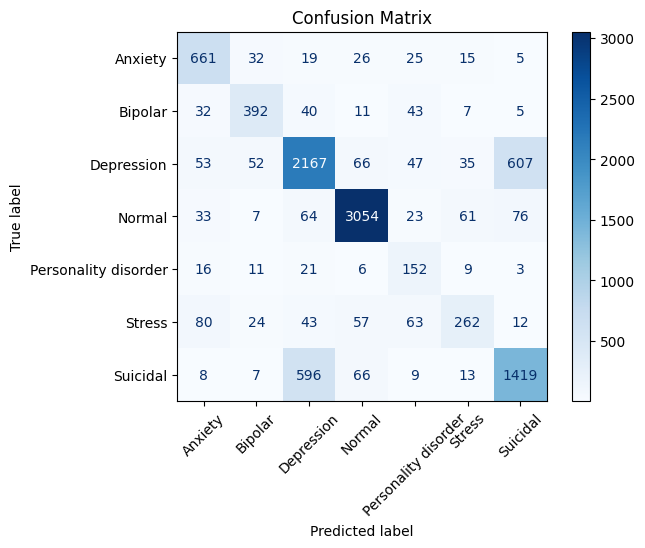

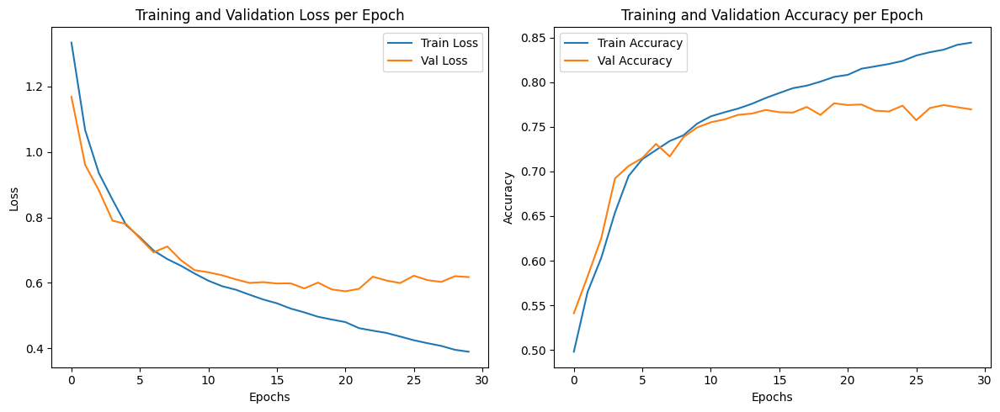


========== Training StackedLSTM with 2 layers and dropout = True ==========
Epoch 1/30 | Train Loss: 1.3117 | Val Loss: 1.1702 | Train Acc: 0.5036 | Val Acc: 0.5447 | Time: 1.84s
Epoch 6/30 | Train Loss: 0.8845 | Val Loss: 0.8455 | Train Acc: 0.6364 | Val Acc: 0.6524 | Time: 1.61s
Epoch 11/30 | Train Loss: 0.7283 | Val Loss: 0.7046 | Train Acc: 0.7123 | Val Acc: 0.7273 | Time: 1.79s
Epoch 16/30 | Train Loss: 0.6263 | Val Loss: 0.6406 | Train Acc: 0.7524 | Val Acc: 0.7455 | Time: 1.64s
Epoch 21/30 | Train Loss: 0.5578 | Val Loss: 0.5927 | Train Acc: 0.7776 | Val Acc: 0.7682 | Time: 1.63s
Epoch 26/30 | Train Loss: 0.5007 | Val Loss: 0.5921 | Train Acc: 0.7986 | Val Acc: 0.7693 | Time: 1.64s
Epoch 30/30 | Train Loss: 0.4643 | Val Loss: 0.5877 | Train Acc: 0.8117 | Val Acc: 0.7778 | Time: 1.62s
Maximum accuracy: 0.7798766018035121 obtained at epoch 28
Final accuracy: 0.7777883246321785
Final loss: 0.5876523726675884

Weighted F1-score: 0.7764

Classification Report:

                     

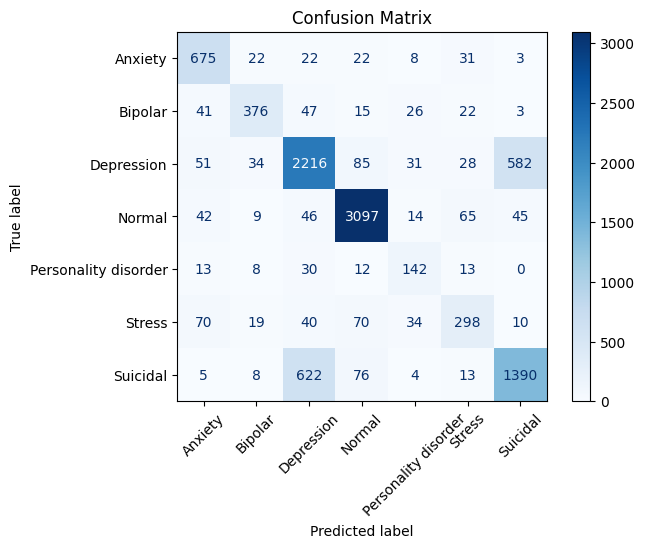

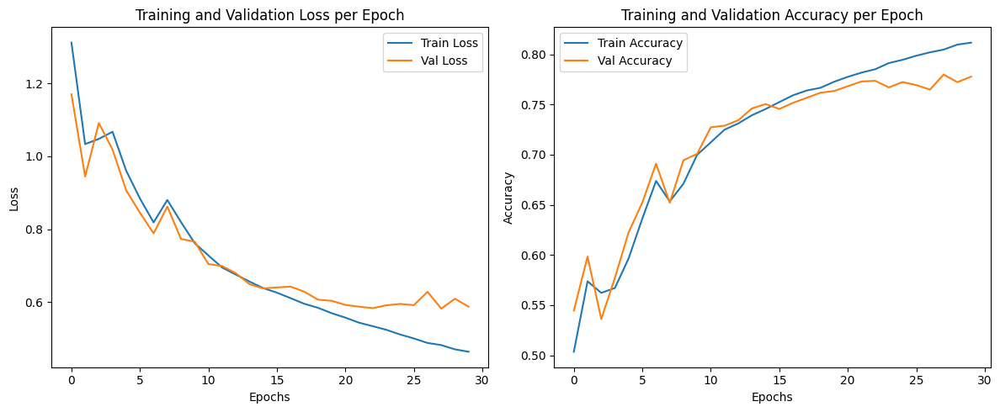


========== Training StackedLSTM with 3 layers and dropout = False ==========
Epoch 1/30 | Train Loss: 1.3191 | Val Loss: 1.2061 | Train Acc: 0.5219 | Val Acc: 0.5472 | Time: 2.11s
Epoch 6/30 | Train Loss: 0.8494 | Val Loss: 0.8181 | Train Acc: 0.6491 | Val Acc: 0.6720 | Time: 2.24s
Epoch 11/30 | Train Loss: 0.6598 | Val Loss: 0.6696 | Train Acc: 0.7392 | Val Acc: 0.7331 | Time: 2.01s
Epoch 16/30 | Train Loss: 0.5630 | Val Loss: 0.6165 | Train Acc: 0.7762 | Val Acc: 0.7627 | Time: 2.03s
Epoch 21/30 | Train Loss: 0.4926 | Val Loss: 0.5858 | Train Acc: 0.8002 | Val Acc: 0.7744 | Time: 2.01s
Epoch 26/30 | Train Loss: 0.4353 | Val Loss: 0.5933 | Train Acc: 0.8234 | Val Acc: 0.7769 | Time: 2.14s
Epoch 30/30 | Train Loss: 0.3918 | Val Loss: 0.6306 | Train Acc: 0.8410 | Val Acc: 0.7789 | Time: 2.01s
Maximum accuracy: 0.7808258186995729 obtained at epoch 22
Final accuracy: 0.7789273849074514
Final loss: 0.6306073985185968

Weighted F1-score: 0.7775

Classification Report:

                    

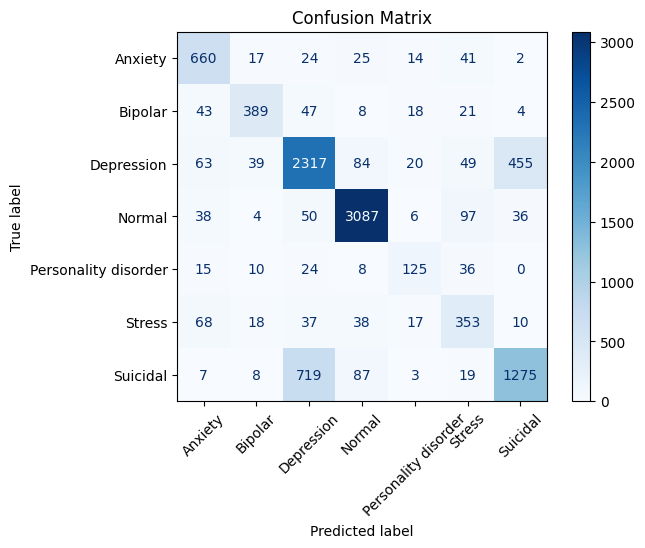

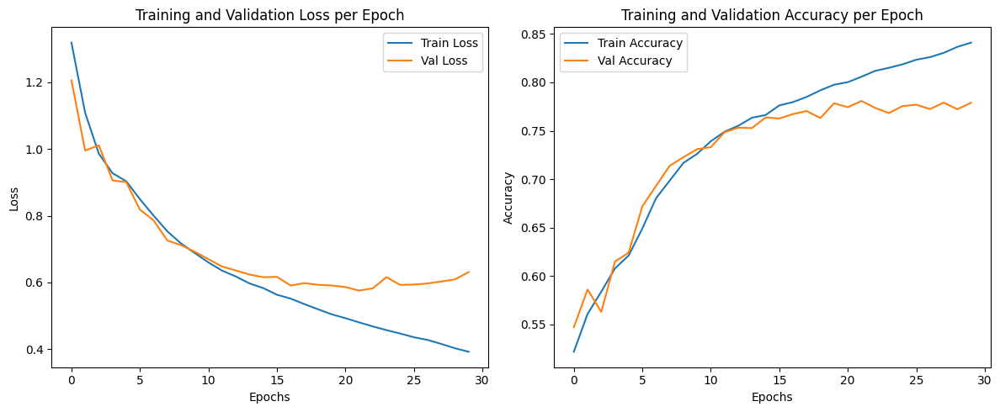


========== Training StackedLSTM with 3 layers and dropout = True ==========
Epoch 1/30 | Train Loss: 1.3592 | Val Loss: 1.2557 | Train Acc: 0.5126 | Val Acc: 0.5372 | Time: 2.18s
Epoch 6/30 | Train Loss: 0.8648 | Val Loss: 0.8655 | Train Acc: 0.6424 | Val Acc: 0.6468 | Time: 2.08s
Epoch 11/30 | Train Loss: 0.6830 | Val Loss: 0.6667 | Train Acc: 0.7304 | Val Acc: 0.7408 | Time: 2.22s
Epoch 16/30 | Train Loss: 0.5968 | Val Loss: 0.6191 | Train Acc: 0.7635 | Val Acc: 0.7604 | Time: 2.31s
Epoch 21/30 | Train Loss: 0.5249 | Val Loss: 0.6032 | Train Acc: 0.7907 | Val Acc: 0.7616 | Time: 2.08s
Epoch 26/30 | Train Loss: 0.4706 | Val Loss: 0.5941 | Train Acc: 0.8127 | Val Acc: 0.7723 | Time: 2.09s
Epoch 30/30 | Train Loss: 0.4306 | Val Loss: 0.6000 | Train Acc: 0.8293 | Val Acc: 0.7799 | Time: 2.09s
Maximum accuracy: 0.7798766018035121 obtained at epoch 30
Final accuracy: 0.7798766018035121
Final loss: 0.5999821496297078

Weighted F1-score: 0.7787

Classification Report:

                     

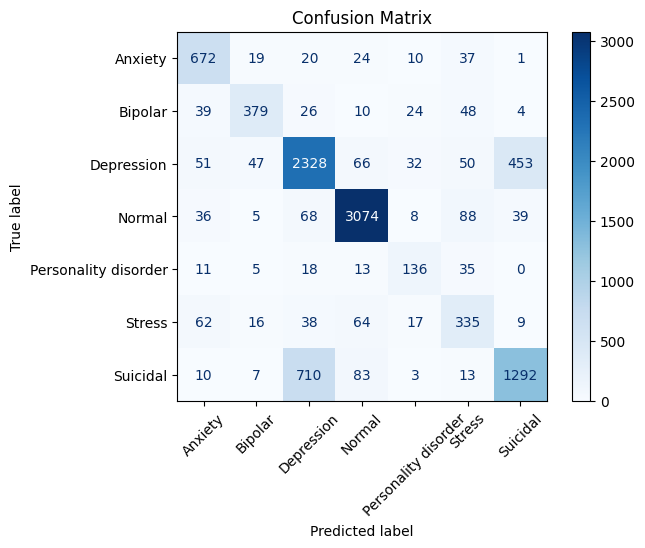

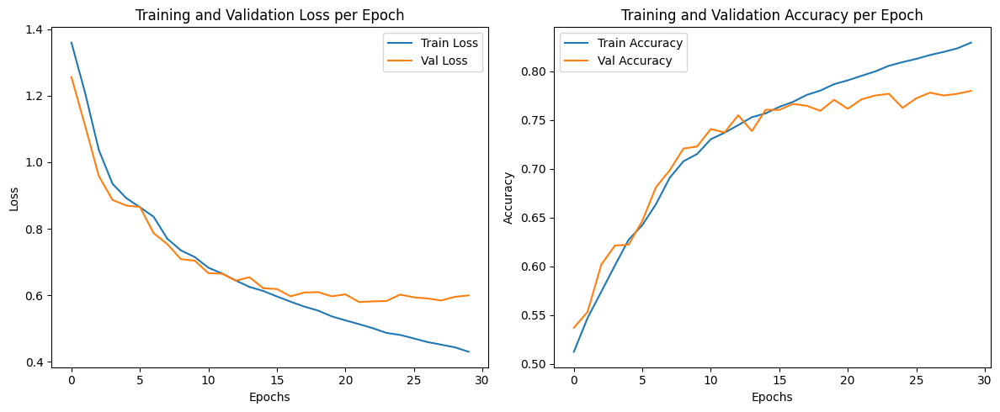


========== Training StackedLSTM with 4 layers and dropout = False ==========
Epoch 1/30 | Train Loss: 1.3260 | Val Loss: 1.2252 | Train Acc: 0.5157 | Val Acc: 0.5471 | Time: 2.67s
Epoch 6/30 | Train Loss: 0.8548 | Val Loss: 0.8202 | Train Acc: 0.6503 | Val Acc: 0.6688 | Time: 2.54s
Epoch 11/30 | Train Loss: 0.6901 | Val Loss: 0.6812 | Train Acc: 0.7246 | Val Acc: 0.7356 | Time: 2.50s
Epoch 16/30 | Train Loss: 0.5776 | Val Loss: 0.6075 | Train Acc: 0.7701 | Val Acc: 0.7598 | Time: 2.49s
Epoch 21/30 | Train Loss: 0.5117 | Val Loss: 0.5931 | Train Acc: 0.7952 | Val Acc: 0.7681 | Time: 2.47s
Epoch 26/30 | Train Loss: 0.4577 | Val Loss: 0.5820 | Train Acc: 0.8193 | Val Acc: 0.7730 | Time: 2.48s
Epoch 30/30 | Train Loss: 0.4201 | Val Loss: 0.6082 | Train Acc: 0.8321 | Val Acc: 0.7690 | Time: 2.48s
Maximum accuracy: 0.7804461319411485 obtained at epoch 27
Final accuracy: 0.7689606074988135
Final loss: 0.6082339135997267

Weighted F1-score: 0.7688

Classification Report:

                    

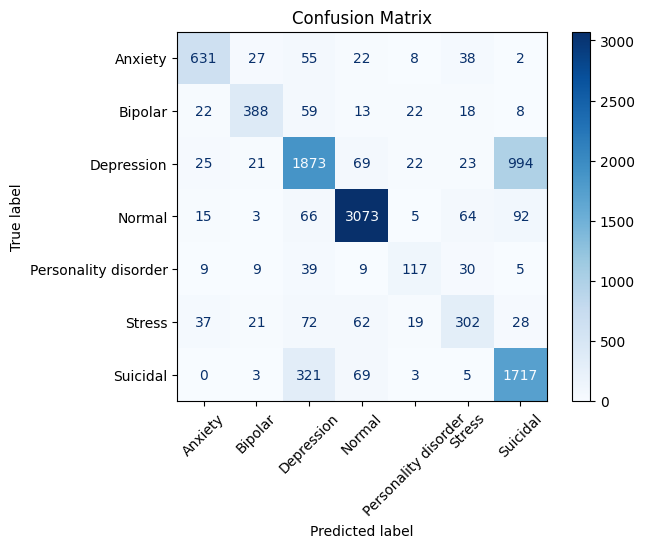

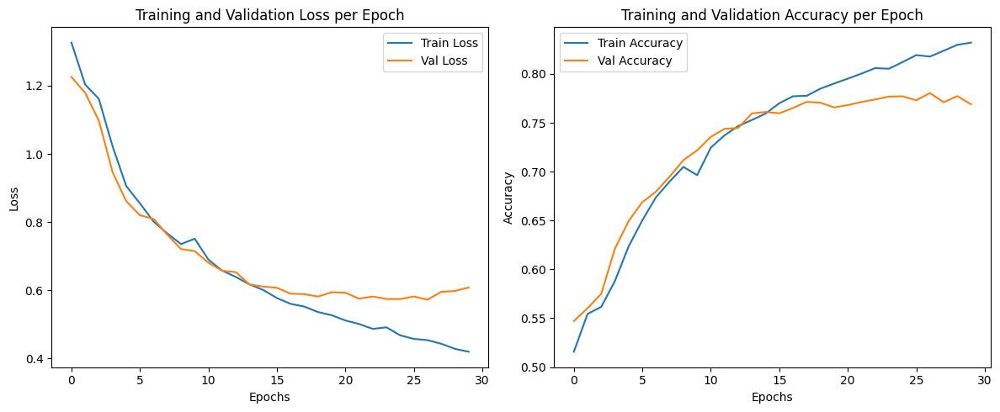


========== Training StackedLSTM with 4 layers and dropout = True ==========
Epoch 1/30 | Train Loss: 1.3495 | Val Loss: 1.2173 | Train Acc: 0.5026 | Val Acc: 0.5506 | Time: 2.67s
Epoch 6/30 | Train Loss: 0.8965 | Val Loss: 0.8477 | Train Acc: 0.6170 | Val Acc: 0.6490 | Time: 2.62s
Epoch 11/30 | Train Loss: 0.6752 | Val Loss: 0.6580 | Train Acc: 0.7339 | Val Acc: 0.7417 | Time: 2.62s
Epoch 16/30 | Train Loss: 0.5865 | Val Loss: 0.6052 | Train Acc: 0.7658 | Val Acc: 0.7644 | Time: 2.60s
Epoch 21/30 | Train Loss: 0.5289 | Val Loss: 0.5916 | Train Acc: 0.7866 | Val Acc: 0.7698 | Time: 2.60s
Epoch 26/30 | Train Loss: 0.4742 | Val Loss: 0.5702 | Train Acc: 0.8098 | Val Acc: 0.7759 | Time: 2.59s
Epoch 30/30 | Train Loss: 0.4392 | Val Loss: 0.5835 | Train Acc: 0.8223 | Val Acc: 0.7789 | Time: 2.70s
Maximum accuracy: 0.7820598006644518 obtained at epoch 23
Final accuracy: 0.7789273849074514
Final loss: 0.5835168300622917

Weighted F1-score: 0.7795

Classification Report:

                     

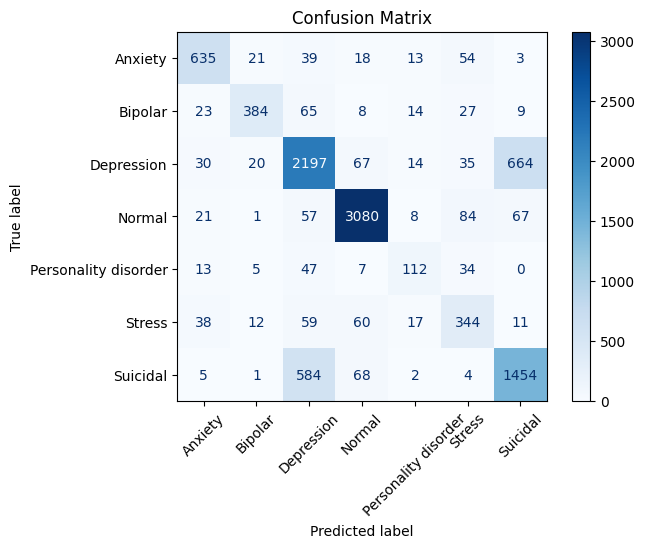

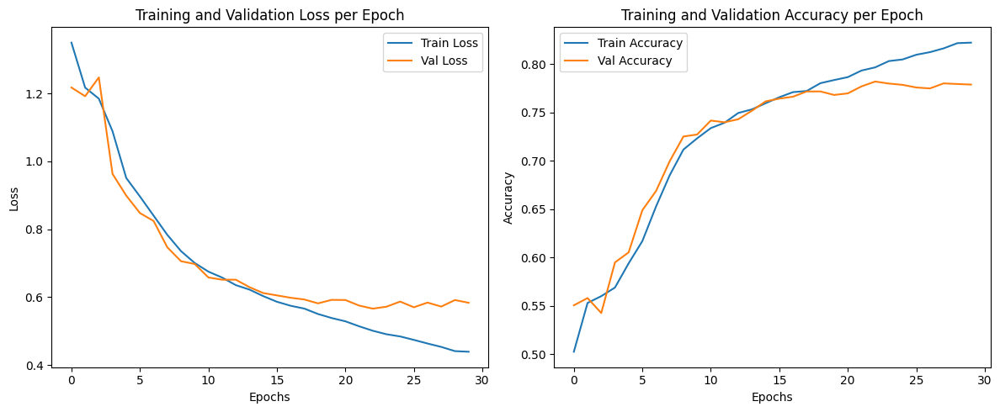


========== Training StackedLSTM with 5 layers and dropout = False ==========
Epoch 1/30 | Train Loss: 1.3333 | Val Loss: 1.2285 | Train Acc: 0.5197 | Val Acc: 0.5471 | Time: 3.21s
Epoch 6/30 | Train Loss: 1.5387 | Val Loss: 1.3020 | Train Acc: 0.3766 | Val Acc: 0.5363 | Time: 3.02s
Epoch 11/30 | Train Loss: 0.9181 | Val Loss: 0.8920 | Train Acc: 0.6164 | Val Acc: 0.6332 | Time: 2.96s
Epoch 16/30 | Train Loss: 0.7121 | Val Loss: 0.7063 | Train Acc: 0.7241 | Val Acc: 0.7282 | Time: 2.95s
Epoch 21/30 | Train Loss: 0.6500 | Val Loss: 0.6616 | Train Acc: 0.7480 | Val Acc: 0.7478 | Time: 2.91s
Epoch 26/30 | Train Loss: 0.5922 | Val Loss: 0.6487 | Train Acc: 0.7673 | Val Acc: 0.7551 | Time: 2.91s
Epoch 30/30 | Train Loss: 0.5566 | Val Loss: 0.6190 | Train Acc: 0.7804 | Val Acc: 0.7597 | Time: 2.90s
Maximum accuracy: 0.7596582819174181 obtained at epoch 30
Final accuracy: 0.7596582819174181
Final loss: 0.6190107500696757

Weighted F1-score: 0.7606

Classification Report:

                    

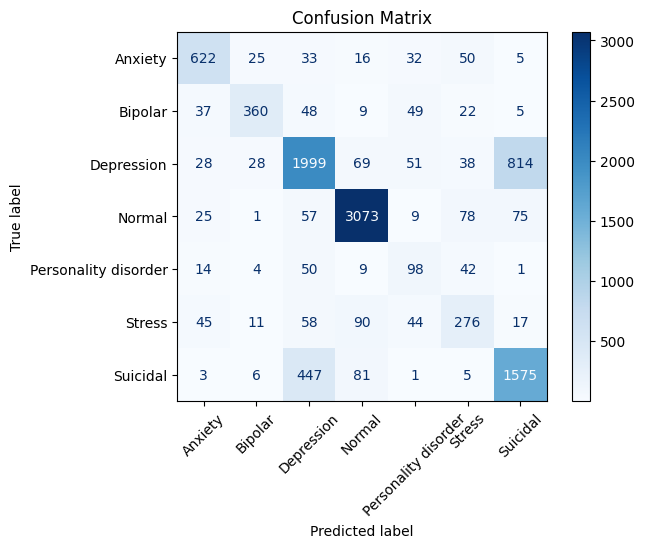

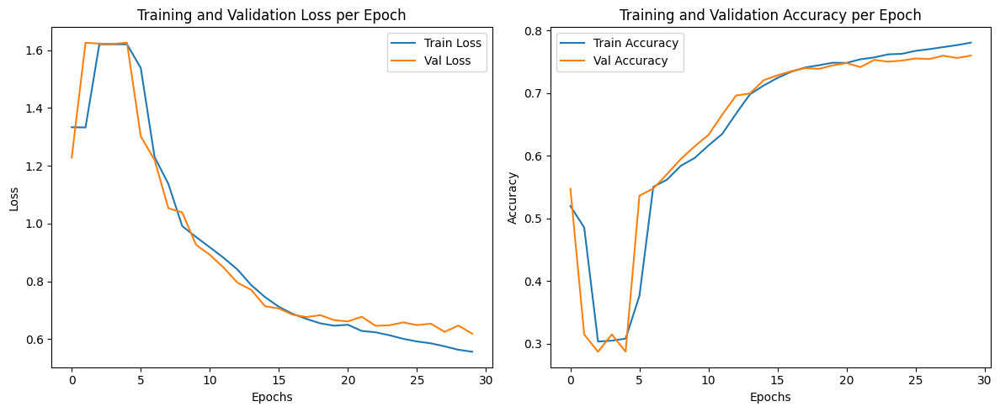


========== Training StackedLSTM with 5 layers and dropout = True ==========
Epoch 1/30 | Train Loss: 1.3319 | Val Loss: 1.2398 | Train Acc: 0.5175 | Val Acc: 0.5460 | Time: 3.16s
Epoch 6/30 | Train Loss: 0.9700 | Val Loss: 0.9220 | Train Acc: 0.5911 | Val Acc: 0.6084 | Time: 3.11s
Epoch 11/30 | Train Loss: 0.7911 | Val Loss: 0.7799 | Train Acc: 0.6792 | Val Acc: 0.6850 | Time: 3.13s
Epoch 16/30 | Train Loss: 0.6900 | Val Loss: 0.6953 | Train Acc: 0.7191 | Val Acc: 0.7201 | Time: 3.37s
Epoch 21/30 | Train Loss: 0.6227 | Val Loss: 0.6388 | Train Acc: 0.7469 | Val Acc: 0.7408 | Time: 3.14s
Epoch 26/30 | Train Loss: 0.5704 | Val Loss: 0.6059 | Train Acc: 0.7700 | Val Acc: 0.7599 | Time: 3.08s
Epoch 30/30 | Train Loss: 0.5375 | Val Loss: 0.5901 | Train Acc: 0.7834 | Val Acc: 0.7680 | Time: 3.12s
Maximum accuracy: 0.7680113906027527 obtained at epoch 30
Final accuracy: 0.7680113906027527
Final loss: 0.590072114065469

Weighted F1-score: 0.7691

Classification Report:

                      

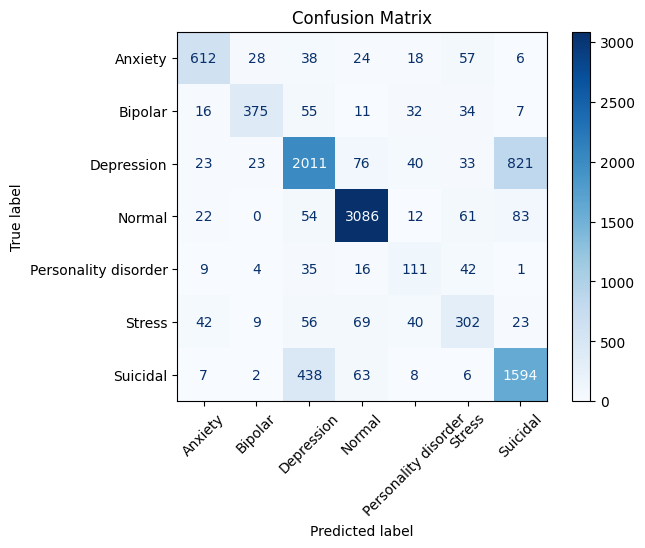

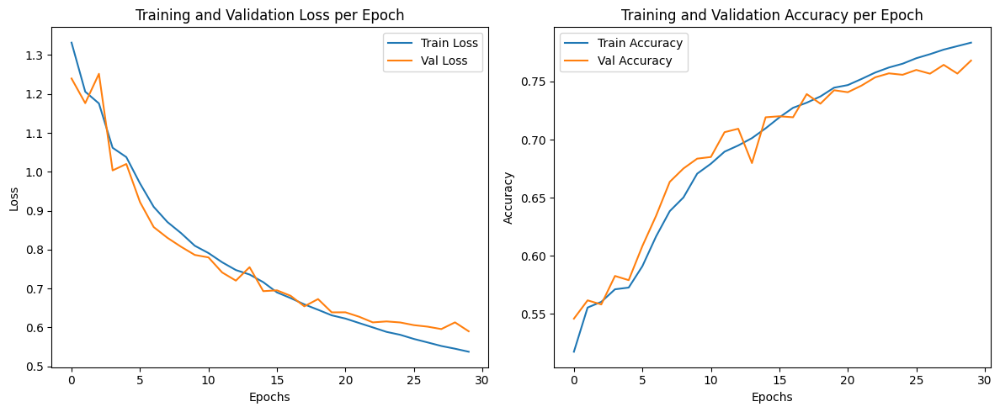

In [ ]:
# 2. --- Apply stacked LSTM ranging from 1 to 5 layers ---
results_layers = []

for num_layers in range(1, 6):
  for dropout_flag in [False, True]:
      torch.manual_seed(42)
      np.random.seed(42)
      random.seed(42)
      print(f"\n========== Training StackedLSTM with {num_layers} layers and dropout = {dropout_flag} ==========")

      if dropout_flag==False:
          model_stacked = StackedLSTM(
                embedding_matrix=glove_embedding_matrix,
                hidden_dim=best_hidden_dim,
                output_dim=len(label_encoder.classes_),
                num_layers=num_layers
          )
      else:
          model_stacked = Dropout_StackedLSTM(
              embedding_matrix=glove_embedding_matrix,
              hidden_dim=best_hidden_dim,
              output_dim=len(label_encoder.classes_),
              dropout_value=best_dropout_value,
              num_layers=num_layers
          )

      loss_function = nn.CrossEntropyLoss()
      optimizer = torch.optim.Adam(model_stacked.parameters(), lr=best_learning_rate)

      model_stacked, train_losses, val_losses, train_accuracies, val_accuracies, all_preds, all_labels = train_model(
          model=model_stacked,
          train_loader=train_loader,
          test_loader=test_loader,
          loss_function=loss_function,
          optimizer=optimizer,
          num_epochs=30
      )

      name = f"stackLSTM_layers/stacked_lstm_glove_{num_layers}layers_dropout{dropout_flag}"

      evaluate_model(
          label_encoder=label_encoder,
          all_preds=all_preds,
          all_labels=all_labels,
          train_losses=train_losses,
          val_losses=val_losses,
          train_accuracies=train_accuracies,
          val_accuracies=val_accuracies,
          save_name=name
      )

      results_layers.append({
          "num_layers": num_layers,
          "dropout": dropout_flag,
          "max_val_acc": max(val_accuracies),
          "final_val_acc": val_accuracies[-1],
          "min_val_loss": min(val_losses),
          "final_val_loss": val_losses[-1]
      })

      torch.save(model_stacked.state_dict(), results_path + name + "_weights.pt")

In [ ]:
# Print summary
print("\n=== STACKED LSTM SUMMARY ===")
for res in results_layers:
    print(f"Layers: {res['num_layers']} | Dropout: {res['dropout']} | Max Val Acc: {res['max_val_acc']:.4f} | Final Val Acc: {res['final_val_acc']:.4f} | Min Val Loss: {res['min_val_loss']:.4f} | Final Val Loss: {res['final_val_loss']:.4f}")


=== STACKED LSTM SUMMARY ===
Layers: 1 | Dropout: False | Max Val Acc: 0.7746 | Final Val Acc: 0.7742 | Min Val Loss: 0.5885 | Final Val Loss: 0.6139
Layers: 1 | Dropout: True | Max Val Acc: 0.7746 | Final Val Acc: 0.7742 | Min Val Loss: 0.5885 | Final Val Loss: 0.6139
Layers: 2 | Dropout: False | Max Val Acc: 0.7764 | Final Val Acc: 0.7695 | Min Val Loss: 0.5740 | Final Val Loss: 0.6176
Layers: 2 | Dropout: True | Max Val Acc: 0.7799 | Final Val Acc: 0.7778 | Min Val Loss: 0.5824 | Final Val Loss: 0.5877
Layers: 3 | Dropout: False | Max Val Acc: 0.7808 | Final Val Acc: 0.7789 | Min Val Loss: 0.5753 | Final Val Loss: 0.6306
Layers: 3 | Dropout: True | Max Val Acc: 0.7799 | Final Val Acc: 0.7799 | Min Val Loss: 0.5799 | Final Val Loss: 0.6000
Layers: 4 | Dropout: False | Max Val Acc: 0.7804 | Final Val Acc: 0.7690 | Min Val Loss: 0.5727 | Final Val Loss: 0.6082
Layers: 4 | Dropout: True | Max Val Acc: 0.7821 | Final Val Acc: 0.7789 | Min Val Loss: 0.5662 | Final Val Loss: 0.5835
Layers

In [ ]:
#best ones
stacked_lstm_df = pd.DataFrame(results_layers)
stacked_lstm_df.to_csv(results_path + 'stackLSTM_layers/stacked_lstm_df.csv', index=False)

stacked_lstm_df = stacked_lstm_df.sort_values("final_val_loss", ascending=True).reset_index(drop=True)

print("Top Hyperparameter Combinations:")
display(stacked_lstm_df.head())

Top Hyperparameter Combinations:


,num_layers,dropout,max_val_acc,final_val_acc,min_val_loss,final_val_loss
0,4,True,0.782060,0.778927,0.566175,0.583517
1,2,True,0.779877,0.777788,0.582395,0.587652
2,5,True,0.768011,0.768011,0.590072,0.590072
3,3,True,0.779877,0.779877,0.579942,0.599982
4,4,False,0.780446,0.768961,0.572668,0.608234


In [ ]:
# Conclusion: 4 layers improve performance!
# Right now --> dropout + 4 layers is the best one!

## 10. Model after attention mechanisms

Apply attention mechanisms. The model will learn to focus on the most relevant words in the sentence.

The attention layer will be added after the LSTM layer, and it will output a weighted sum of the LSTM outputs.

In [ ]:
# 1.  -- new class definition --

class Attention(nn.Module):
    def __init__(self, hidden_dim):
        super(Attention, self).__init__()
        self.attention = nn.Linear(hidden_dim, 1)

    def forward(self, lstm_output):
        # lstm_output shape: (batch_size, seq_len, hidden_dim)
        attn_scores = self.attention(lstm_output).squeeze(-1) # (batch_size, seq_len)
        attn_weights = torch.softmax(attn_scores, dim=1) # (batch_size, seq_len)
        # weighted sum of lstm_output
        context_vector = torch.sum(lstm_output * attn_weights.unsqueeze(-1), dim=1) # (batch_size, hidden_dim)
        return context_vector, attn_weights

class Dropout_AttentionLSTM(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, dropout_value, num_layers=2):
        super(Dropout_AttentionLSTM, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False  # Embeddings are fixed
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers=num_layers, batch_first=True,
                            dropout = dropout_value)#
        self.attention = Attention(hidden_dim)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.embedding(x)
        lstm_output, _ = self.lstm(x)  # lstm_output shape: (batch_size, seq_len, hidden_dim)
        context_vector, attn_weights = self.attention(lstm_output)  # context_vector shape: (batch_size, hidden_dim)
        output = self.fc(context_vector)  # output shape: (batch_size, output_dim)
        return output

In [ ]:
# 2.  -- prepare dataset --
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer,
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=best_batch_size, #use best batch size
    random_state=RANDOM_STATE
)

In [ ]:
# 3.  -- Train AttentionLSTM model with best found LSTM layers --
model_attention_dropout = Dropout_AttentionLSTM(
    embedding_matrix=glove_embedding_matrix,
    hidden_dim=best_hidden_dim,
    output_dim=len(label_encoder.classes_),
    dropout_value=best_dropout_value,
    num_layers=best_num_layers
)

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_attention_dropout.parameters(), lr=best_learning_rate)

model_attention_dropout, train_losses10, val_losses10, train_accuracies10, val_accuracies10, all_preds10, all_labels10 = train_model(
    model=model_attention_dropout,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

Epoch 1/30 | Train Loss: 1.2106 | Val Loss: 0.9626 | Train Acc: 0.5354 | Val Acc: 0.6036 | Time: 2.94s
Epoch 6/30 | Train Loss: 0.6566 | Val Loss: 0.6467 | Train Acc: 0.7387 | Val Acc: 0.7463 | Time: 4.10s
Epoch 11/30 | Train Loss: 0.5580 | Val Loss: 0.6047 | Train Acc: 0.7776 | Val Acc: 0.7676 | Time: 2.72s
Epoch 16/30 | Train Loss: 0.4970 | Val Loss: 0.5889 | Train Acc: 0.8017 | Val Acc: 0.7735 | Time: 2.75s
Epoch 21/30 | Train Loss: 0.4575 | Val Loss: 0.5990 | Train Acc: 0.8160 | Val Acc: 0.7752 | Time: 2.74s
Epoch 26/30 | Train Loss: 0.4029 | Val Loss: 0.6198 | Train Acc: 0.8380 | Val Acc: 0.7802 | Time: 2.71s
Epoch 30/30 | Train Loss: 0.3720 | Val Loss: 0.6420 | Train Acc: 0.8504 | Val Acc: 0.7715 | Time: 2.71s


Maximum accuracy: 0.7804461319411485 obtained at epoch 25
Final accuracy: 0.7715234931181775
Final loss: 0.642033958291433

Weighted F1-score: 0.7732

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81      0.81      0.81       783
             Bipolar       0.90      0.66      0.76       530
          Depression       0.76      0.66      0.71      3027
              Normal       0.92      0.92      0.92      3318
Personality disorder       0.67      0.56      0.61       218
              Stress       0.52      0.68      0.59       541
            Suicidal       0.63      0.76      0.69      2118

            accuracy                           0.77     10535
           macro avg       0.75      0.72      0.73     10535
        weighted avg       0.78      0.77      0.77     10535



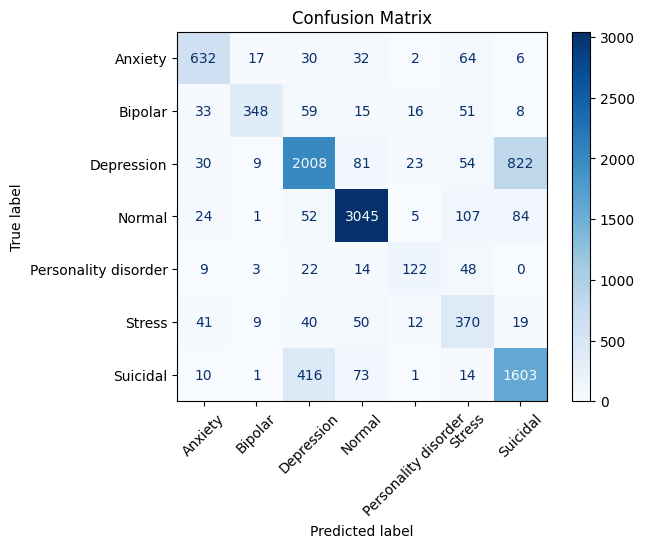

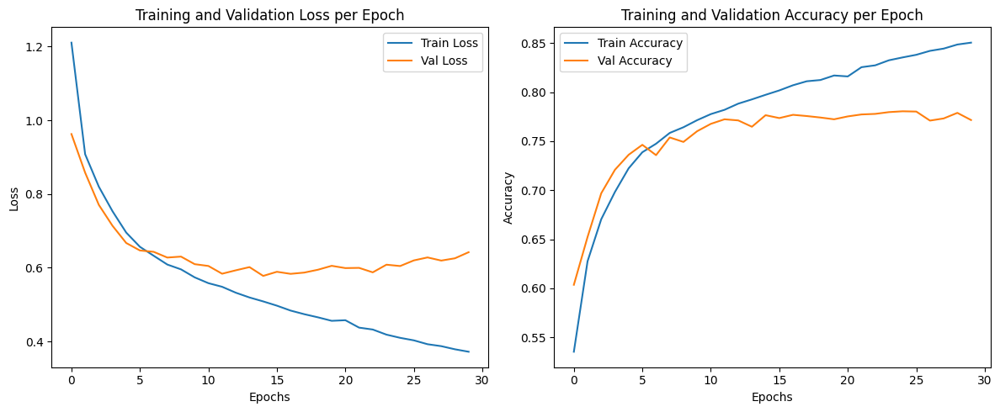

In [ ]:
# 4.  -- Evaluate model --
evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds10,
    all_labels=all_labels10,
    train_losses=train_losses10,
    val_losses=val_losses10,
    train_accuracies=train_accuracies10,
    val_accuracies=val_accuracies10,
    save_name="model_attention_dropout"
)

In [ ]:
torch.save(model_attention_dropout.state_dict(), results_path + 'models/model10_dropout_attention_weights.pt')

In [ ]:
#does not improve accuracy

## 11. Model using GRU instead of LSTM

Epoch 1/30 | Train Loss: 1.1305 | Val Loss: 0.9310 | Train Acc: 0.5591 | Val Acc: 0.6226 | Time: 3.52s
Epoch 6/30 | Train Loss: 0.4739 | Val Loss: 0.6168 | Train Acc: 0.8150 | Val Acc: 0.7593 | Time: 2.05s
Epoch 11/30 | Train Loss: 0.2749 | Val Loss: 0.7122 | Train Acc: 0.8965 | Val Acc: 0.7640 | Time: 2.04s
Epoch 16/30 | Train Loss: 0.1422 | Val Loss: 1.0214 | Train Acc: 0.9531 | Val Acc: 0.7461 | Time: 2.03s
Epoch 21/30 | Train Loss: 0.0737 | Val Loss: 1.2457 | Train Acc: 0.9786 | Val Acc: 0.7475 | Time: 2.11s
Epoch 26/30 | Train Loss: 0.0497 | Val Loss: 1.4871 | Train Acc: 0.9860 | Val Acc: 0.7410 | Time: 2.71s
Epoch 30/30 | Train Loss: 0.0381 | Val Loss: 1.5811 | Train Acc: 0.9894 | Val Acc: 0.7382 | Time: 2.03s
Maximum accuracy: 0.7639745658156971 obtained at epoch 11
Final accuracy: 0.738160766821676
Final loss: 1.5811187610481725

Weighted F1-score: 0.7386

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.82     

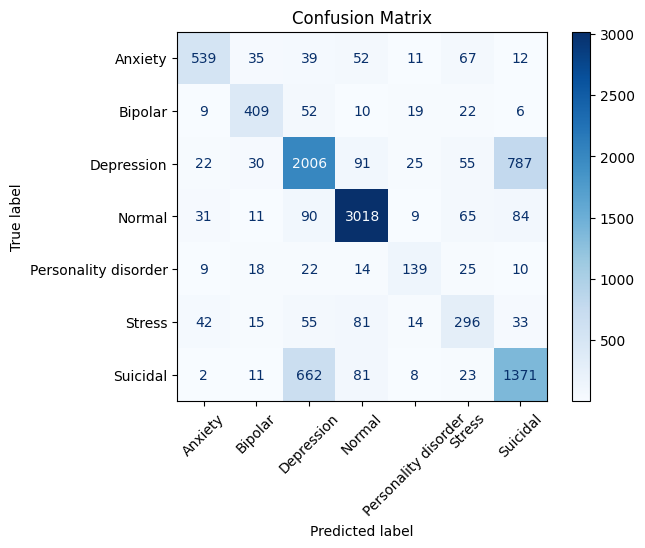

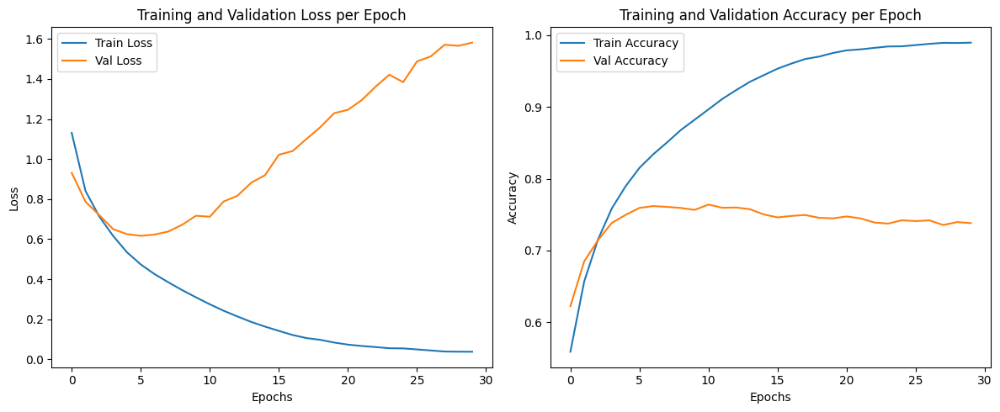

In [ ]:
# 11. Model after GRU (baseline style)
class BaselineGRU(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super(BaselineGRU, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.gru = nn.GRU(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        _, hidden = self.gru(x)
        output = self.fc(hidden[-1])
        return output

# -- Entrenamiento y evaluación igual que el baseline LSTM --
model_gru = BaselineGRU(
    vocab_size=MAX_VOCAB_SIZE,
    embedding_dim=64,
    hidden_dim=64,
    output_dim=len(label_encoder.classes_)
)
loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_gru.parameters(), lr=0.001)

model_gru, train_losses_gru, val_losses_gru, train_accuracies_gru, val_accuracies_gru, all_preds_gru, all_labels_gru = train_model(
    model=model_gru,
    train_loader=train_loader,
    test_loader=test_loader,
    loss_function=loss_function,
    optimizer=optimizer,
    num_epochs=30
)

evaluate_model(
    label_encoder=label_encoder,
    all_preds=all_preds_gru,
    all_labels=all_labels_gru,
    train_losses=train_losses_gru,
    val_losses=val_losses_gru,
    train_accuracies=train_accuracies_gru,
    val_accuracies=val_accuracies_gru,
    save_name="baseline_gru"
)

torch.save(model_gru.state_dict(), results_path + 'models/model_baseline_gru_weights.pt')

## 12. Improved GRU

In [ ]:
class Attention(nn.Module):
    def __init__(self, hidden_dim):
        super(Attention, self).__init__()
        self.attention = nn.Linear(hidden_dim, 1)
    def forward(self, rnn_output):
        attn_scores = self.attention(rnn_output).squeeze(-1)
        attn_weights = torch.softmax(attn_scores, dim=1)
        context_vector = torch.sum(rnn_output * attn_weights.unsqueeze(-1), dim=1)
        return context_vector, attn_weights

class ImprovedGRU(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, output_dim, dropout_value, num_layers=3):
        super(ImprovedGRU, self).__init__()
        num_embeddings, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        self.embedding.weight.data.copy_(torch.from_numpy(embedding_matrix))
        self.embedding.weight.requires_grad = False
        self.gru = nn.GRU(embedding_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_value)
        self.attention = Attention(hidden_dim)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = self.embedding(x)
        gru_output, _ = self.gru(x)
        context_vector, attn_weights = self.attention(gru_output)
        output = self.fc(context_vector)
        return output

Loaded 400000 word vectors from GloVe.

=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=64, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.9042 | Val Loss: 0.6650 | Train Acc: 0.6606 | Val Acc: 0.7486 | Time: 2.82s
Epoch 6/30 | Train Loss: 0.4884 | Val Loss: 0.5341 | Train Acc: 0.8050 | Val Acc: 0.7894 | Time: 2.31s
Epoch 11/30 | Train Loss: 0.3865 | Val Loss: 0.5759 | Train Acc: 0.8445 | Val Acc: 0.7813 | Time: 2.24s
Epoch 16/30 | Train Loss: 0.3123 | Val Loss: 0.6308 | Train Acc: 0.8741 | Val Acc: 0.7784 | Time: 2.22s
Epoch 21/30 | Train Loss: 0.2553 | Val Loss: 0.7258 | Train Acc: 0.8985 | Val Acc: 0.7738 | Time: 2.22s
Epoch 26/30 | Train Loss: 0.2079 | Val Loss: 0.8472 | Train Acc: 0.9179 | Val Acc: 0.7698 | Time: 2.22s
Epoch 30/30 | Train Loss: 0.1821 | Val Loss: 0.9015 | Train Acc: 0.9290 | Val Acc: 0.7681 | Time: 2.26s
Maximum accuracy: 0.7906027527289986 obtained at epoch 12
Final accuracy: 0.7681063122923588
Final loss: 0.9014909101255012

Weighted F1-score: 0.7671

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81    

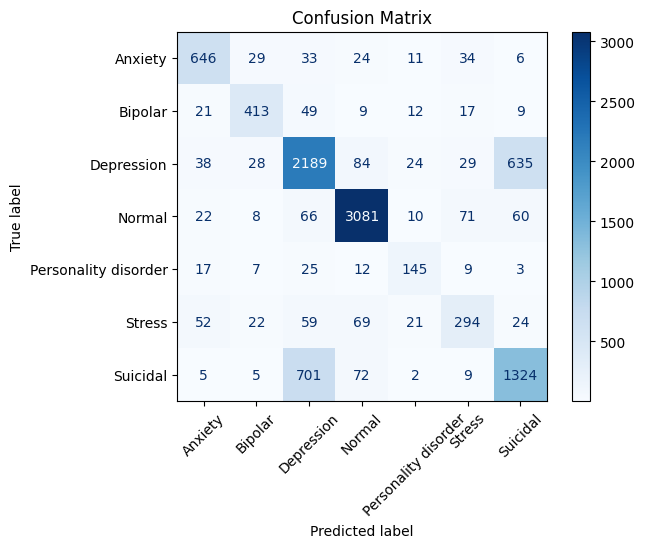

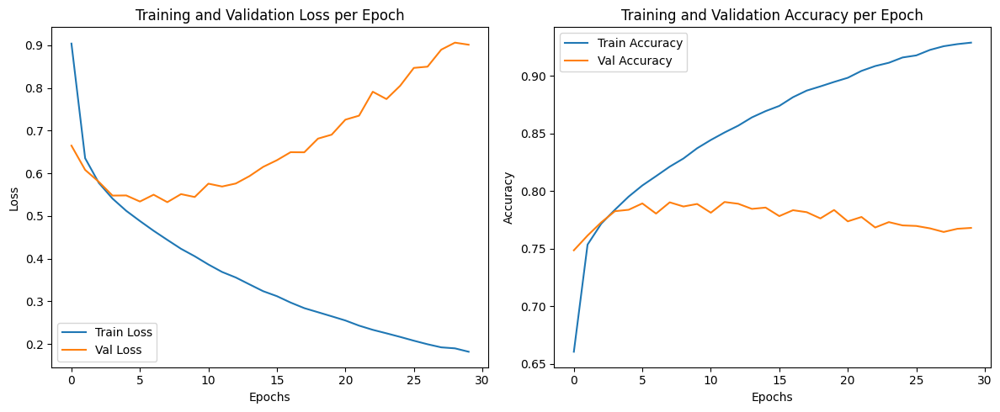


=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=64, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.8998 | Val Loss: 0.6674 | Train Acc: 0.6527 | Val Acc: 0.7406 | Time: 2.85s
Epoch 6/30 | Train Loss: 0.4819 | Val Loss: 0.5337 | Train Acc: 0.8071 | Val Acc: 0.7879 | Time: 2.72s
Epoch 11/30 | Train Loss: 0.3797 | Val Loss: 0.5767 | Train Acc: 0.8475 | Val Acc: 0.7826 | Time: 2.61s
Epoch 16/30 | Train Loss: 0.3053 | Val Loss: 0.6674 | Train Acc: 0.8757 | Val Acc: 0.7751 | Time: 2.53s
Epoch 21/30 | Train Loss: 0.2556 | Val Loss: 0.7400 | Train Acc: 0.8976 | Val Acc: 0.7766 | Time: 2.48s
Epoch 26/30 | Train Loss: 0.2077 | Val Loss: 0.8905 | Train Acc: 0.9191 | Val Acc: 0.7669 | Time: 2.51s
Epoch 30/30 | Train Loss: 0.1806 | Val Loss: 0.9749 | Train Acc: 0.9308 | Val Acc: 0.7676 | Time: 2.95s
Maximum accuracy: 0.7902230659705742 obtained at epoch 7
Final accuracy: 0.7676317038443284
Final loss: 0.974867628921162

Weighted F1-score: 0.7660

Classification Report:

                      prec

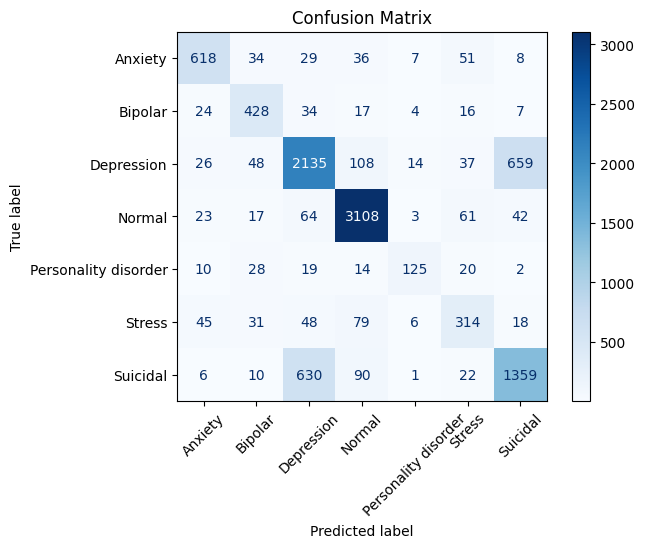

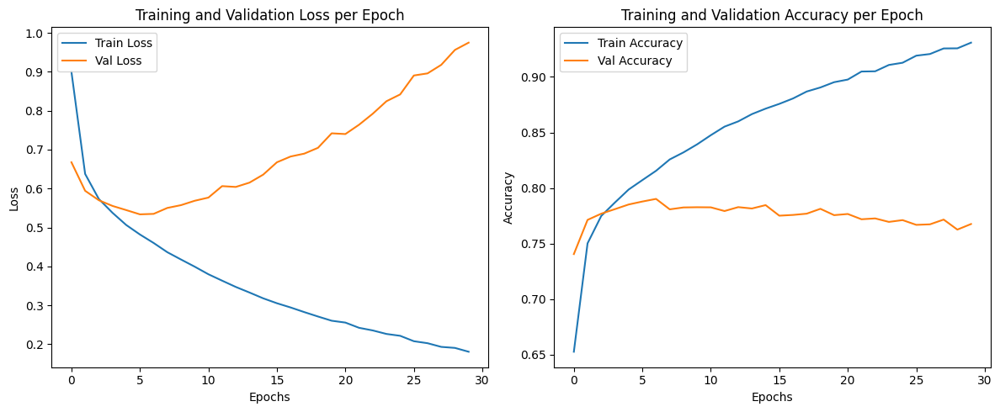


=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=64, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.9312 | Val Loss: 0.7114 | Train Acc: 0.6317 | Val Acc: 0.7234 | Time: 2.84s
Epoch 6/30 | Train Loss: 0.4986 | Val Loss: 0.5551 | Train Acc: 0.8003 | Val Acc: 0.7775 | Time: 2.78s
Epoch 11/30 | Train Loss: 0.3997 | Val Loss: 0.5909 | Train Acc: 0.8383 | Val Acc: 0.7841 | Time: 2.83s
Epoch 16/30 | Train Loss: 0.3281 | Val Loss: 0.6683 | Train Acc: 0.8688 | Val Acc: 0.7803 | Time: 2.82s
Epoch 21/30 | Train Loss: 0.2710 | Val Loss: 0.7331 | Train Acc: 0.8929 | Val Acc: 0.7748 | Time: 3.34s
Epoch 26/30 | Train Loss: 0.2285 | Val Loss: 0.8255 | Train Acc: 0.9111 | Val Acc: 0.7715 | Time: 3.42s
Epoch 30/30 | Train Loss: 0.1998 | Val Loss: 0.9263 | Train Acc: 0.9232 | Val Acc: 0.7715 | Time: 3.50s
Maximum accuracy: 0.7869008068343617 obtained at epoch 13
Final accuracy: 0.7715234931181775
Final loss: 0.9263445462241318

Weighted F1-score: 0.7677

Classification Report:

                      pr

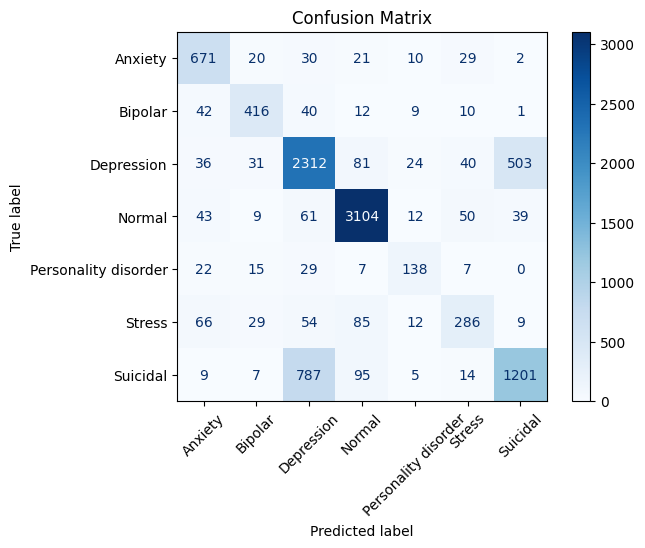

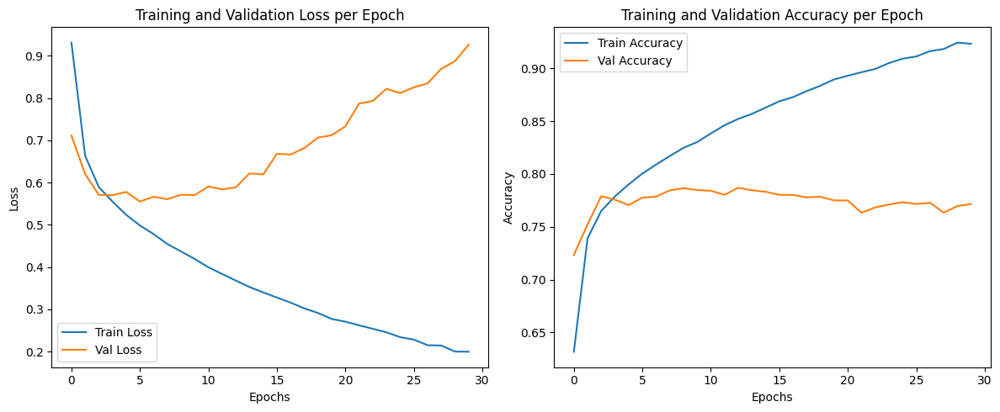


=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=128, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.8537 | Val Loss: 0.6569 | Train Acc: 0.6745 | Val Acc: 0.7414 | Time: 2.65s
Epoch 6/30 | Train Loss: 0.4380 | Val Loss: 0.5333 | Train Acc: 0.8229 | Val Acc: 0.7871 | Time: 2.57s
Epoch 11/30 | Train Loss: 0.2804 | Val Loss: 0.6264 | Train Acc: 0.8865 | Val Acc: 0.7824 | Time: 2.64s
Epoch 16/30 | Train Loss: 0.1660 | Val Loss: 0.8305 | Train Acc: 0.9366 | Val Acc: 0.7706 | Time: 2.62s
Epoch 21/30 | Train Loss: 0.0894 | Val Loss: 1.1336 | Train Acc: 0.9701 | Val Acc: 0.7654 | Time: 2.59s
Epoch 26/30 | Train Loss: 0.0589 | Val Loss: 1.3343 | Train Acc: 0.9813 | Val Acc: 0.7629 | Time: 2.58s
Epoch 30/30 | Train Loss: 0.0472 | Val Loss: 1.4128 | Train Acc: 0.9857 | Val Acc: 0.7641 | Time: 2.54s
Maximum accuracy: 0.7926910299003322 obtained at epoch 5
Final accuracy: 0.7641196013289037
Final loss: 1.4127692392378142

Weighted F1-score: 0.7628

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81     

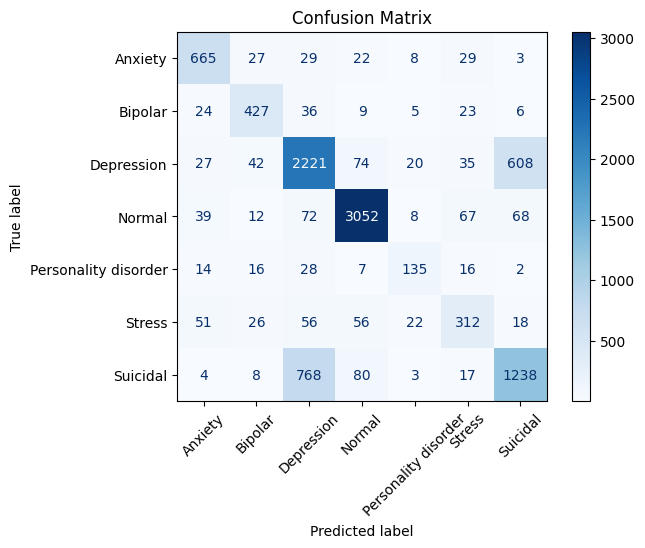

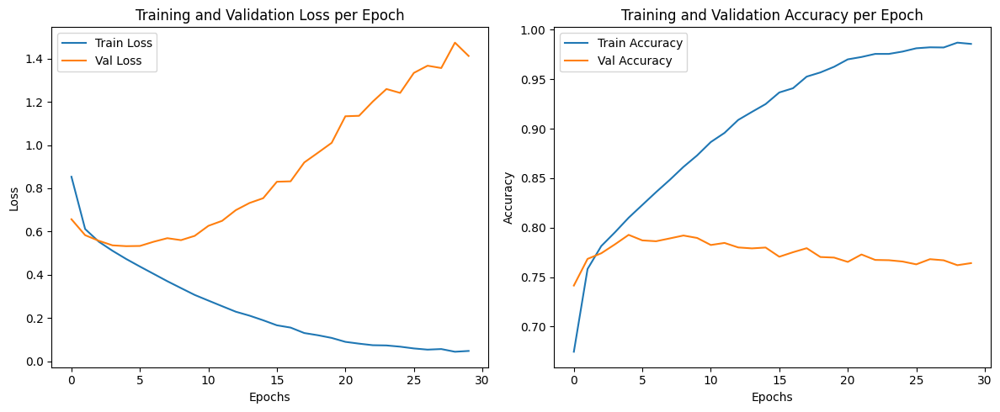


=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=128, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.8351 | Val Loss: 0.6445 | Train Acc: 0.6750 | Val Acc: 0.7496 | Time: 3.94s
Epoch 6/30 | Train Loss: 0.4371 | Val Loss: 0.5343 | Train Acc: 0.8233 | Val Acc: 0.7920 | Time: 4.11s
Epoch 11/30 | Train Loss: 0.2688 | Val Loss: 0.6737 | Train Acc: 0.8925 | Val Acc: 0.7857 | Time: 4.04s
Epoch 16/30 | Train Loss: 0.1520 | Val Loss: 0.9335 | Train Acc: 0.9424 | Val Acc: 0.7786 | Time: 4.02s
Epoch 21/30 | Train Loss: 0.0881 | Val Loss: 1.1793 | Train Acc: 0.9687 | Val Acc: 0.7741 | Time: 3.88s
Epoch 26/30 | Train Loss: 0.0592 | Val Loss: 1.4220 | Train Acc: 0.9804 | Val Acc: 0.7644 | Time: 3.96s
Epoch 30/30 | Train Loss: 0.0459 | Val Loss: 1.4141 | Train Acc: 0.9848 | Val Acc: 0.7669 | Time: 3.95s
Maximum accuracy: 0.7920265780730897 obtained at epoch 6
Final accuracy: 0.7668723303274798
Final loss: 1.4141219973564148

Weighted F1-score: 0.7653

Classification Report:

                      pr

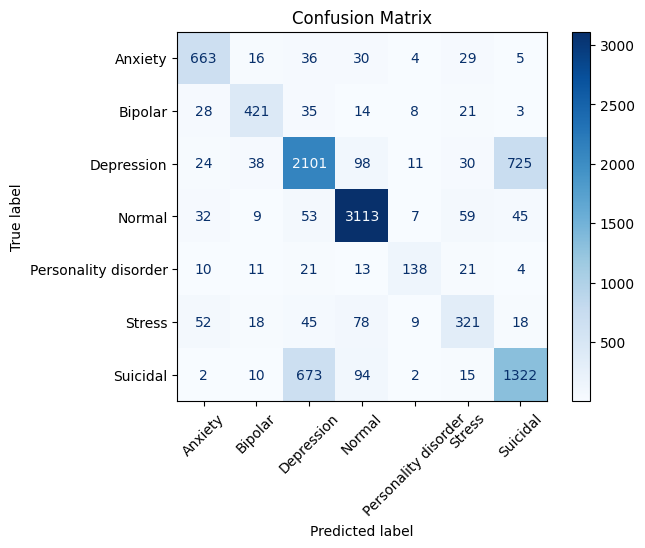

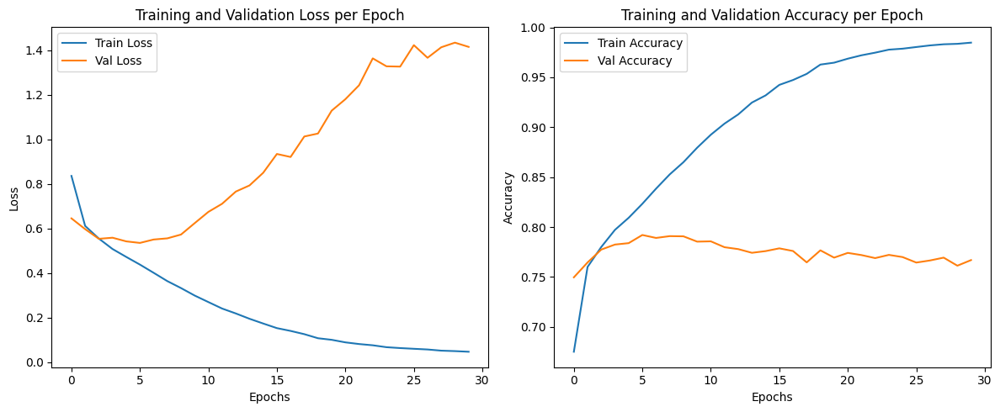


=== Entrenando ImprovedGRU: dropout=0.3, hidden_dim=128, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.8669 | Val Loss: 0.6481 | Train Acc: 0.6593 | Val Acc: 0.7485 | Time: 5.51s
Epoch 6/30 | Train Loss: 0.4499 | Val Loss: 0.5365 | Train Acc: 0.8176 | Val Acc: 0.7890 | Time: 5.54s
Epoch 11/30 | Train Loss: 0.2915 | Val Loss: 0.6546 | Train Acc: 0.8831 | Val Acc: 0.7804 | Time: 5.56s
Epoch 16/30 | Train Loss: 0.1766 | Val Loss: 0.9236 | Train Acc: 0.9313 | Val Acc: 0.7732 | Time: 6.09s
Epoch 21/30 | Train Loss: 0.1033 | Val Loss: 1.1628 | Train Acc: 0.9626 | Val Acc: 0.7672 | Time: 5.42s
Epoch 26/30 | Train Loss: 0.0728 | Val Loss: 1.2234 | Train Acc: 0.9744 | Val Acc: 0.7646 | Time: 5.42s
Epoch 30/30 | Train Loss: 0.0617 | Val Loss: 1.4064 | Train Acc: 0.9786 | Val Acc: 0.7645 | Time: 5.50s
Maximum accuracy: 0.7945894636924538 obtained at epoch 8
Final accuracy: 0.7644992880873279
Final loss: 1.406408373153571

Weighted F1-score: 0.7616

Classification Report:

                      pre

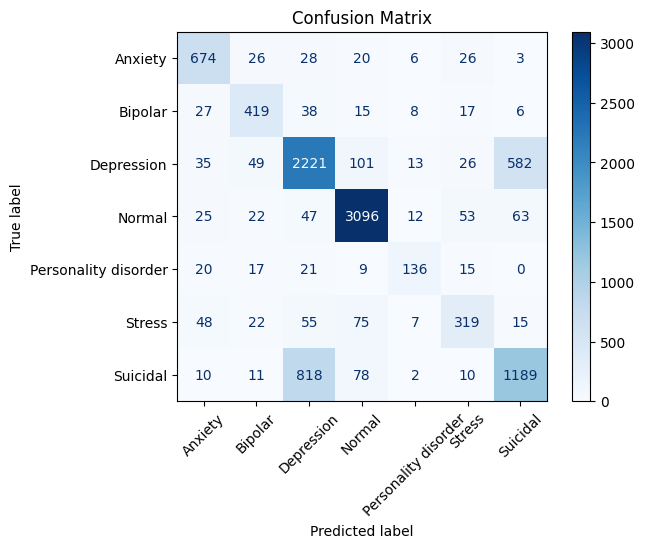

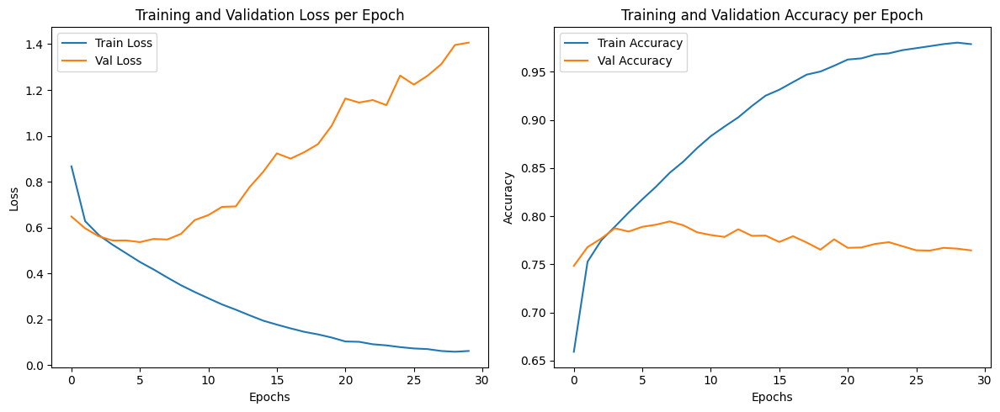


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=64, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.9042 | Val Loss: 0.6650 | Train Acc: 0.6606 | Val Acc: 0.7486 | Time: 2.32s
Epoch 6/30 | Train Loss: 0.4884 | Val Loss: 0.5341 | Train Acc: 0.8050 | Val Acc: 0.7894 | Time: 2.24s
Epoch 11/30 | Train Loss: 0.3865 | Val Loss: 0.5759 | Train Acc: 0.8445 | Val Acc: 0.7813 | Time: 2.47s
Epoch 16/30 | Train Loss: 0.3123 | Val Loss: 0.6308 | Train Acc: 0.8741 | Val Acc: 0.7784 | Time: 2.79s
Epoch 21/30 | Train Loss: 0.2553 | Val Loss: 0.7258 | Train Acc: 0.8985 | Val Acc: 0.7738 | Time: 2.87s
Epoch 26/30 | Train Loss: 0.2079 | Val Loss: 0.8472 | Train Acc: 0.9179 | Val Acc: 0.7698 | Time: 2.49s
Epoch 30/30 | Train Loss: 0.1821 | Val Loss: 0.9015 | Train Acc: 0.9290 | Val Acc: 0.7681 | Time: 2.27s
Maximum accuracy: 0.7906027527289986 obtained at epoch 12
Final accuracy: 0.7681063122923588
Final loss: 0.9014909101255012

Weighted F1-score: 0.7671

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81    

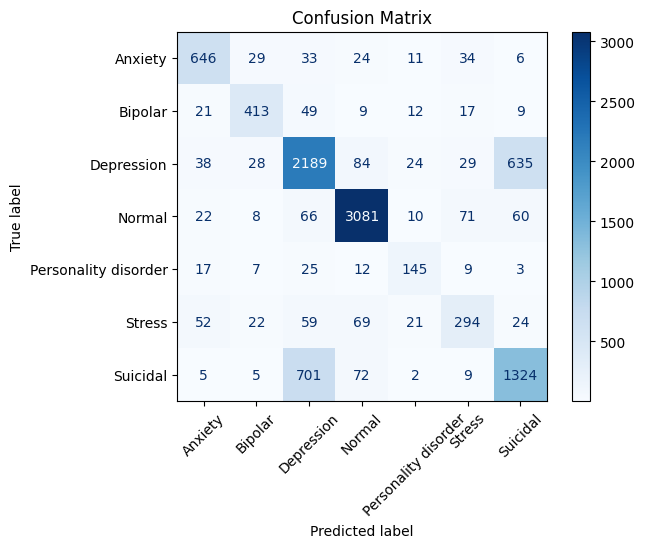

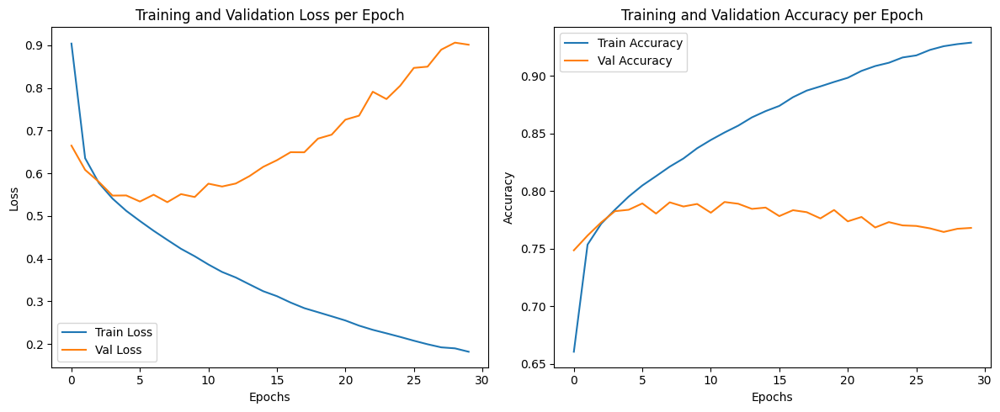


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=64, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.9034 | Val Loss: 0.6711 | Train Acc: 0.6521 | Val Acc: 0.7366 | Time: 2.57s
Epoch 6/30 | Train Loss: 0.4888 | Val Loss: 0.5370 | Train Acc: 0.8053 | Val Acc: 0.7885 | Time: 2.52s
Epoch 11/30 | Train Loss: 0.3876 | Val Loss: 0.5839 | Train Acc: 0.8441 | Val Acc: 0.7848 | Time: 2.49s
Epoch 16/30 | Train Loss: 0.3189 | Val Loss: 0.6942 | Train Acc: 0.8703 | Val Acc: 0.7670 | Time: 2.49s
Epoch 21/30 | Train Loss: 0.2628 | Val Loss: 0.7778 | Train Acc: 0.8953 | Val Acc: 0.7748 | Time: 2.48s
Epoch 26/30 | Train Loss: 0.2231 | Val Loss: 0.8507 | Train Acc: 0.9119 | Val Acc: 0.7718 | Time: 2.49s
Epoch 30/30 | Train Loss: 0.1977 | Val Loss: 0.9346 | Train Acc: 0.9234 | Val Acc: 0.7685 | Time: 2.52s
Maximum accuracy: 0.7932605600379686 obtained at epoch 7
Final accuracy: 0.7684859990507831
Final loss: 0.9345816294352214

Weighted F1-score: 0.7682

Classification Report:

                      pre

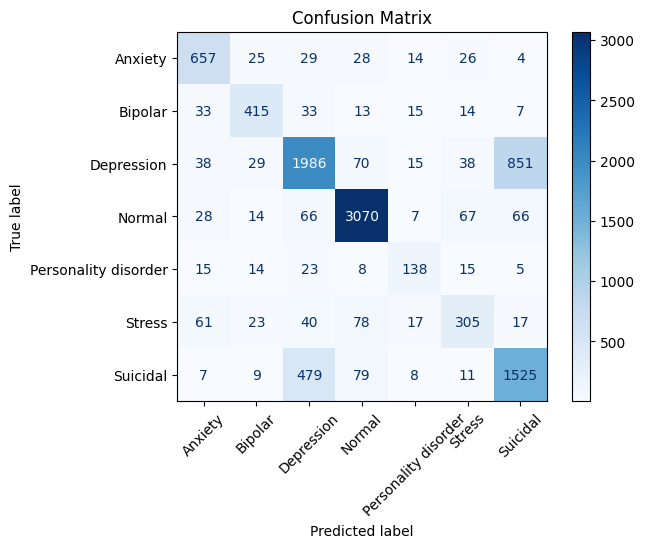

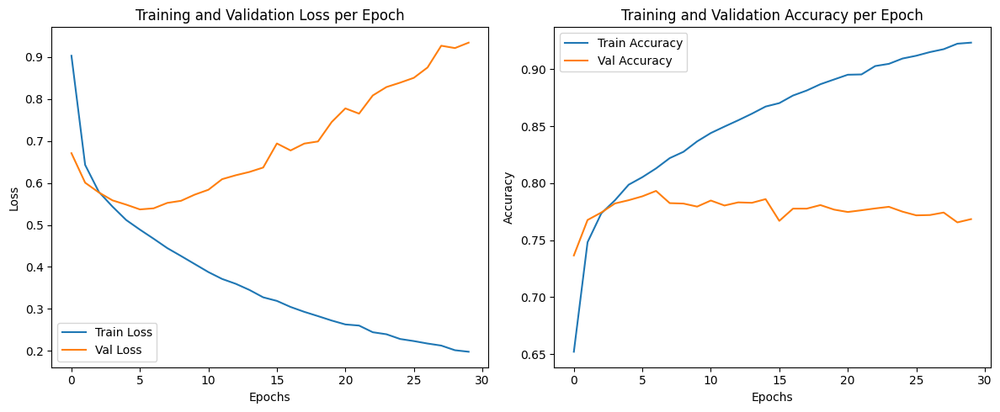


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=64, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.9389 | Val Loss: 0.7211 | Train Acc: 0.6301 | Val Acc: 0.7168 | Time: 3.40s
Epoch 6/30 | Train Loss: 0.5068 | Val Loss: 0.5758 | Train Acc: 0.7982 | Val Acc: 0.7715 | Time: 3.51s
Epoch 11/30 | Train Loss: 0.4082 | Val Loss: 0.5889 | Train Acc: 0.8382 | Val Acc: 0.7853 | Time: 2.82s
Epoch 16/30 | Train Loss: 0.3371 | Val Loss: 0.6352 | Train Acc: 0.8658 | Val Acc: 0.7793 | Time: 2.80s
Epoch 21/30 | Train Loss: 0.2847 | Val Loss: 0.7511 | Train Acc: 0.8874 | Val Acc: 0.7715 | Time: 2.76s
Epoch 26/30 | Train Loss: 0.2404 | Val Loss: 0.8477 | Train Acc: 0.9071 | Val Acc: 0.7691 | Time: 2.81s
Epoch 30/30 | Train Loss: 0.2134 | Val Loss: 0.8830 | Train Acc: 0.9196 | Val Acc: 0.7685 | Time: 2.76s
Maximum accuracy: 0.7852871381110583 obtained at epoch 11
Final accuracy: 0.7684859990507831
Final loss: 0.883033113226746

Weighted F1-score: 0.7670

Classification Report:

                      pre

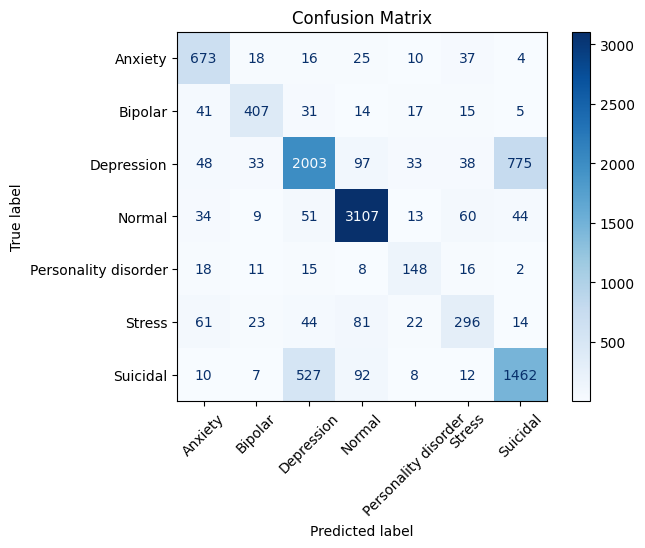

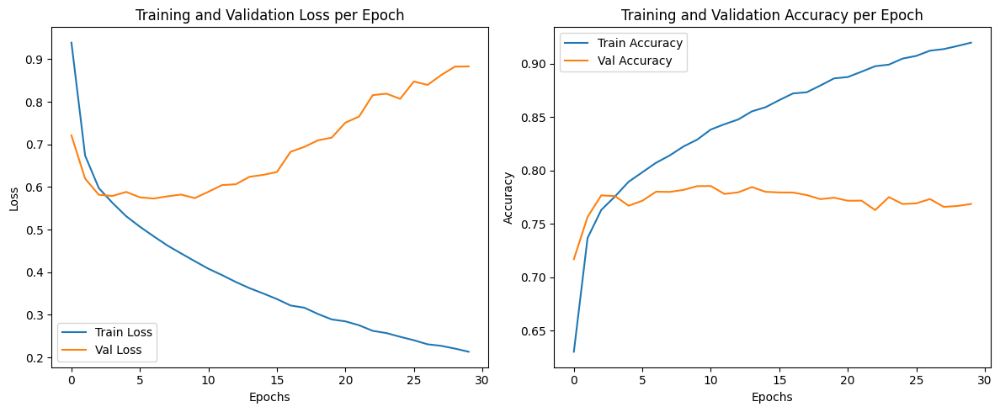


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=128, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.8537 | Val Loss: 0.6569 | Train Acc: 0.6745 | Val Acc: 0.7414 | Time: 3.34s
Epoch 6/30 | Train Loss: 0.4380 | Val Loss: 0.5333 | Train Acc: 0.8229 | Val Acc: 0.7871 | Time: 2.99s
Epoch 11/30 | Train Loss: 0.2804 | Val Loss: 0.6264 | Train Acc: 0.8865 | Val Acc: 0.7824 | Time: 2.82s
Epoch 16/30 | Train Loss: 0.1660 | Val Loss: 0.8305 | Train Acc: 0.9366 | Val Acc: 0.7706 | Time: 2.74s
Epoch 21/30 | Train Loss: 0.0894 | Val Loss: 1.1336 | Train Acc: 0.9701 | Val Acc: 0.7654 | Time: 2.58s
Epoch 26/30 | Train Loss: 0.0589 | Val Loss: 1.3343 | Train Acc: 0.9813 | Val Acc: 0.7629 | Time: 2.55s
Epoch 30/30 | Train Loss: 0.0472 | Val Loss: 1.4128 | Train Acc: 0.9857 | Val Acc: 0.7641 | Time: 2.93s
Maximum accuracy: 0.7926910299003322 obtained at epoch 5
Final accuracy: 0.7641196013289037
Final loss: 1.4127692392378142

Weighted F1-score: 0.7628

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81     

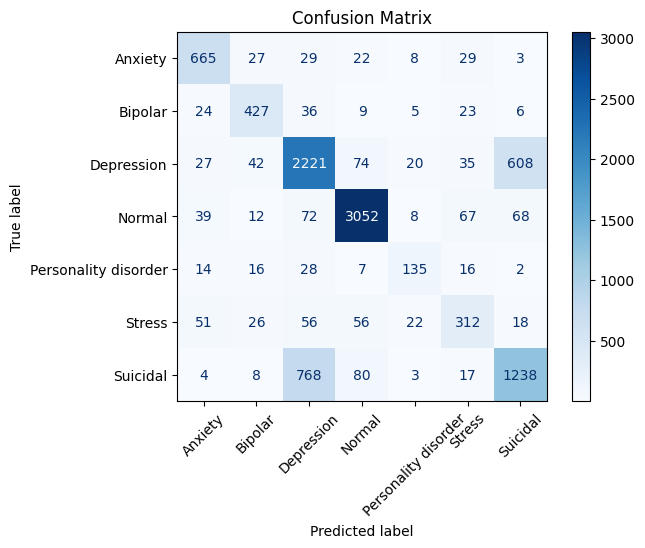

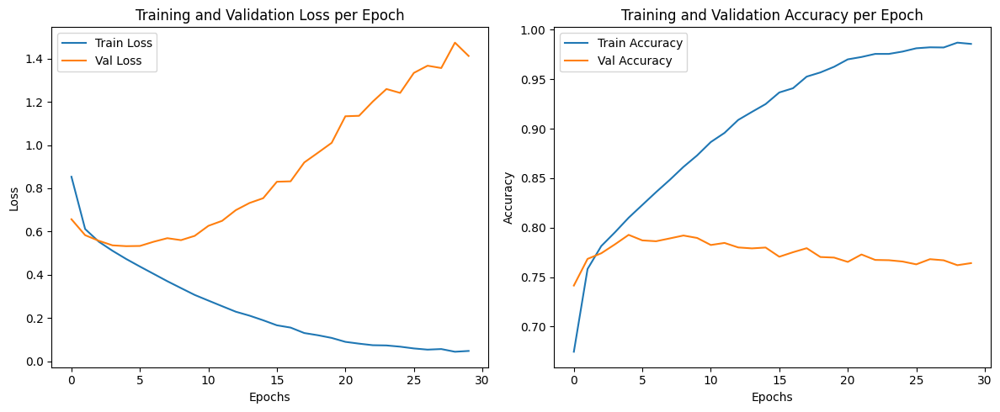


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=128, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.8382 | Val Loss: 0.6432 | Train Acc: 0.6726 | Val Acc: 0.7524 | Time: 3.93s
Epoch 6/30 | Train Loss: 0.4439 | Val Loss: 0.5362 | Train Acc: 0.8217 | Val Acc: 0.7927 | Time: 4.26s
Epoch 11/30 | Train Loss: 0.2820 | Val Loss: 0.6940 | Train Acc: 0.8865 | Val Acc: 0.7798 | Time: 4.05s
Epoch 16/30 | Train Loss: 0.1684 | Val Loss: 0.9443 | Train Acc: 0.9375 | Val Acc: 0.7703 | Time: 4.03s
Epoch 21/30 | Train Loss: 0.0992 | Val Loss: 1.1710 | Train Acc: 0.9652 | Val Acc: 0.7678 | Time: 3.89s
Epoch 26/30 | Train Loss: 0.0662 | Val Loss: 1.3476 | Train Acc: 0.9776 | Val Acc: 0.7676 | Time: 4.02s
Epoch 30/30 | Train Loss: 0.0534 | Val Loss: 1.4462 | Train Acc: 0.9830 | Val Acc: 0.7668 | Time: 3.97s
Maximum accuracy: 0.7929757949691505 obtained at epoch 8
Final accuracy: 0.7667774086378738
Final loss: 1.4462265448136764

Weighted F1-score: 0.7666

Classification Report:

                      pr

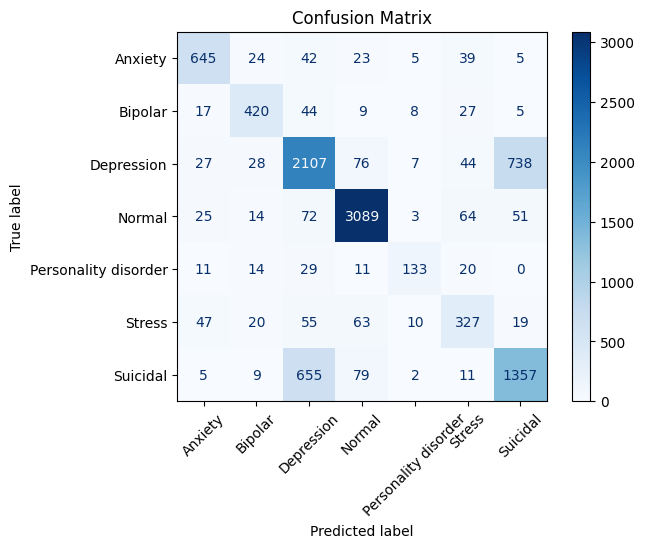

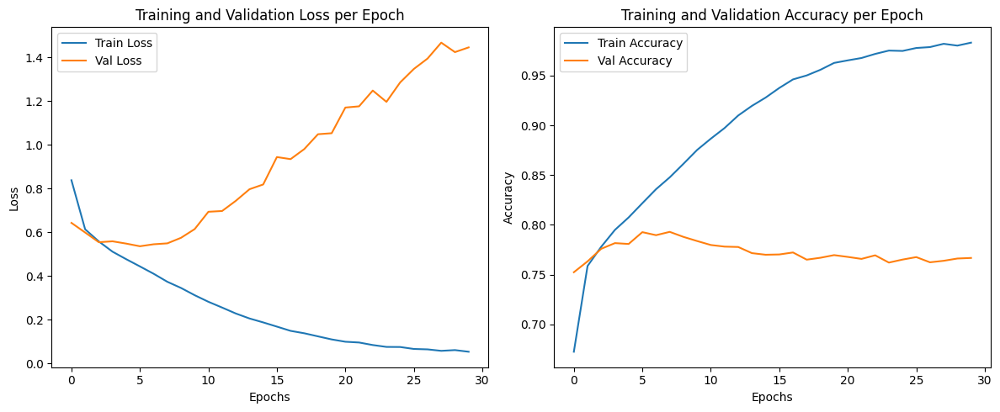


=== Entrenando ImprovedGRU: dropout=0.5, hidden_dim=128, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.8724 | Val Loss: 0.6491 | Train Acc: 0.6572 | Val Acc: 0.7483 | Time: 5.43s
Epoch 6/30 | Train Loss: 0.4580 | Val Loss: 0.5468 | Train Acc: 0.8151 | Val Acc: 0.7888 | Time: 5.53s
Epoch 11/30 | Train Loss: 0.3077 | Val Loss: 0.6623 | Train Acc: 0.8757 | Val Acc: 0.7769 | Time: 5.46s
Epoch 16/30 | Train Loss: 0.2096 | Val Loss: 0.8546 | Train Acc: 0.9186 | Val Acc: 0.7806 | Time: 5.48s
Epoch 21/30 | Train Loss: 0.1377 | Val Loss: 1.0670 | Train Acc: 0.9501 | Val Acc: 0.7665 | Time: 5.50s
Epoch 26/30 | Train Loss: 0.0960 | Val Loss: 1.1566 | Train Acc: 0.9659 | Val Acc: 0.7714 | Time: 5.50s
Epoch 30/30 | Train Loss: 0.0750 | Val Loss: 1.3434 | Train Acc: 0.9752 | Val Acc: 0.7619 | Time: 5.44s
Maximum accuracy: 0.7907925961082107 obtained at epoch 8
Final accuracy: 0.7619364024679639
Final loss: 1.34342935591033

Weighted F1-score: 0.7584

Classification Report:

                      prec

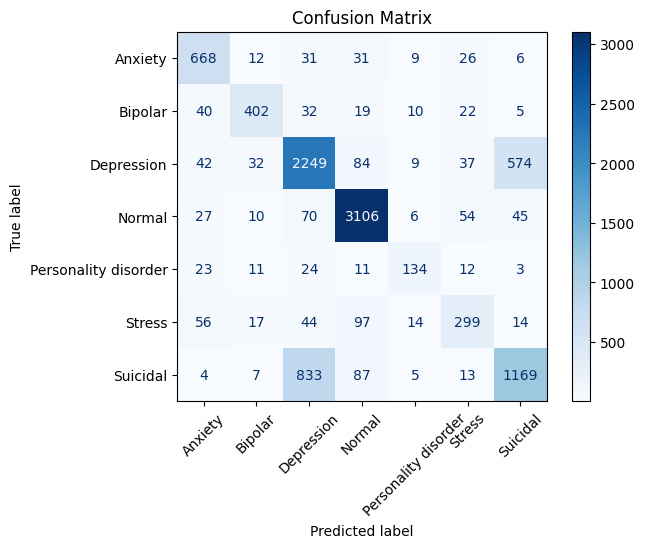

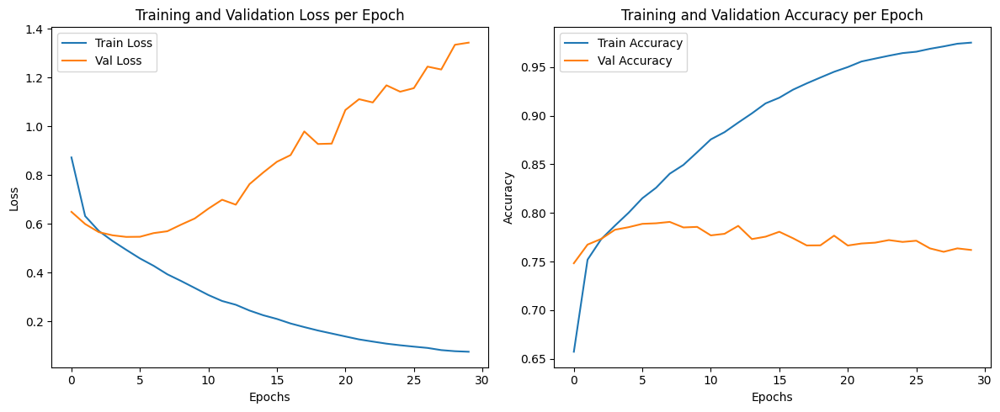


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=64, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.7 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.9042 | Val Loss: 0.6650 | Train Acc: 0.6606 | Val Acc: 0.7486 | Time: 3.06s
Epoch 6/30 | Train Loss: 0.4884 | Val Loss: 0.5341 | Train Acc: 0.8050 | Val Acc: 0.7894 | Time: 3.00s
Epoch 11/30 | Train Loss: 0.3865 | Val Loss: 0.5759 | Train Acc: 0.8445 | Val Acc: 0.7813 | Time: 2.63s
Epoch 16/30 | Train Loss: 0.3123 | Val Loss: 0.6308 | Train Acc: 0.8741 | Val Acc: 0.7784 | Time: 2.37s
Epoch 21/30 | Train Loss: 0.2553 | Val Loss: 0.7258 | Train Acc: 0.8985 | Val Acc: 0.7738 | Time: 2.25s
Epoch 26/30 | Train Loss: 0.2079 | Val Loss: 0.8472 | Train Acc: 0.9179 | Val Acc: 0.7698 | Time: 2.27s
Epoch 30/30 | Train Loss: 0.1821 | Val Loss: 0.9015 | Train Acc: 0.9290 | Val Acc: 0.7681 | Time: 2.25s
Maximum accuracy: 0.7906027527289986 obtained at epoch 12
Final accuracy: 0.7681063122923588
Final loss: 0.9014909101255012

Weighted F1-score: 0.7671

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81    

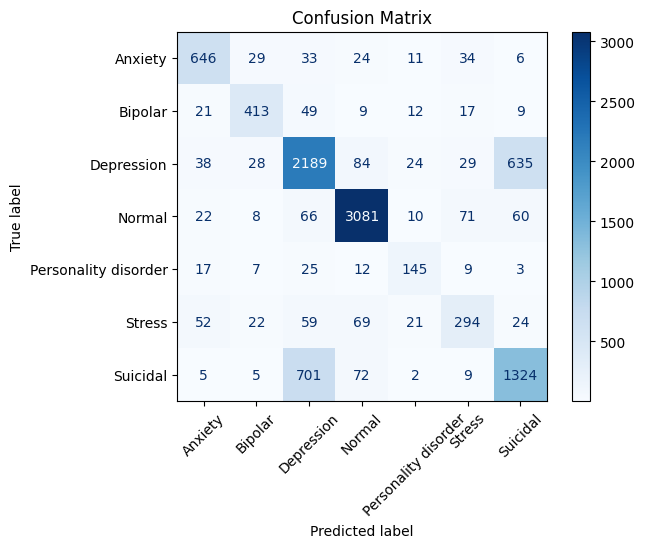

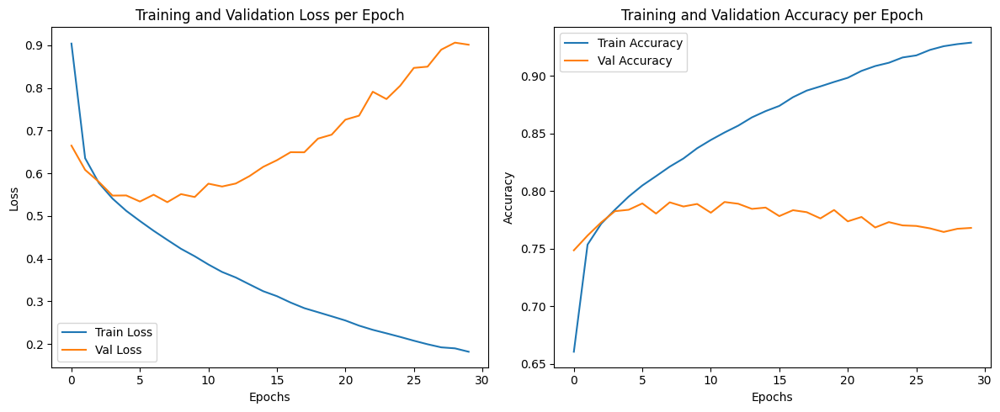


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=64, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.9098 | Val Loss: 0.6779 | Train Acc: 0.6500 | Val Acc: 0.7340 | Time: 2.61s
Epoch 6/30 | Train Loss: 0.4999 | Val Loss: 0.5474 | Train Acc: 0.8012 | Val Acc: 0.7862 | Time: 2.48s
Epoch 11/30 | Train Loss: 0.4057 | Val Loss: 0.6028 | Train Acc: 0.8363 | Val Acc: 0.7806 | Time: 2.50s
Epoch 16/30 | Train Loss: 0.3334 | Val Loss: 0.6799 | Train Acc: 0.8654 | Val Acc: 0.7729 | Time: 2.49s
Epoch 21/30 | Train Loss: 0.2807 | Val Loss: 0.7814 | Train Acc: 0.8881 | Val Acc: 0.7772 | Time: 2.51s
Epoch 26/30 | Train Loss: 0.2429 | Val Loss: 0.9152 | Train Acc: 0.9043 | Val Acc: 0.7677 | Time: 2.51s
Epoch 30/30 | Train Loss: 0.2232 | Val Loss: 0.9057 | Train Acc: 0.9131 | Val Acc: 0.7723 | Time: 2.48s
Maximum accuracy: 0.78984337921215 obtained at epoch 7
Final accuracy: 0.7722828666350261
Final loss: 0.905685249874086

Weighted F1-score: 0.7720

Classification Report:

                      precis

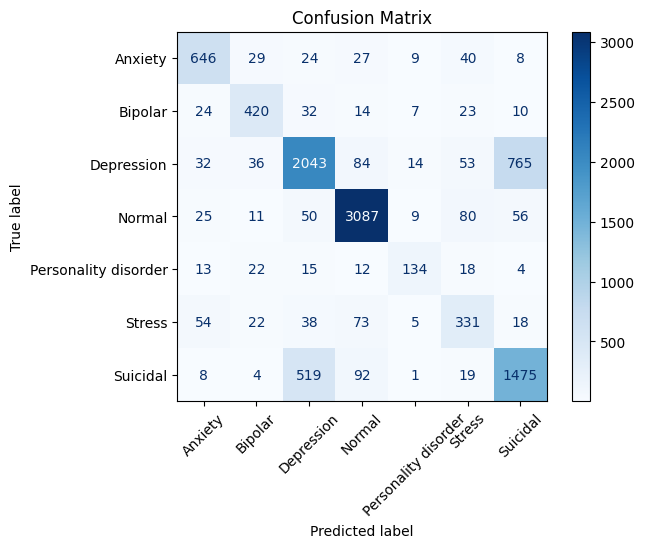

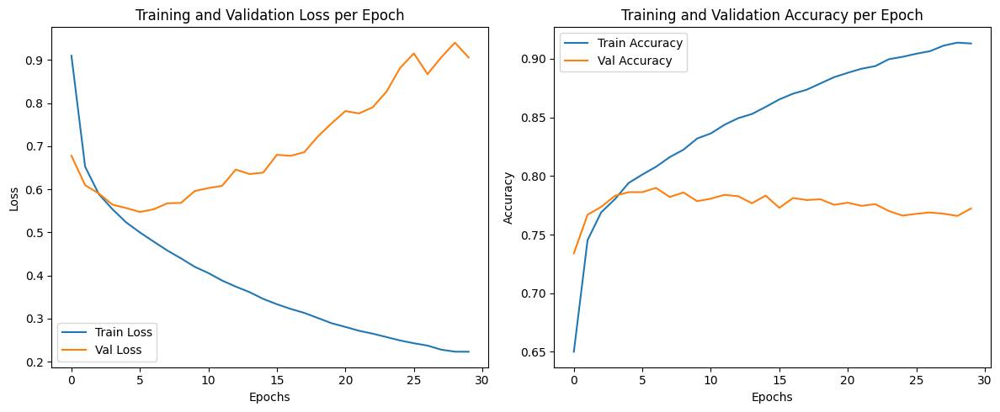


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=64, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.9532 | Val Loss: 0.7464 | Train Acc: 0.6231 | Val Acc: 0.7082 | Time: 2.82s
Epoch 6/30 | Train Loss: 0.5160 | Val Loss: 0.6146 | Train Acc: 0.7946 | Val Acc: 0.7632 | Time: 3.18s
Epoch 11/30 | Train Loss: 0.4266 | Val Loss: 0.6080 | Train Acc: 0.8314 | Val Acc: 0.7804 | Time: 3.63s
Epoch 16/30 | Train Loss: 0.3567 | Val Loss: 0.6671 | Train Acc: 0.8608 | Val Acc: 0.7799 | Time: 3.01s
Epoch 21/30 | Train Loss: 0.3057 | Val Loss: 0.7666 | Train Acc: 0.8808 | Val Acc: 0.7696 | Time: 2.75s
Epoch 26/30 | Train Loss: 0.2665 | Val Loss: 0.8531 | Train Acc: 0.8994 | Val Acc: 0.7698 | Time: 2.73s
Epoch 30/30 | Train Loss: 0.2397 | Val Loss: 0.9294 | Train Acc: 0.9101 | Val Acc: 0.7584 | Time: 2.73s
Maximum accuracy: 0.7844328429046037 obtained at epoch 14
Final accuracy: 0.7584242999525391
Final loss: 0.9294391622145971

Weighted F1-score: 0.7601

Classification Report:

                      pr

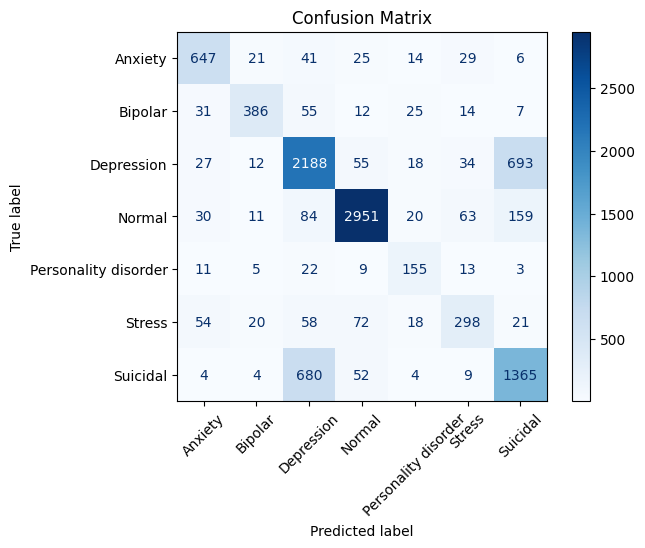

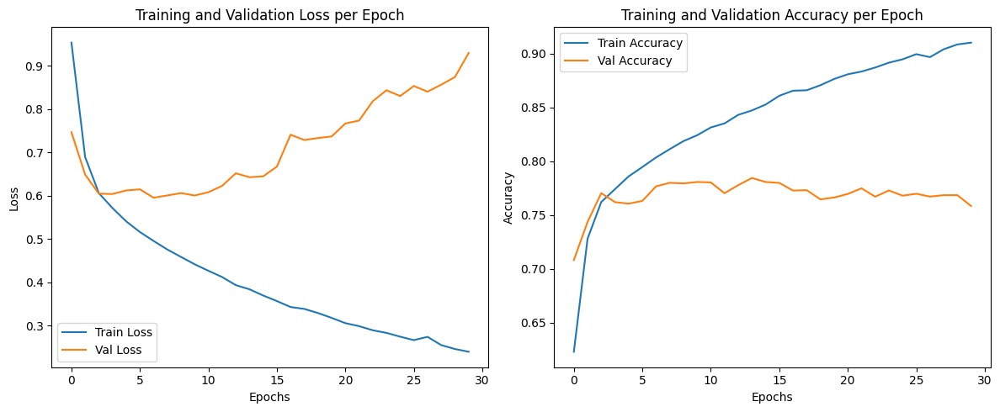


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=128, num_layers=1 ===


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.7 and num_layers=1
  warnings.warn(


Epoch 1/30 | Train Loss: 0.8537 | Val Loss: 0.6569 | Train Acc: 0.6745 | Val Acc: 0.7414 | Time: 2.66s
Epoch 6/30 | Train Loss: 0.4380 | Val Loss: 0.5333 | Train Acc: 0.8229 | Val Acc: 0.7871 | Time: 2.61s
Epoch 11/30 | Train Loss: 0.2804 | Val Loss: 0.6264 | Train Acc: 0.8865 | Val Acc: 0.7824 | Time: 2.70s
Epoch 16/30 | Train Loss: 0.1660 | Val Loss: 0.8305 | Train Acc: 0.9366 | Val Acc: 0.7706 | Time: 2.63s
Epoch 21/30 | Train Loss: 0.0894 | Val Loss: 1.1336 | Train Acc: 0.9701 | Val Acc: 0.7654 | Time: 2.58s
Epoch 26/30 | Train Loss: 0.0589 | Val Loss: 1.3343 | Train Acc: 0.9813 | Val Acc: 0.7629 | Time: 2.56s
Epoch 30/30 | Train Loss: 0.0472 | Val Loss: 1.4128 | Train Acc: 0.9857 | Val Acc: 0.7641 | Time: 2.56s
Maximum accuracy: 0.7926910299003322 obtained at epoch 5
Final accuracy: 0.7641196013289037
Final loss: 1.4127692392378142

Weighted F1-score: 0.7628

Classification Report:

                      precision    recall  f1-score   support

             Anxiety       0.81     

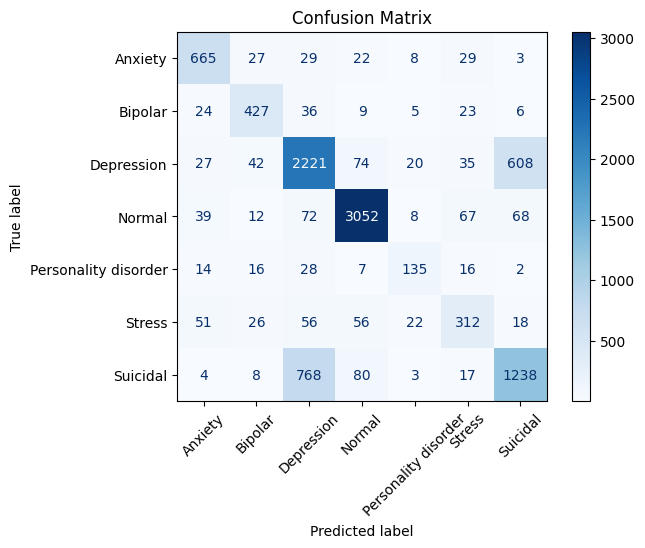

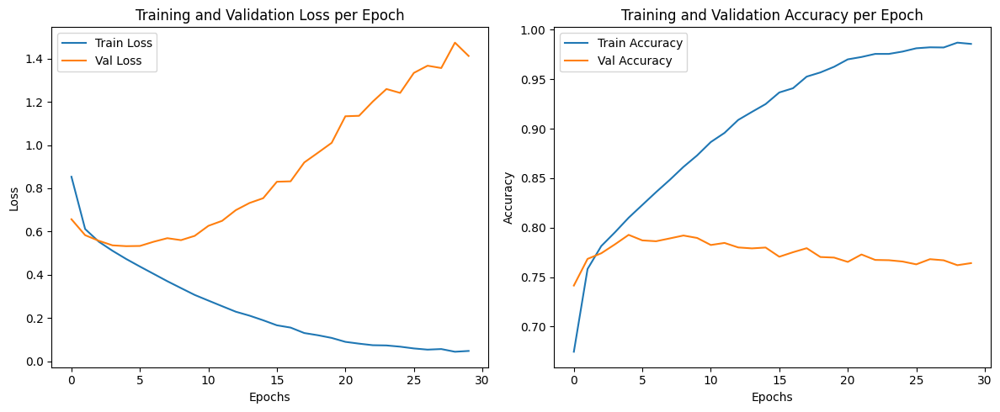


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=128, num_layers=2 ===
Epoch 1/30 | Train Loss: 0.8439 | Val Loss: 0.6504 | Train Acc: 0.6719 | Val Acc: 0.7527 | Time: 3.98s
Epoch 6/30 | Train Loss: 0.4540 | Val Loss: 0.5395 | Train Acc: 0.8169 | Val Acc: 0.7898 | Time: 3.99s
Epoch 11/30 | Train Loss: 0.3003 | Val Loss: 0.6651 | Train Acc: 0.8806 | Val Acc: 0.7836 | Time: 4.22s
Epoch 16/30 | Train Loss: 0.1889 | Val Loss: 0.9094 | Train Acc: 0.9281 | Val Acc: 0.7712 | Time: 3.92s
Epoch 21/30 | Train Loss: 0.1169 | Val Loss: 1.1336 | Train Acc: 0.9596 | Val Acc: 0.7714 | Time: 4.05s
Epoch 26/30 | Train Loss: 0.0811 | Val Loss: 1.3486 | Train Acc: 0.9743 | Val Acc: 0.7586 | Time: 3.92s
Epoch 30/30 | Train Loss: 0.0689 | Val Loss: 1.3792 | Train Acc: 0.9786 | Val Acc: 0.7591 | Time: 4.07s
Maximum accuracy: 0.7899383009017561 obtained at epoch 9
Final accuracy: 0.7590887517797816
Final loss: 1.3791969924262075

Weighted F1-score: 0.7585

Classification Report:

                      pr

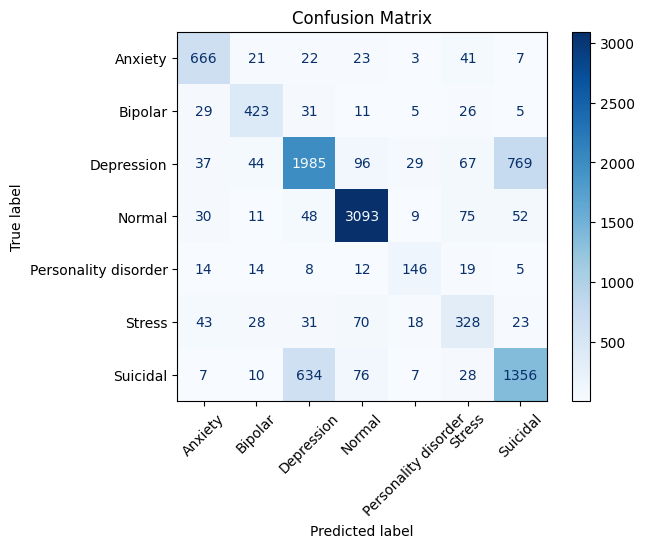

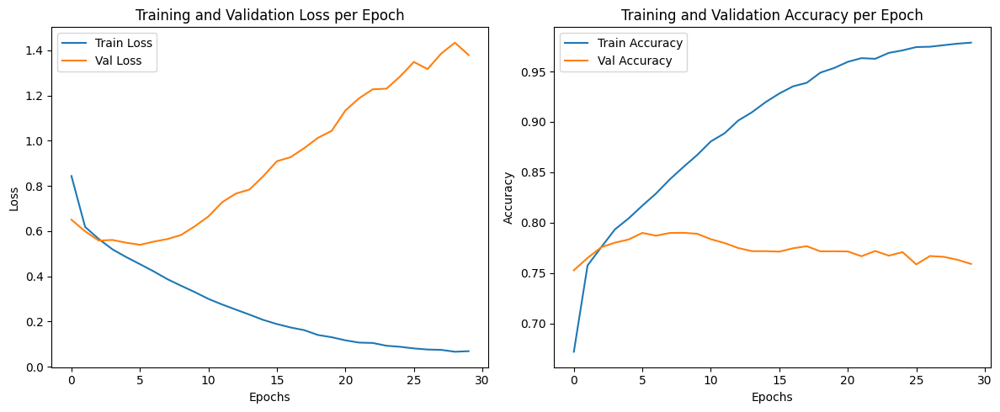


=== Entrenando ImprovedGRU: dropout=0.7, hidden_dim=128, num_layers=3 ===
Epoch 1/30 | Train Loss: 0.8832 | Val Loss: 0.6604 | Train Acc: 0.6526 | Val Acc: 0.7468 | Time: 5.49s
Epoch 6/30 | Train Loss: 0.4754 | Val Loss: 0.5644 | Train Acc: 0.8076 | Val Acc: 0.7832 | Time: 5.55s
Epoch 11/30 | Train Loss: 0.3317 | Val Loss: 0.6517 | Train Acc: 0.8653 | Val Acc: 0.7860 | Time: 5.38s
Epoch 16/30 | Train Loss: 0.2340 | Val Loss: 0.8059 | Train Acc: 0.9086 | Val Acc: 0.7844 | Time: 5.35s
Epoch 21/30 | Train Loss: 0.1674 | Val Loss: 0.9914 | Train Acc: 0.9383 | Val Acc: 0.7719 | Time: 5.36s
Epoch 26/30 | Train Loss: 0.1130 | Val Loss: 1.1849 | Train Acc: 0.9616 | Val Acc: 0.7692 | Time: 5.36s
Epoch 30/30 | Train Loss: 0.0867 | Val Loss: 1.3078 | Train Acc: 0.9723 | Val Acc: 0.7649 | Time: 5.42s
Maximum accuracy: 0.7878500237304225 obtained at epoch 5
Final accuracy: 0.7648789748457523
Final loss: 1.3077979892492295

Weighted F1-score: 0.7626

Classification Report:

                      pr

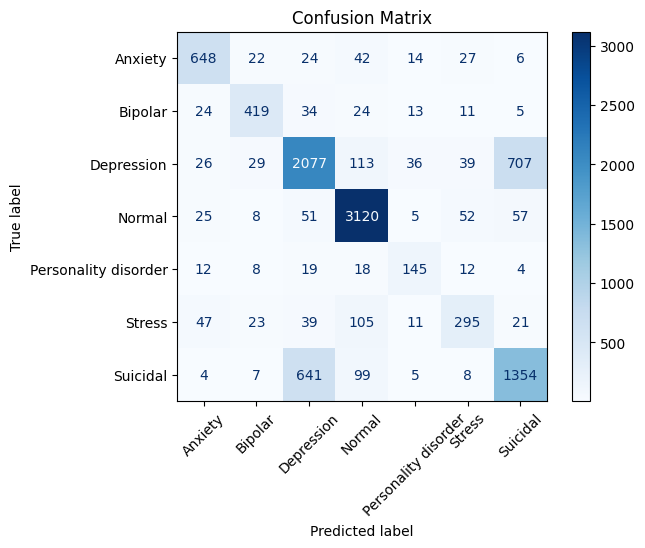

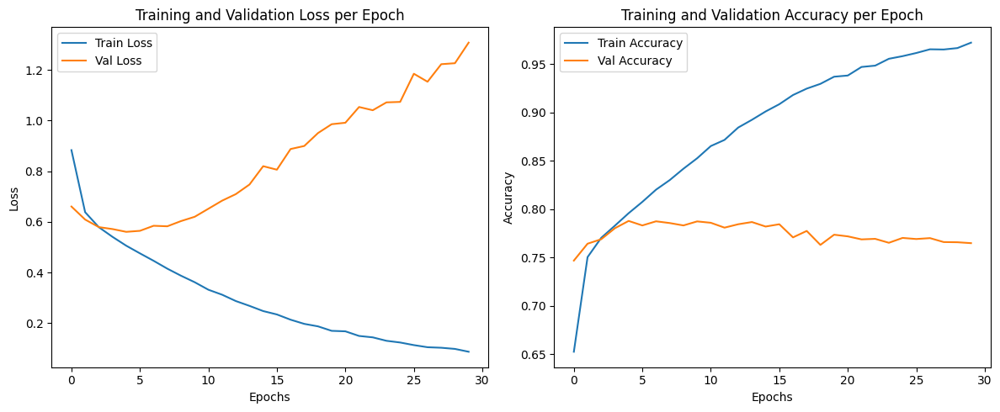

,dropout,hidden_dim,num_layers,max_val_acc,final_val_acc,min_val_loss,final_val_loss
0,0.3,128,3,0.794589,0.764499,0.536483,1.406408
1,0.5,64,2,0.793261,0.768486,0.537009,0.934582
2,0.5,128,2,0.792976,0.766777,0.536150,1.446227
3,0.3,128,1,0.792691,0.764120,0.532363,1.412769
4,0.7,128,1,0.792691,0.764120,0.532363,1.412769
5,0.5,128,1,0.792691,0.764120,0.532363,1.412769
6,0.3,128,2,0.792027,0.766872,0.534338,1.414122
7,0.5,128,3,0.790793,0.761936,0.546250,1.343429
8,0.5,64,1,0.790603,0.768106,0.532563,0.901491
9,0.3,64,1,0.790603,0.768106,0.532563,0.901491


In [ ]:
# 1. Data cleaning
final_data = data.copy()
final_data = final_data[final_data['statement'].str.len() < 15000]
final_data['statement'] = final_data['statement'].apply(clean_text)

# 2. Prepare dataset with the predefined tokenizer
train_loader, test_loader, label_encoder = prepare_dataset_for_lstm_with_tokenizer(
    dataframe=final_data,
    tokenizer=tokenizer, # from "Prepare Tokenizer" cell
    text_col="statement",
    label_col="status",
    max_seq_len=MAX_SEQ_LEN,
    test_size=TEST_SIZE,
    batch_size=64,
    random_state=RANDOM_STATE
)

# 3. GloVe embeddings
glove_path = '/content/drive/Shareddrives/UPF_Deep_Learning_2025/FinalProject/data/glove.6B.200d.txt'

#load glove embeddings
def load_glove_embeddings(glove_file, embedding_dim):
    embeddings_index = {}
    with open(glove_file, encoding='utf-8') as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            vector = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = vector
    print(f"Loaded {len(embeddings_index)} word vectors from GloVe.")
    return embeddings_index

embedding_dim = 200
embeddings_index = load_glove_embeddings(glove_path, embedding_dim)

glove_embedding_matrix = build_embedding_matrix_from_glove(
    tokenizer=tokenizer, # from "Prepare Tokenizer" cell
    glove_index=embeddings_index,
    embedding_dim=embedding_dim,
    max_vocab_size=MAX_VOCAB_SIZE
)

# 4. Hyperparameters
dropout_values = [0.3, 0.5, 0.7]
hidden_dims = [64, 128]
num_layers_list = [1, 2, 3]
learning_rate = 0.001
output_dim = len(label_encoder.classes_)

# 5. Train the model
results_grid = []

for dropout_value in dropout_values:
    for hidden_dim in hidden_dims:
        for num_layers in num_layers_list:
            print(f"\n=== Entrenando ImprovedGRU: dropout={dropout_value}, hidden_dim={hidden_dim}, num_layers={num_layers} ===")
            torch.manual_seed(42)
            np.random.seed(42)
            random.seed(42)

            # Modelo
            model_gru_improved = ImprovedGRU(
                embedding_matrix=glove_embedding_matrix,
                hidden_dim=hidden_dim,
                output_dim=len(label_encoder.classes_),
                dropout_value=dropout_value,
                num_layers=num_layers
            )

            loss_function = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(model_gru_improved.parameters(), lr=0.001)

            model_improved_gru, train_losses, val_losses, train_accuracies, val_accuracies, all_preds, all_labels = train_model(
                model=model_gru_improved,
                train_loader=train_loader,
                test_loader=test_loader,
                loss_function=loss_function,
                optimizer=optimizer,
                num_epochs=30
            )

            name = f"improved_gru/dropout{dropout_value}_hdim{hidden_dim}_layers{num_layers}"

            evaluate_model(
                label_encoder=label_encoder,
                all_preds=all_preds,
                all_labels=all_labels,
                train_losses=train_losses,
                val_losses=val_losses,
                train_accuracies=train_accuracies,
                val_accuracies=val_accuracies,
                save_name=name
            )

            torch.save(model_gru_improved.state_dict(), results_path + f"{name}_weights.pt")

            results_grid.append({
                "dropout": dropout_value,
                "hidden_dim": hidden_dim,
                "num_layers": num_layers,
                "max_val_acc": max(val_accuracies),
                "final_val_acc": val_accuracies[-1],
                "min_val_loss": min(val_losses),
                "final_val_loss": val_losses[-1]
            })

# Guarda resultados en CSV
results_grid_df = pd.DataFrame(results_grid)
results_grid_df = results_grid_df.sort_values("max_val_acc", ascending=False).reset_index(drop=True)
results_grid_df.to_csv(results_path + "improved_gru/results_grid.csv", index=False)
display(results_grid_df)

torch.save(model_gru_improved.state_dict(), results_path + 'models/model_improved_gru_weights.pt')